# Introduction to Data Visualization in Python

**Datasets**

In [9]:
mpg_path = 'data/auto-mpg.csv'
women_bach_path = 'data/percent-bachelors-degrees-women-usa.csv'
stocks_path = 'data/stocks.csv'

**Imports**

In [10]:
import pandas as pd
from pprint import pprint as pp
from itertools import combinations
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import zipfile
from pathlib import Path
import numpy as np
from sklearn.datasets import load_iris

**Pandas Configuration Options**

In [11]:
pd.set_option('max_columns', 200)
pd.set_option('max_rows', 300)
pd.set_option('display.expand_frame_repr', True)

**Functions**

In [12]:
def create_dir_save_file(dir_path: Path, path_: str):
    """
    Check if the path exists and create it if it does not.
    Check if the file exists and download it if it does not.
    """
    if not dir_path.parents[0].exists():
        dir_path.parents[0].mkdir(parents=True)
        print(f'Directory Created: {dir_path.parents[0]}')
    else:
        print('Directory Exists')
        
    if not dir_path.exists():
        r = requests.get(path_, allow_redirects=True)
        open(dir_path, 'wb').write(r.content)
        print(f'File Created: {dir_path.name}')
    else:
        print('File Exists')

**DataFrames**

In [13]:
mpg_path = Path(mpg_path)
# percentage of bachelors degrees awarded to women in the USA
women_path = Path(women_bach_path)
stocks_path = Path(stocks_path)

create_dir_save_file(mpg_path, mpg_path)
create_dir_save_file(women_path, women_bach_path)
create_dir_save_file(stocks_path, stocks_path)

Directory Exists
File Exists
Directory Exists
File Exists
Directory Exists
File Exists


In [14]:
df_mpg = pd.read_csv(mpg_path)
df_women = pd.read_csv(women_path)
df_stocks = pd.read_csv(stocks_path)

In [15]:
df_mpg.head()

,mpg,cyl,displ,hp,weight,accel,yr,origin,name
0,18.0,8,307.0,130,3504,12.0,70,US,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,US,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,US,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,US,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,US,ford torino


In [16]:
df_mpg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 392 entries, 0 to 391
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mpg     392 non-null    float64
 1   cyl     392 non-null    int64  
 2   displ   392 non-null    float64
 3   hp      392 non-null    int64  
 4   weight  392 non-null    int64  
 5   accel   392 non-null    float64
 6   yr      392 non-null    int64  
 7   origin  392 non-null    object 
 8   name    392 non-null    object 
dtypes: float64(3), int64(4), object(2)
memory usage: 27.7+ KB


In [17]:
df_women.head()

,Year,Agriculture,Architecture,Art and Performance,Biology,Business,Communications and Journalism,Computer Science,Education,Engineering,English,Foreign Languages,Health Professions,Math and Statistics,Physical Sciences,Psychology,Public Administration,Social Sciences and History
0,1970,4.229798,11.921005,59.7,29.088363,9.064439,35.3,13.6,74.535328,0.8,65.570923,73.8,77.1,38.0,13.8,44.4,68.4,36.8
1,1971,5.452797,12.003106,59.9,29.394403,9.503187,35.5,13.6,74.149204,1.0,64.556485,73.9,75.5,39.0,14.9,46.2,65.5,36.2
2,1972,7.420710,13.214594,60.4,29.810221,10.558962,36.6,14.9,73.554520,1.2,63.664263,74.6,76.9,40.2,14.8,47.6,62.6,36.1
3,1973,9.653602,14.791613,60.2,31.147915,12.804602,38.4,16.4,73.501814,1.6,62.941502,74.9,77.4,40.9,16.5,50.4,64.3,36.4
4,1974,14.074623,17.444688,61.9,32.996183,16.204850,40.5,18.9,73.336811,2.2,62.413412,75.3,77.9,41.8,18.2,52.6,66.1,37.3


In [18]:
df_women.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42 entries, 0 to 41
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Year                           42 non-null     int64  
 1   Agriculture                    42 non-null     float64
 2   Architecture                   42 non-null     float64
 3   Art and Performance            42 non-null     float64
 4   Biology                        42 non-null     float64
 5   Business                       42 non-null     float64
 6   Communications and Journalism  42 non-null     float64
 7   Computer Science               42 non-null     float64
 8   Education                      42 non-null     float64
 9   Engineering                    42 non-null     float64
 10  English                        42 non-null     float64
 11  Foreign Languages              42 non-null     float64
 12  Health Professions             42 non-null     float

In [19]:
df_stocks.head()

,Date,AAPL,IBM,CSCO,MSFT
0,2000-01-03,111.937502,116.0000,108.0625,116.5625
1,2000-01-04,102.500003,112.0625,102.0000,112.6250
2,2000-01-05,103.999997,116.0000,101.6875,113.8125
3,2000-01-06,94.999998,114.0000,100.0000,110.0000
4,2000-01-07,99.500001,113.5000,105.8750,111.4375


In [20]:
df_stocks.Date = pd.to_datetime(df_stocks.Date)
df_stocks.set_index('Date', inplace=True, drop=True)
df_stocks.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3521 entries, 2000-01-03 to 2013-12-31
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL    3521 non-null   float64
 1   IBM     3521 non-null   float64
 2   CSCO    3521 non-null   float64
 3   MSFT    3521 non-null   float64
dtypes: float64(4)
memory usage: 137.5 KB


# Customizing plots

Following a review of basic plotting with Matplotlib, this chapter delves into customizing plots using Matplotlib. This includes overlaying plots, making subplots, controlling axes, adding legends and annotations, and using different plot styles.

**Reminder: Line Plots**

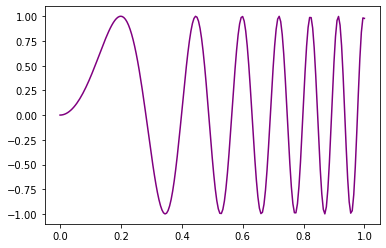

In [21]:
x = np.linspace(0, 1, 201)
y = np.sin((2*np.pi*x)**2)
plt.plot(x, y, 'purple')
plt.show()

**Reminder: Scatter Plots**

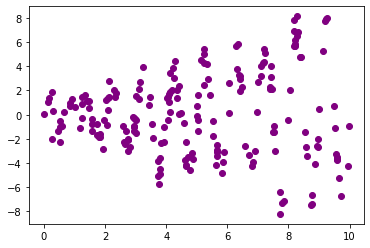

In [22]:
np.random.seed(256)
x = 10*np.random.rand(200,1)
y = (0.2 + 0.8*x) * np.sin(2*np.pi*x) + np.random.randn(200,1)
plt.scatter(x, y, color='purple')
plt.show()

**Reminder: Histograms**

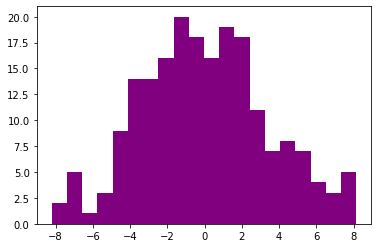

In [23]:
np.random.seed(256)
x = 10*np.random.rand(200,1)
y = (0.2 + 0.8*x) * np.sin(2*np.pi*x) + np.random.randn(200,1)
plt.hist(y, bins=20, color='purple')
plt.show()

**What you will learn**

* Customizing of plots: axes, annotations, legends
* Overlaying multiple plots and subplots
* Visualizing 2D arrays, 2D data sets
* Working with color maps
* Producing statistical graphics
* Plotting time series
* Working with images

## Plotting Multiple Graphs

**Strategies**

* Plotting many graphs on common axes
* Creating axes within a figure
* Creating subplots within a figure

In [24]:
austin_weather_path = Path('data/weather_data_austin_2010.csv')
df_weather = pd.read_csv(austin_weather_path)
df_weather.Date = pd.to_datetime(df_weather.Date)
df_weather.set_index('Date', drop=True, inplace=True)

**Graphs On Common Axes**

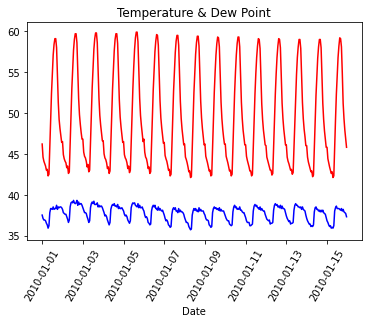

In [25]:
temperature = df_weather['Temperature']['2010-01-01':'2010-01-15']
dewpoint = df_weather['DewPoint']['2010-01-01':'2010-01-15']
t = temperature.index

plt.plot(t, temperature, 'red')
plt.plot(t, dewpoint, 'blue') # Appears on same axes
plt.xlabel('Date')
plt.title('Temperature & Dew Point')
plt.xticks(rotation=60)
plt.show() # Renders plot objects to screen

**Using `axes()`**

* Syntax: `axes([x_lo, y_lo, width, height])`
* Units between 0 and 1 (figure dimensions)

![axes][1]

  [1]: https://raw.githubusercontent.com/trenton3983/DataCamp/master/Images/intro_to_data_visualization_in_python/1_1_axes.JPG

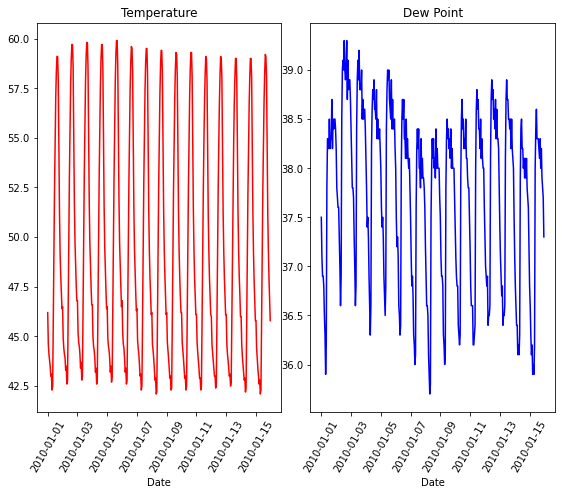

In [26]:
plt.figure(figsize=(8, 6))

plt.axes([0.05,0.05,0.425,0.9])
plt.plot(t, temperature, 'red')
plt.xlabel('Date')
plt.title('Temperature')
plt.xticks(rotation=60)
plt.axes([0.525,0.05,0.425,0.9])
plt.plot(t, dewpoint, 'blue')
plt.xlabel('Date')
plt.title('Dew Point')
plt.xticks(rotation=60)
plt.show()

**Using `subplot()`**

* Syntax: `subplot(nrows, ncols, nsubplot)`
* Subplot ordering:
 * Row-wise from top left
 * Indexed from 1

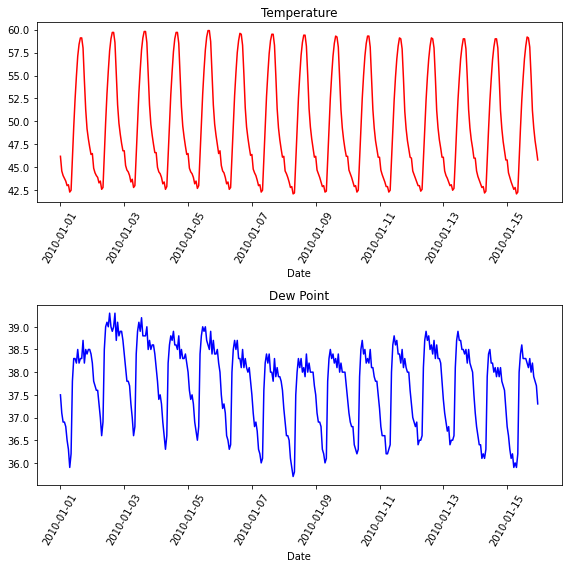

In [27]:
plt.figure(figsize=(8, 8))

plt.subplot(2, 1, 1)
plt.plot(t, temperature, 'red')
plt.xlabel('Date')
plt.title('Temperature')
plt.xticks(rotation=60)
plt.subplot(2, 1, 2)
plt.plot(t, dewpoint, 'blue')
plt.xlabel('Date')
plt.title('Dew Point')
plt.xticks(rotation=60)
plt.tight_layout()
plt.show()

### Multiple plots on single axis

It is time now to put together some of what you have learned and combine line plots on a common set of axes. The data set here comes from records of undergraduate degrees awarded to women in a variety of fields from 1970 to 2011. You can compare trends in degrees most easily by viewing two curves on the same set of axes.

Here, three NumPy arrays have been pre-loaded for you: `year` (enumerating years from 1970 to 2011 inclusive), `physical_sciences` (representing the percentage of Physical Sciences degrees awarded to women each in corresponding year), and `computer_science` (representing the percentage of Computer Science degrees awarded to women in each corresponding year).

You will issue two `plt.plot()` commands to draw line plots of different colors on the same set of axes. Here, `year` represents the x-axis, while `physical_science`s and `computer_science` are the y-axes.

**Instructions**

* Import `matplotlib.pyplot` as its usual alias.
* Add a `'blue'` line plot of the % of degrees awarded to women in the Physical Sciences (`physical_sciences`) from 1970 to 2011 (`year`). Note that the x-axis should be specified first.
* Add a `'red'` line plot of the % of degrees awarded to women in Computer Science (`computer_science`) from 1970 to 2011 (`year`).
* Use `plt.show()` to display the figure with the curves on the same axes.

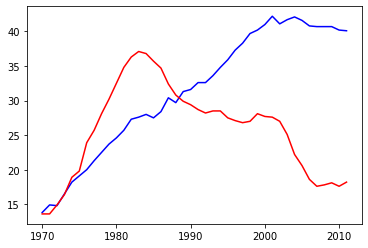

In [28]:
# Plot in blue the % of degrees awarded to women in the Physical Sciences
plt.plot(df_women.Year, df_women['Physical Sciences'], c='blue')

# Plot in red the % of degrees awarded to women in Computer Science
plt.plot(df_women.Year, df_women['Computer Science'], c='red')

# Display the plot
plt.show()

**It looks like, for the last 25 years or so, more women have been awarded undergraduate degrees in the Physical Sciences than in Computer Science.**

### Using axes()

Rather than overlaying line plots on common axes, you may prefer to plot different line plots on distinct axes. The command `plt.axes()` is one way to do this (but it requires specifying coordinates relative to the size of the figure).

Here, you have the same three arrays `year`, `physical_sciences`, and `computer_science` representing percentages of degrees awarded to women over a range of years. You will use `plt.axes()` to create separate sets of axes in which you will draw each line plot.

In calling `plt.axes([xlo, ylo, width, height])`, a set of axes is created and made active with lower corner at coordinates `(xlo, ylo)` of the specified `width` and `height`. Note that these coordinates can be passed to `plt.axes()` in the form of a list or a tuple.

The coordinates and lengths are values between 0 and 1 representing lengths relative to the dimensions of the figure. After issuing a `plt.axes()` command, plots generated are put in that set of axes.

**Instructions**

* Create a set of plot axes with lower corner xlo and ylo of `0.05` and `0.05`, width of `0.425`, and height of `0.9` (in units relative to the figure dimension).
 * Note: Remember to pass these coordinates to `plt.axes()` in the form of a list: `[xlo, ylo, width, height]`.
* Plot the percentage of degrees awarded to women in Physical Sciences in blue in the active axes just created.
* Create a set of plot axes with lower corner xlo and ylo of `0.525` and `0.05`, width of `0.425`, and height of `0.9` (in units relative to the figure dimension).
* Plot the percentage of degrees awarded to women in Computer Science in red in the active axes just created.

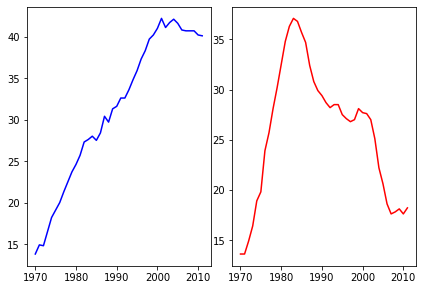

In [29]:
# Create plot axes for the first line plot
plt.axes([0.05, 0.05, 0.425, 0.9])

# Plot in blue the % of degrees awarded to women in the Physical Sciences
plt.plot(df_women.Year, df_women['Physical Sciences'], c='blue')

# Create plot axes for the second line plot
plt.axes([0.525, 0.05, 0.425, 0.9])

# Plot in red the % of degrees awarded to women in Computer Science
plt.plot(df_women.Year, df_women['Computer Science'], c='red')

# Display the plot
plt.show()

**As you can see, not only are there now two separate plots with their own axes, but the axes for each plot are slightly different.**

### Using subplot() (1)

The command `plt.axes()` requires a lot of effort to use well because the coordinates of the axes need to be set manually. A better alternative is to use `plt.subplot()` to determine the layout automatically.

In this exercise, you will continue working with the same arrays from the previous exercises: `year`, `physical_sciences`, and `computer_science`. Rather than using `plt.axes()` to explicitly lay out the axes, you will use `plt.subplot(m, n, k)` to make the subplot grid of dimensions `m` by `n` and to make the `k`th subplot active (subplots are numbered starting from 1 row-wise from the top left corner of the subplot grid).

**Instructions**

* Use `plt.subplot()` to create a figure with 1x2 subplot layout & make the first subplot active.
* Plot the percentage of degrees awarded to women in Physical Sciences in blue in the active subplot.
* Use `plt.subplot()` again to make the second subplot active in the current 1x2 subplot grid.
* Plot the percentage of degrees awarded to women in Computer Science in red in the active subplot.

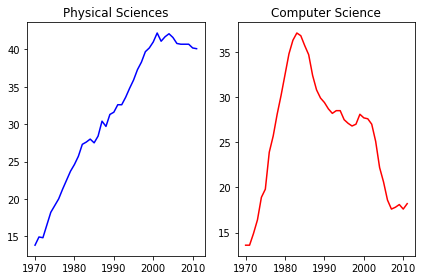

In [30]:
# Create a figure with 1x2 subplot and make the left subplot active
plt.subplot(1, 2, 1)

# Plot in blue the % of degrees awarded to women in the Physical Sciences
plt.plot(df_women.Year, df_women['Physical Sciences'], c='blue')
plt.title('Physical Sciences')

# Make the right subplot active in the current 1x2 subplot grid
plt.subplot(1, 2, 2)

# Plot in red the % of degrees awarded to women in Computer Science
plt.plot(df_women.Year, df_women['Computer Science'], c='red')
plt.title('Computer Science')

# Use plt.tight_layout() to improve the spacing between subplots
plt.tight_layout()
plt.show()

**Using subplots like this is a better alternative to using plt.axes().**

### Using subplot() (2)

Now you have some familiarity with `plt.subplot()`, you can use it to plot more plots in larger grids of subplots of the same figure.

Here, you will make a 2×2 grid of subplots and plot the percentage of degrees awarded to women in Physical Sciences (using `physical_sciences`), in Computer Science (using `computer_science`), in Health Professions (using `health`), and in Education (using `education`).

**Instructions**

* Create a figure with 2×2 subplot layout, make the top, left subplot active, and plot the % of degrees awarded to women in Physical Sciences in blue in the active subplot.
* Make the top, right subplot active in the current 2×2 subplot grid and plot the % of degrees awarded to women in Computer Science in red in the active subplot.
* Make the bottom, left subplot active in the current 2×2 subplot grid and plot the % of degrees awarded to women in Health Professions in green in the active subplot.
* Make the bottom, right subplot active in the current 2×2 subplot grid and plot the % of degrees awarded to women in Education in yellow in the active subplot.
* _When making your plots, be sure to use the variable names specified in the exercise text above (`computer_science`, `health`, and `education`)!_

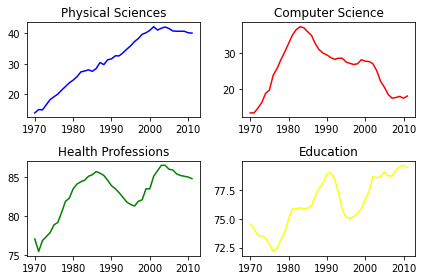

In [31]:
# Create a figure with 2x2 subplot layout and make the top left subplot active
plt.subplot(2, 2, 1)

# Plot in blue the % of degrees awarded to women in the Physical Sciences
plt.plot(df_women.Year, df_women['Physical Sciences'], color='blue')
plt.title('Physical Sciences')

# Make the top right subplot active in the current 2x2 subplot grid 
plt.subplot(2, 2, 2)

# Plot in red the % of degrees awarded to women in Computer Science
plt.plot(df_women.Year, df_women['Computer Science'], color='red')
plt.title('Computer Science')

# Make the bottom left subplot active in the current 2x2 subplot grid
plt.subplot(2, 2, 3)

# Plot in green the % of degrees awarded to women in Health Professions
plt.plot(df_women.Year, df_women['Health Professions'], color='green')
plt.title('Health Professions')

# Make the bottom right subplot active in the current 2x2 subplot grid
plt.subplot(2, 2, 4)

# Plot in yellow the % of degrees awarded to women in Education
plt.plot(df_women.Year, df_women['Education'], color='yellow')
plt.title('Education')

# Improve the spacing between subplots and display them
plt.tight_layout()
plt.show()

**You can use this approach to create subplots in any layout of your choice.**

## Customizing Axes

**Controlling axis extents**

* `axis([xmin, xmax, ymin, ymax])` sets axis extents
* Control over individual axis extents
 * `xlim([xmin, xmax])`
 * `ylim([ymin, ymax])`
* Can use tuples, lists for extents
 * e.g., `xlim((-2, 3))` works
 * e.g., `xlim([-2, 3])` works also
 
**GDP over time**

In [32]:
gdp_path = 'data/GDP/GDP.csv'

In [33]:
df_gdp = pd.read_csv('data/GDP/gdp_usa.csv')
df_gdp.DATE = pd.to_datetime(df_gdp.DATE)
df_gdp['YEAR'] = pd.DatetimeIndex(df_gdp.DATE).year

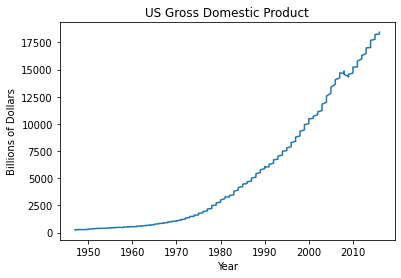

In [34]:
plt.plot(df_gdp.YEAR, df_gdp.VALUE)
plt.xlabel('Year')
plt.ylabel('Billions of Dollars')
plt.title('US Gross Domestic Product')
plt.show()

**Using `xlim()`**

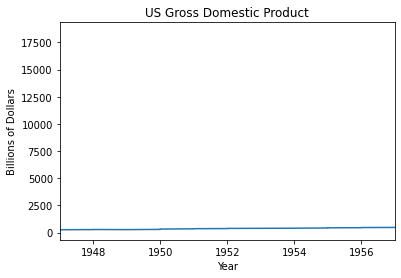

In [35]:
plt.plot(df_gdp.YEAR, df_gdp.VALUE)
plt.xlabel('Year')
plt.ylabel('Billions of Dollars')
plt.title('US Gross Domestic Product')
plt.xlim((1947, 1957))
plt.show()

**Using `xlim()` & `ylim()`**

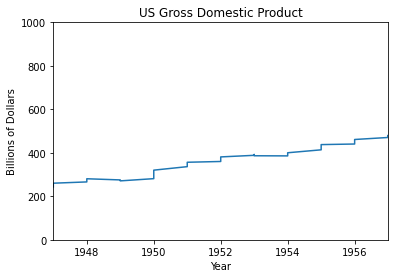

In [36]:
plt.plot(df_gdp.YEAR, df_gdp.VALUE)
plt.xlabel('Year')
plt.ylabel('Billions of Dollars')
plt.title('US Gross Domestic Product')
plt.xlim((1947, 1957))
plt.ylim((0, 1000))
plt.show()

**Using `axis()`**

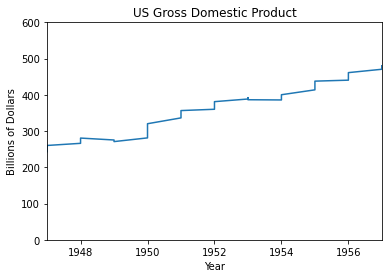

In [37]:
plt.plot(df_gdp.YEAR, df_gdp.VALUE)
plt.xlabel('Year')
plt.ylabel('Billions of Dollars')
plt.title('US Gross Domestic Product')
plt.axis((1947, 1957, 0, 600))
plt.show()

**Other `axis()` options**

```python
| Invocation     | Result                               |
|----------------|--------------------------------------|
| axis('off')    | turns off axis lines, labels         |
| axis('equal')  | equal scaling on x, y axes           |
| axis('square') | forces square plot                   |
| axis('tight')  | sets xlim(), ylim() to show all data |
```

**Using `axis('equal')`**

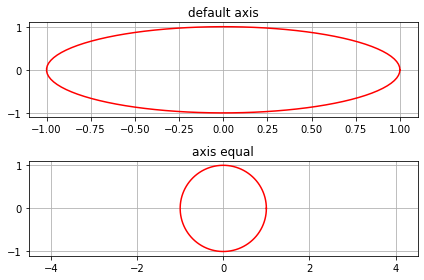

In [38]:
np.random.seed(555)
t = np.linspace(0,2*np.pi,100)
xc = 0.0
yc = 0.0
r = 1
x = r*np.cos(t) + xc
y = r*np.sin(t) + yc

plt.subplot(2, 1, 1)
plt.plot(x, y, 'red')
plt.grid(True)
plt.title('default axis')
plt.subplot(2, 1, 2)
plt.plot(x, y, 'red')
plt.grid(True)
plt.axis('equal')
plt.title('axis equal')
plt.tight_layout()
plt.show()

### Using xlim(), ylim()

In this exercise, you will work with the `matplotlib.pyplot` interface to quickly set the x- and y-limits of your plots.

You will now create the same figure as in the previous exercise using `plt.plot()`, this time setting the axis extents using `plt.xlim()` and `plt.ylim()`. These commands allow you to either zoom or expand the plot or to set the axis ranges to include important values (such as the origin).

In this exercise, as before, the percentage of women graduates in Computer Science and in the Physical Sciences are held in the variables `computer_science` and `physical_sciences` respectively over `year`.

After creating the plot, you will use `plt.savefig()` to export the image produced to a file.

**Instructions**

* Use `plt.xlim()` to set the x-axis range to the period between the years 1990 and 2010.
* Use `plt.ylim()` to set the y-axis range to the interval between 0% and 50% of degrees awarded.
* Display the final figure with `plt.show()` and save the output to `'xlim_and_ylim.png'`.

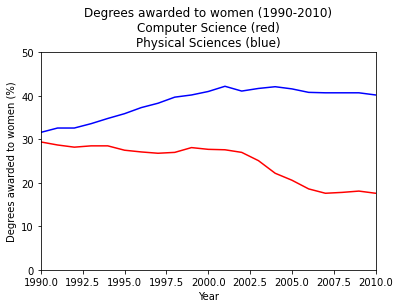

In [39]:
# Plot the % of degrees awarded to women in Computer Science and the Physical Sciences
plt.plot(df_women['Year'], df_women['Computer Science'], color='red') 
plt.plot(df_women['Year'], df_women['Physical Sciences'], color='blue')

# Add the axis labels
plt.xlabel('Year')
plt.ylabel('Degrees awarded to women (%)')

# Set the x-axis range
plt.xlim(1990, 2010)

# Set the y-axis range
plt.ylim(0, 50)

# Add a title
plt.title('Degrees awarded to women (1990-2010)\nComputer Science (red)\nPhysical Sciences (blue)')

# Save the image as 'xlim_and_ylim.png'
plt.savefig('images/xlim_and_ylim.png')

# display the plot
plt.show()

**This plot effectively captures the difference in trends between 1990 and 2010.**

### Using axis()

Using `plt.xlim()` and `plt.ylim()` are useful for setting the axis limits individually. In this exercise, you will see how you can pass a 4-tuple to `plt.axis()` to set limits for both axes at once. For example, `plt.axis((1980, 1990, 0, 75))` would set the extent of the x-axis to the period between 1980 and 1990, and would set the y-axis extent from 0 to 75% degrees award.

Once again, the percentage of women graduates in Computer Science and in the Physical Sciences are held in the variables computer_science and physical_sciences where each value was measured at the corresponding year held in the year variable.

**Instructions**

* Use `plt.axis()` to select the time period between 1990 and 2010 on the x-axis as well as the interval between 0 and 50% awarded on the y-axis.
* Save the resulting plot as `'axis_limits.png'`.

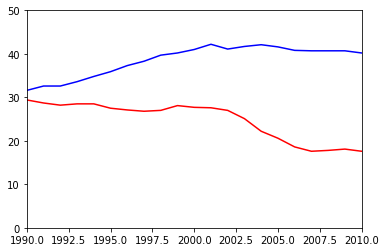

In [40]:
# Plot in blue the % of degrees awarded to women in Computer Science
plt.plot(df_women['Year'], df_women['Computer Science'], color='red') 

# Plot in red the % of degrees awarded to women in the Physical Sciences
plt.plot(df_women['Year'], df_women['Physical Sciences'], color='blue')

# Set the x-axis and y-axis limits
plt.axis((1990, 2010, 0, 50))

# Save the figure as 'axis_limits.png'
plt.savefig('images/axis_limits.png')

# Show the figure
plt.show()

**Using `plt.axis()` allows you to set limits for both axes at once, as opposed to setting them individually with `plt.xlim()` and `plt.ylim()`.**

## Legends, Annotations, and Styles

In [41]:
data = load_iris()
iris = pd.DataFrame(data= np.c_[data['data'], data['target']], columns= data['feature_names'] + ['target'])
iris['species'] = pd.Categorical.from_codes(data.target, data.target_names)
iris.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target,species
0,5.1,3.5,1.4,0.2,0.0,setosa
1,4.9,3.0,1.4,0.2,0.0,setosa
2,4.7,3.2,1.3,0.2,0.0,setosa
3,4.6,3.1,1.5,0.2,0.0,setosa
4,5.0,3.6,1.4,0.2,0.0,setosa


**Using `legend()`**

* provide labels for overlaid points and curves

**Legend Locations**

![legend locations][1]

  [1]: https://raw.githubusercontent.com/trenton3983/DataCamp/master/Images/intro_to_data_visualization_in_python/1_3_legend_locations.JPG

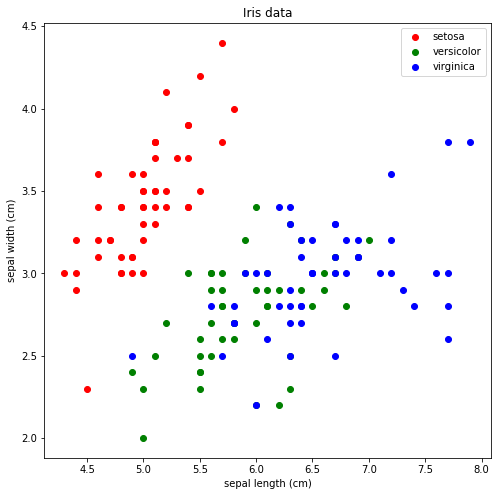

In [42]:
plt.figure(figsize=(8, 8))
plt.scatter('sepal length (cm)', 'sepal width (cm)', data=iris[iris.species == 'setosa'], marker='o', color='red', label='setosa')
plt.scatter('sepal length (cm)', 'sepal width (cm)', data=iris[iris.species == 'versicolor'], marker='o', color='green', label='versicolor')
plt.scatter('sepal length (cm)', 'sepal width (cm)', data=iris[iris.species == 'virginica'], marker='o', color='blue', label='virginica')
plt.legend(loc='upper right')
plt.title('Iris data')
plt.xlabel('sepal length (cm)')
plt.ylabel('sepal width (cm)')
plt.show()

**Plot Annotations**

* Text labels and arrows using annotate() method
* Flexible specification of coordinates
* Keyword arrowprops: dict of arrow properties
 * width
 * color
 * etc.
 
**Options for `annotate()`**
 
![annotate options][1]


  [1]: https://raw.githubusercontent.com/trenton3983/DataCamp/master/Images/intro_to_data_visualization_in_python/1_3_annotate_options.JPG

**Using `annotate()` for text**

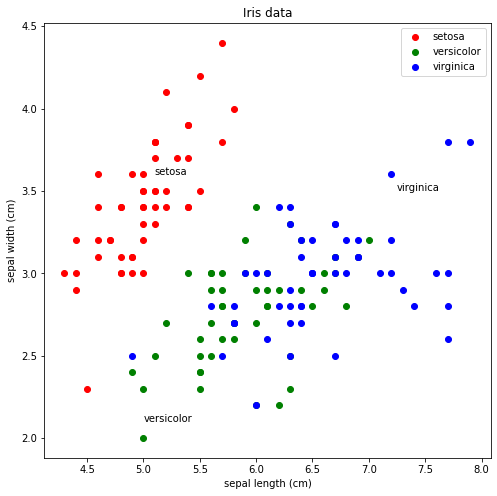

In [43]:
plt.figure(figsize=(8, 8))
plt.scatter('sepal length (cm)', 'sepal width (cm)', data=iris[iris.species == 'setosa'], marker='o', color='red', label='setosa')
plt.scatter('sepal length (cm)', 'sepal width (cm)', data=iris[iris.species == 'versicolor'], marker='o', color='green', label='versicolor')
plt.scatter('sepal length (cm)', 'sepal width (cm)', data=iris[iris.species == 'virginica'], marker='o', color='blue', label='virginica')
plt.legend(loc='upper right')
plt.title('Iris data')
plt.xlabel('sepal length (cm)')
plt.ylabel('sepal width (cm)')
plt.annotate('setosa', xy=(5.1, 3.6))
plt.annotate('virginica', xy=(7.25, 3.5))
plt.annotate('versicolor', xy=(5.0, 2.1))
plt.show()

**Using `annotate()` for arrows**

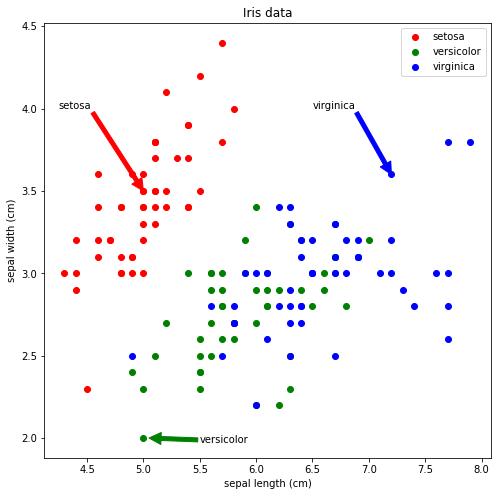

In [44]:
plt.figure(figsize=(8, 8))
plt.scatter('sepal length (cm)', 'sepal width (cm)', data=iris[iris.species == 'setosa'], marker='o', color='red', label='setosa')
plt.scatter('sepal length (cm)', 'sepal width (cm)', data=iris[iris.species == 'versicolor'], marker='o', color='green', label='versicolor')
plt.scatter('sepal length (cm)', 'sepal width (cm)', data=iris[iris.species == 'virginica'], marker='o', color='blue', label='virginica')
plt.legend(loc='upper right')
plt.title('Iris data')
plt.xlabel('sepal length (cm)')
plt.ylabel('sepal width (cm)')
plt.annotate('setosa', xy=(5.0, 3.5), xytext=(4.25, 4.0), arrowprops={'color':'red'})
plt.annotate('virginica', xy=(7.2, 3.6), xytext=(6.5, 4.0), arrowprops={'color':'blue'})
plt.annotate('versicolor', xy=(5.05, 2.0), xytext=(5.5, 1.97), arrowprops={'color':'green'})
plt.show()

**Working With Plot Styles**

* Style sheets in Matplotlib
* Defaults for lines, points, backgrounds, etc.
* Switch styles globally with `plt.style.use()`
* `plt.style.available`: list of styles
* [Matplotlib Style sheets reference][1]

  [1]: https://matplotlib.org/3.1.1/gallery/style_sheets/style_sheets_reference.html

**`fivethirtyeight` style**

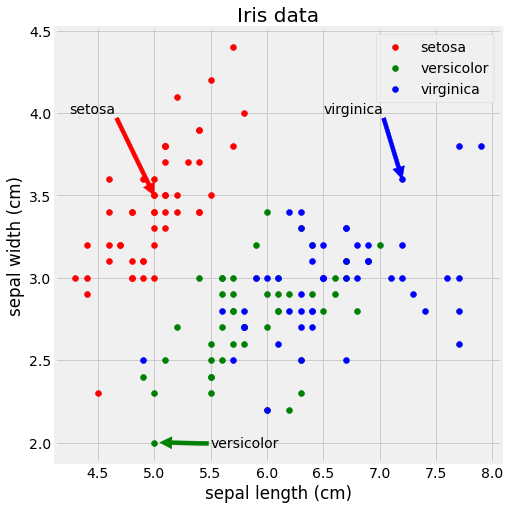

In [45]:
plt.figure(figsize=(8, 8))
plt.style.use('fivethirtyeight')
plt.scatter('sepal length (cm)', 'sepal width (cm)', data=iris[iris.species == 'setosa'], marker='o', color='red', label='setosa')
plt.scatter('sepal length (cm)', 'sepal width (cm)', data=iris[iris.species == 'versicolor'], marker='o', color='green', label='versicolor')
plt.scatter('sepal length (cm)', 'sepal width (cm)', data=iris[iris.species == 'virginica'], marker='o', color='blue', label='virginica')
plt.legend(loc='upper right')
plt.title('Iris data')
plt.xlabel('sepal length (cm)')
plt.ylabel('sepal width (cm)')
plt.annotate('setosa', xy=(5.0, 3.5), xytext=(4.25, 4.0), arrowprops={'color':'red'})
plt.annotate('virginica', xy=(7.2, 3.6), xytext=(6.5, 4.0), arrowprops={'color':'blue'})
plt.annotate('versicolor', xy=(5.05, 2.0), xytext=(5.5, 1.97), arrowprops={'color':'green'})
plt.show()

**`ggplot` style**

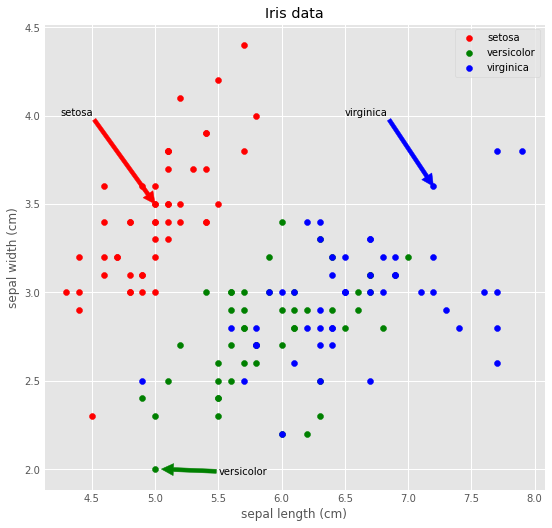

In [46]:
plt.style.use('ggplot')
plt.figure(figsize=(8, 8))
plt.scatter('sepal length (cm)', 'sepal width (cm)', data=iris[iris.species == 'setosa'], marker='o', color='red', label='setosa')
plt.scatter('sepal length (cm)', 'sepal width (cm)', data=iris[iris.species == 'versicolor'], marker='o', color='green', label='versicolor')
plt.scatter('sepal length (cm)', 'sepal width (cm)', data=iris[iris.species == 'virginica'], marker='o', color='blue', label='virginica')
plt.legend(loc='upper right')
plt.title('Iris data')
plt.xlabel('sepal length (cm)')
plt.ylabel('sepal width (cm)')
plt.annotate('setosa', xy=(5.0, 3.5), xytext=(4.25, 4.0), arrowprops={'color':'red'})
plt.annotate('virginica', xy=(7.2, 3.6), xytext=(6.5, 4.0), arrowprops={'color':'blue'})
plt.annotate('versicolor', xy=(5.05, 2.0), xytext=(5.5, 1.97), arrowprops={'color':'green'})
plt.show()

### Using legend()

Legends are useful for distinguishing between multiple datasets displayed on common axes. The relevant data are created using specific line colors or markers in various plot commands. Using the keyword argument `label` in the plotting function associates a string to use in a legend.

For example, here, you will plot enrollment of women in the Physical Sciences and in Computer Science over time. You can label each curve by passing a `label` argument to the plotting call, and request a legend using `plt.legend()`. Specifying the keyword argument `loc` determines where the legend will be placed.

**Instructions**

* Modify the plot command provided that draws the enrollment of women in Computer Science over time so that the curve is labeled `'Computer Science'` in the legend.
* Modify the plot command provided that draws the enrollment of women in the Physical Sciences over time so that the curve is labeled `'Physical Sciences'` in the legend.
* Add a legend at the lower center (i.e., `loc='lower center'`).

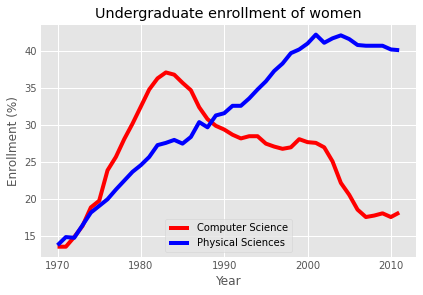

In [47]:
# Plot in blue the % of degrees awarded to women in Computer Science
plt.plot(df_women['Year'], df_women['Computer Science'], color='red', label='Computer Science') 

# Plot in red the % of degrees awarded to women in the Physical Sciences
plt.plot(df_women['Year'], df_women['Physical Sciences'], color='blue', label='Physical Sciences')

# Add a legend at the lower center
plt.legend(loc='lower center')

# Add axis labels and title
plt.xlabel('Year')
plt.ylabel('Enrollment (%)')
plt.title('Undergraduate enrollment of women')
plt.show()

**You should always use axes labels and legends to help make your plots more readable.**

### Using annotate()

It is often useful to annotate a simple plot to provide context. This makes the plot more readable and can highlight specific aspects of the data. Annotations like text and arrows can be used to emphasize specific observations.

Here, you will once again plot enrollment of women in the Physical Sciences and Computer Science over time. The legend is set up as before. Additionally, you will mark the inflection point when enrollment of women in Computer Science reached a peak and started declining using `plt.annotate()`.

To enable an arrow, set `arrowprops=dict(facecolor='black')`. The arrow will point to the location given by `xy` and the text will appear at the location given by `xytext`.

Computer Science enrollment and the years of enrollment have been preloaded for you as the arrays `computer_science` and `year`, respectively.

**Instructions 1/2**

* First, calculate the position for your annotation by finding the peak of women enrolling in Computer Science.
* Compute the **maximum** enrollment of women in Computer Science (using the `computer_science` array).
* Calculate the year in which there was the maximum enrollment of women in Computer Science.
 * To do so, you will need to retrieve the index of the highest value in the `computer_science` array using `.argmax()`, and then use this value to index the `year` array.

In [48]:
cs_max = df_women['Computer Science'].max()
yr_max = df_women['Year'][df_women['Computer Science'].argmax()]

print(f'CS Max: {cs_max}\nYR Max: {yr_max}')

CS Max: 37.1
YR Max: 1983


**Instructions 2/2**

* Annotate the plot with a black arrow at the point of peak women enrolling in Computer Science.
* Label the arrow `'Maximum'`. The parameter for this is `s`, but you don't have to specify it.
* Pass in the arguments to `xy` and `xytext` as tuples.
 * For `xy`, use the `yr_max` and `cs_max` that you computed.
 * For `xytext`, use `(yr_max+5, cs_max+5)` to specify the displacement of the label from the tip of the arrow.
* Draw the arrow by specifying the keyword argument `arrowprops=dict(facecolor='black')`. The single letter shortcut for `'black'` is `'k'`.

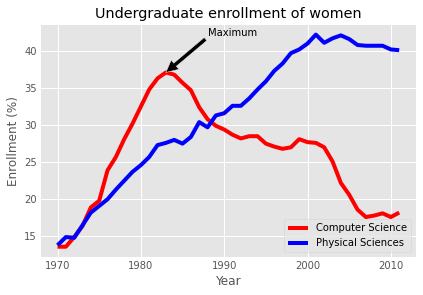

In [49]:
# Plot with legend as before
plt.plot(df_women['Year'], df_women['Computer Science'], color='red', label='Computer Science') 
plt.plot(df_women['Year'], df_women['Physical Sciences'], color='blue', label='Physical Sciences')
plt.legend(loc='lower right')

# Add a black arrow annotation
plt.annotate('Maximum', xy=(yr_max, cs_max), xytext=(yr_max+5, cs_max+5), arrowprops=dict(facecolor='black'))

# Add axis labels and title
plt.xlabel('Year')
plt.ylabel('Enrollment (%)')
plt.title('Undergraduate enrollment of women')
plt.show()

**Annotations are extremely useful to help make more complicated plots easier to understand.**

Here's a link to a [stack**overflow**][1] question I answered regarding annotations: **[bold annotated text in matplotlib][2]**.

  [1]: https://stackoverflow.com/
  [2]: https://stackoverflow.com/questions/36162414/bold-annotated-text-in-matplotlib/57350258#57350258

### Modifying styles

Matplotlib comes with a number of different stylesheets to customize the overall look of different plots. To activate a particular stylesheet you can simply call `plt.style.use()` with the name of the style sheet you want. To list all the available style sheets you can execute: `print(plt.style.available)`.

**Instructions**

* Import `matplotlib.pyplot` as its usual alias.
* Activate the `'ggplot'` style sheet with `plt.style.use()`.

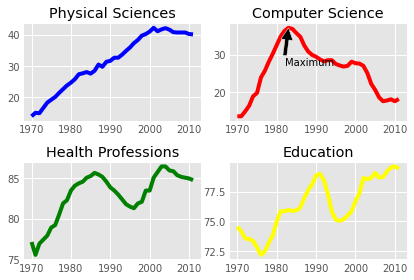

In [50]:
# Set the style to 'ggplot'
plt.style.use('ggplot')

# Create a figure with 2x2 subplot layout
plt.subplot(2, 2, 1) 

# Plot the enrollment % of women in the Physical Sciences
plt.plot(df_women['Year'], df_women['Physical Sciences'], color='blue', label='Physical Sciences')
plt.title('Physical Sciences')

# Plot the enrollment % of women in Computer Science
plt.subplot(2, 2, 2)
plt.plot(df_women['Year'], df_women['Computer Science'], color='red', label='Computer Science') 
plt.title('Computer Science')

# Add annotation
# cs_max = computer_science.max()
# yr_max = year[computer_science.argmax()]
plt.annotate('Maximum', xy=(yr_max, cs_max), xytext=(yr_max-1, cs_max-10), arrowprops=dict(facecolor='black'))

# Plot the enrollmment % of women in Health professions
plt.subplot(2, 2, 3)
plt.plot(df_women['Year'], df_women['Health Professions'], color='green', label='Healt Professions') 
plt.title('Health Professions')

# Plot the enrollment % of women in Education
plt.subplot(2, 2, 4)
plt.plot(df_women['Year'], df_women['Education'], color='yellow', label='Education') 
plt.title('Education')

# Improve spacing between subplots and display them
plt.tight_layout()
plt.show()

# Plotting 2D arrays

This chapter showcases various techniques for visualizing two-dimensional arrays. This includes the use, presentation, and orientation of grids for representing two-variable functions followed by discussions of pseudocolor plots, contour plots, color maps, two-dimensional histograms, and images.

## Working With 2D Arrays

**Reminder: NumPy Arrays**

* Homogeneous in type
* Calculations all at once
* Indexing with brackets:
 * `A[index]` for 1D array
 * `A[index0, index1]` for 2D array
 
**Reminder: Slicing Arrays**

* Slicing: 1D arrays: `A[slice]`, 2D arrays: `A[slice0, slice1]`
* Slicing: _slice = start:stop:stride_
 * Indexes from start to stop-1 in steps of stride
 * Missing start: implicitly at beginning of array
 * Missing stop: implicitly at end of array
 * Missing stride: implicitly stride 1
* Negative indexes/slices: count from end of array

**2D Arrays & Images**

![2d array image][1]

**2D Arrays & Functions**

![2d array function][2]

**Using `meshgrid()`**


  [1]: https://raw.githubusercontent.com/trenton3983/DataCamp/master/Images/intro_to_data_visualization_in_python/2_1_array_image.JPG
  [2]: https://raw.githubusercontent.com/trenton3983/DataCamp/master/Images/intro_to_data_visualization_in_python/2_1_array_function.JPG

In [51]:
u = np.linspace(-2, 2, 3)
v = np.linspace(-1, 1, 5)
X, Y = np.meshgrid(u, v)
Z = X**2/25 + Y**2/4
print(f'X:\n{X}\n\nY:\n{Y}')

X:
[[-2.  0.  2.]
 [-2.  0.  2.]
 [-2.  0.  2.]
 [-2.  0.  2.]
 [-2.  0.  2.]]

Y:
[[-1.  -1.  -1. ]
 [-0.5 -0.5 -0.5]
 [ 0.   0.   0. ]
 [ 0.5  0.5  0.5]
 [ 1.   1.   1. ]]


**Meshgrid**

![meshgrid][1]

  [1]: https://raw.githubusercontent.com/trenton3983/DataCamp/master/Images/intro_to_data_visualization_in_python/2_1_meshgrid.jpg

**Sampling On A Grid**

Z:
[[0.41   0.25   0.41  ]
 [0.2225 0.0625 0.2225]
 [0.16   0.     0.16  ]
 [0.2225 0.0625 0.2225]
 [0.41   0.25   0.41  ]]


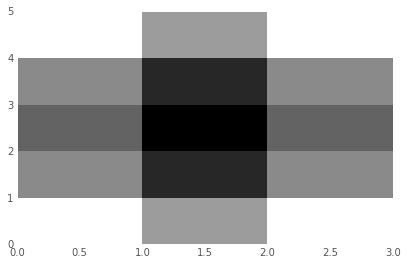

In [52]:
print(f'Z:\n{Z}')
plt.set_cmap('gray')
plt.pcolor(Z)
plt.show()

**Orientations of 2D Arrays & Images**

Z:
[[1 2 3]
 [4 5 6]]


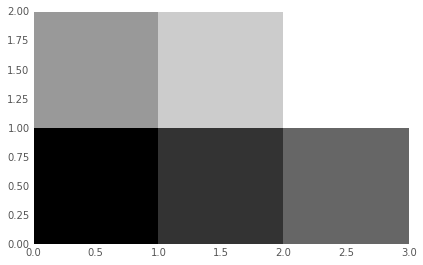

In [53]:
Z = np.array([[1, 2, 3], [4, 5, 6]])
print(f'Z:\n{Z}')
plt.pcolor(Z)
plt.show()

![array orientation][1]

  [1]: https://raw.githubusercontent.com/trenton3983/DataCamp/master/Images/intro_to_data_visualization_in_python/2_1_array_orientation.JPG

### Generating meshes

In order to visualize two-dimensional arrays of data, it is necessary to understand how to generate and manipulate 2-D arrays. Many Matplotlib plots support arrays as input and in particular, they support NumPy arrays. The NumPy library is the most widely-supported means for supporting numeric arrays in Python.

In this exercise, you will use the meshgrid function in NumPy to generate 2-D arrays which you will then visualize using `plt.imshow()`. The simplest way to generate a meshgrid is as follows:

```python
import numpy as np
Y, X = np.meshgrid(range(10),range(20))
```

This will create two arrays with a shape of `(20,10)`, which corresponds to 20 rows along the Y-axis and 10 columns along the X-axis. In this exercise, you will use `np.meshgrid()` to generate a regular 2-D sampling of a mathematical function.

**Instructions**

* Import the `numpy` and `matplotlib.pyplot` modules using the respective aliases `np` and `plt`.
* Generate two one-dimensional arrays `u` and `v` using `np.linspace()`. The array `u` should contain 41 values uniformly spaced between -2 and +2. The array `v` should contain 21 values uniformly spaced between -1 and +1.
* Construct two two-dimensional arrays `X` and `Y` from `u` and `v` using `np.meshgrid()`.
* After the array Z is computed using `X` and `Y`, visualize the array `Z` using `plt.pcolor()` and `plt.show()`.
* Save the resulting figure as `'sine_mesh.png'`.

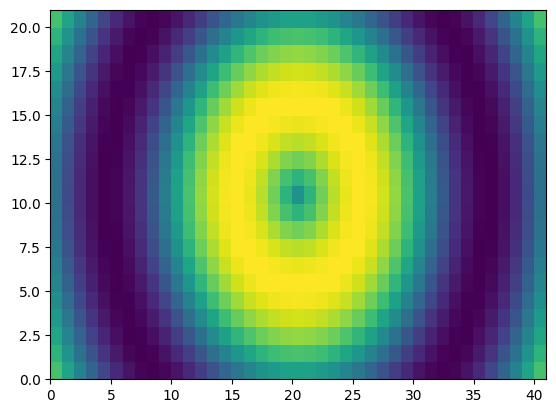

In [54]:
plt.style.use('default')

# Generate two 1-D arrays: u, v
u = np.linspace(-2, 2, 41)
v = np.linspace(-1, 1, 21)

# Generate 2-D arrays from u and v: X, Y
X,Y = np.meshgrid(u, v)

# Compute Z based on X and Y
Z = np.sin(3*np.sqrt(X**2 + Y**2)) 

# Display the resulting image with pcolor()
plt.pcolor(Z)

# Save the figure to 'sine_mesh.png'
plt.savefig('Images/intro_to_data_visualization_in_python/sine_mesh.png')

plt.show()

### Array orientation

![matrix picture][1]

The commands

```python
In [1]: plt.pcolor(A, cmap='Blues')
In [2]: plt.colorbar()
In [3]: plt.show()
```

produce the pseudocolor plot above using a Numpy array `A`. Which of the commands below could have generated `A`?

`numpy` and `matplotlib.pyplot` have been imported as `np` and `plt` respectively. Play around in the IPython shell with different arrays and generate pseudocolor plots from them to identify which of the below commands could have generated `A`.

**Instructions**

* ~~`A = np.array([[1, 2, 1], [0, 0, 1], [-1, 1, 1]])`~~
* `A = np.array([[1, 0, -1], [2, 0, 1], [1, 1, 1]])`
* ~~`A = np.array([[-1, 0, 1], [1, 0, 2], [1, 1, 1]])`~~
* ~~`A = np.array([[1, 1, 1], [2, 0, 1], [1, 0, -1]])`~~


  [1]: https://raw.githubusercontent.com/trenton3983/DataCamp/master/Images/intro_to_data_visualization_in_python/2_1_2_array_orientation.JPG

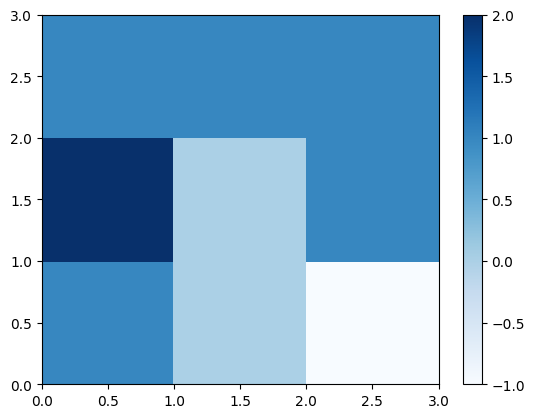

In [55]:
A = np.array([[1, 0, -1], [2, 0, 1], [1, 1, 1]])
plt.pcolor(A, cmap='Blues')
plt.colorbar()
plt.show()

## Visualizing Bivariate Functions

![bivariate function][1]

**Pseudocolo Plot**

  [1]: https://raw.githubusercontent.com/trenton3983/DataCamp/master/Images/intro_to_data_visualization_in_python/2_1_array_function.JPG

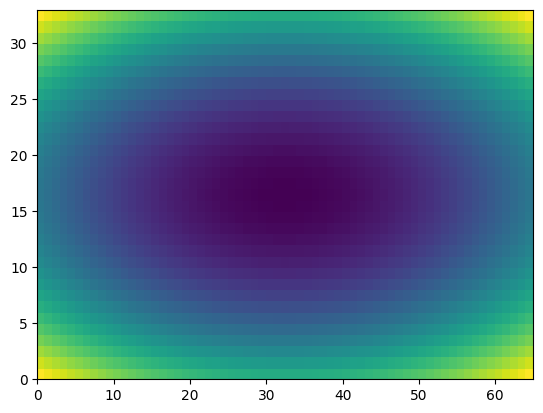

In [56]:
u = np.linspace(-2, 2, 65)
v = np.linspace(-1, 1, 33)
X,Y = np.meshgrid(u, v)
Z = X**2/25 + Y**2/4
plt.pcolor(Z)  # if not in color, may depend on plt.style.use('default')
plt.show()

**Color Bar**

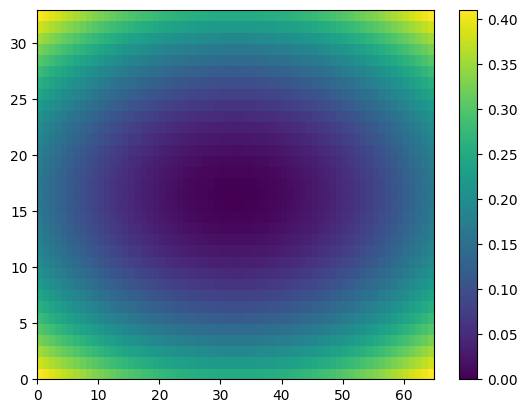

In [57]:
plt.pcolor(Z)
plt.colorbar()
plt.show()

**Color Map**

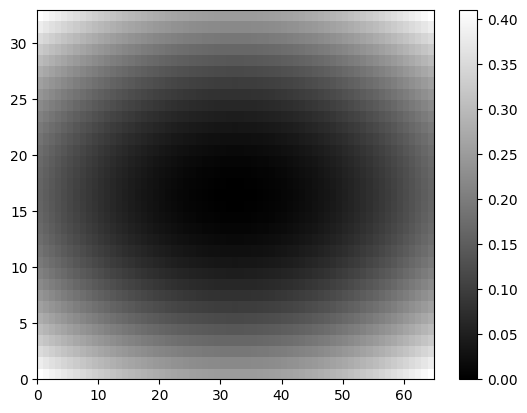

In [58]:
plt.pcolor(Z, cmap='gray')
plt.colorbar()
plt.show()

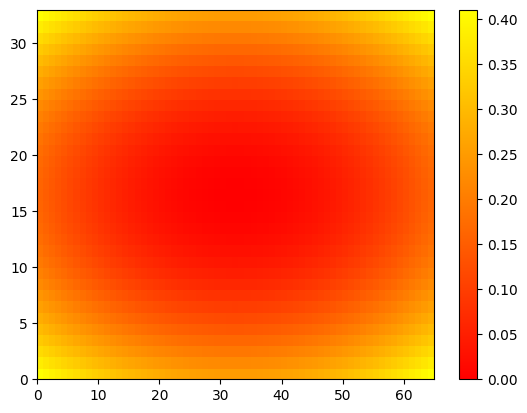

In [59]:
plt.pcolor(Z, cmap='autumn')
plt.colorbar()
plt.show()

**Axis Tight**

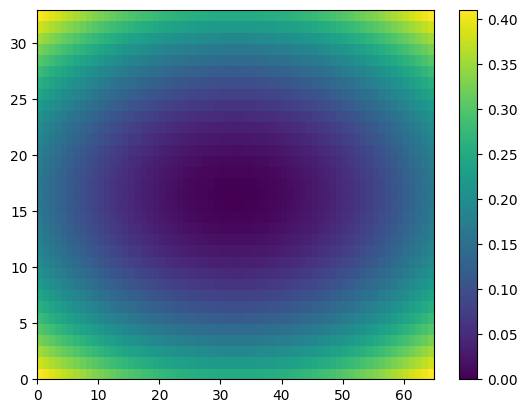

In [60]:
plt.pcolor(Z)
plt.colorbar()
plt.axis('tight')
plt.show()

**Plot Using Mesh Grid**

* Axes determined by mesh grid arrays X, Y

/var/folders/sd/1vc_q83x5rn9jjrd0x47_cc00000gn/T/ipykernel_55256/3882502496.py:1: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolor(X, Y, Z) # X, Y are 2D meshgrid


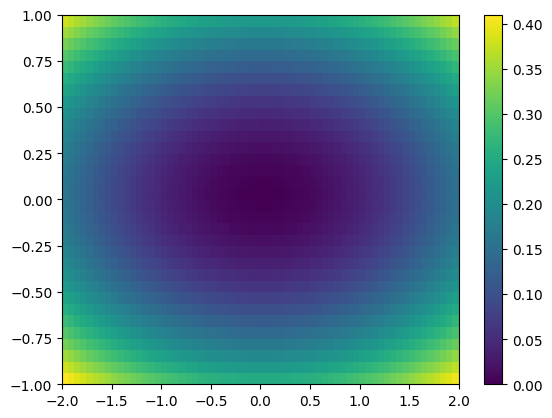

In [61]:
plt.pcolor(X, Y, Z) # X, Y are 2D meshgrid
plt.colorbar()
plt.show()

**Contour Plots**

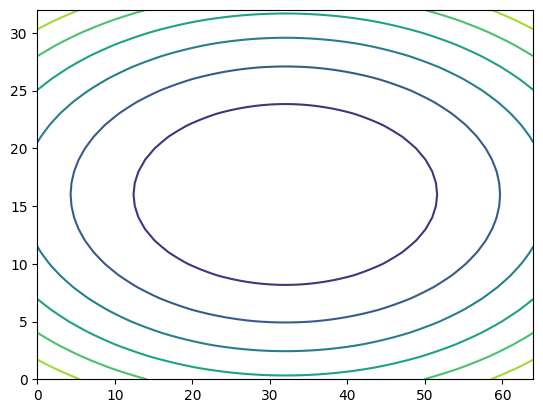

In [62]:
plt.contour(Z)
plt.show()

**More Contours**

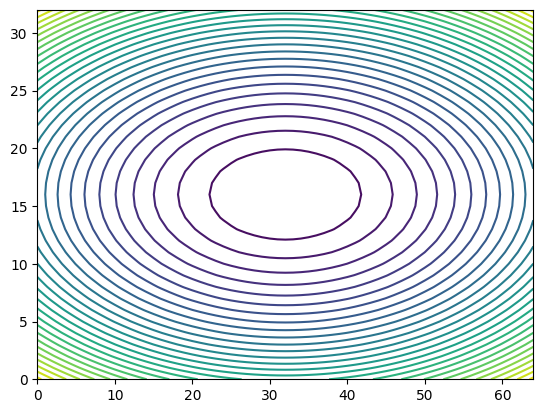

In [63]:
plt.contour(Z, 30)
plt.show()

**Contour Plot Using Meshgird**

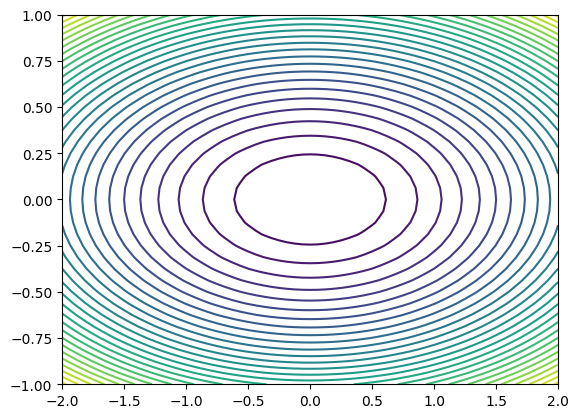

In [64]:
plt.contour(X, Y, Z, 30)
plt.show()

**Filled contour plots**

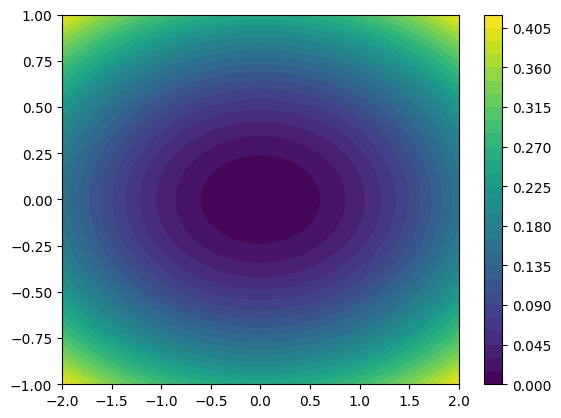

In [65]:
plt.contourf(X, Y, Z, 30)
plt.colorbar()
plt.show()

**More Information**

* API has many (optional) keyword arguments
* More in matplotlib.pyplot documentation
* More [examples][1]

  [1]: http://matplotlib.org/gallery.html

### Contour & filled contour plots

Although `plt.imshow()` or `plt.pcolor()` are often used to visualize a 2-D array in entirety, there are other ways of visualizing such data without displaying all of the available sample values. One option is to use the array to compute contours that are visualized instead.

Two types of contour plot supported by Matplotlib are `plt.contour()` and `plt.contourf()` where the former displays the contours as lines and the latter displayed filled areas between contours. Both these plotting commands accept a two dimensional array from which the appropriate contours are computed.

In this exercise, you will visualize a 2-D array repeatedly using both `plt.contour()` and `plt.contourf()`. You will use `plt.subplot()` to display several contour plots in a common figure, using the meshgrid `X`, `Y` as the axes. For example, `plt.contour(X, Y, Z)` generates a default contour map of the array `Z`.

_Don't forget to include the meshgrid in each plot for this exercise!_

**Instructions**

* Using the meshgrid `X`, `Y` as axes for **each** plot:
* Generate a default contour plot of the array `Z` in the upper left subplot.
* Generate a contour plot of the array `Z` in the upper right subplot with `20` contours.
* Generate a default _filled_ contour plot of the array `Z` in the lower left subplot.
* Generate a default _filled_ contour plot of the array `Z` in the lower right subplot with `20` contours.
* Improve the spacing between the subplots with `plt.tight_layout()` and display the figure.

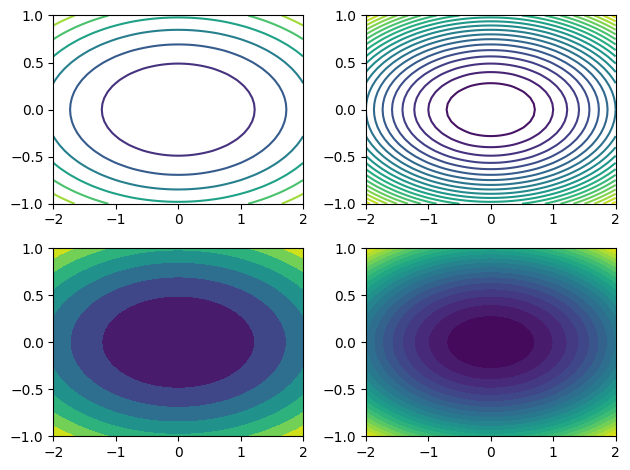

In [66]:
# Generate a default contour map of the array Z
plt.subplot(2,2,1)
plt.contour(X, Y, Z)

# Generate a contour map with 20 contours
plt.subplot(2,2,2)
plt.contour(X, Y, Z, 20)

# Generate a default filled contour map of the array Z
plt.subplot(2,2,3)
plt.contourf(X, Y, Z)

# Generate a default filled contour map with 20 contours
plt.subplot(2,2,4)
plt.contourf(X, Y, Z, 20)

# Improve the spacing between subplots
plt.tight_layout()

# Display the figure
plt.show()

### Modifying colormaps

When displaying a 2-D array with `plt.imshow()` or `plt.pcolor()`, the values of the array are mapped to a corresponding color. The set of colors used is determined by a colormap which smoothly maps values to colors, making it easy to understand the structure of the data at a glance.

It is often useful to change the colormap from the default `'jet'` colormap used by matplotlib. A good colormap is visually pleasing and conveys the structure of the data faithfully and in a way that makes sense for the application.

 * Some matplotlib colormaps have unique names such as `'jet'`, `'coolwarm'`, `'magma'` and `'viridis'`.
 * Others have a naming scheme based on overall color such as `'Greens'`, `'Blues'`, `'Reds'`, and `'Purples'`.
 * Another four colormaps are based on the seasons, namely `'summer'`, `'autumn'`, `'winter'` and `'spring'`.
 * You can insert the option `cmap=<name>` into most matplotlib functions to change the color map of the resulting plot.

In this exercise, you will explore four different colormaps together using `plt.subplot()`. You will use a pregenerated array `Z` and a meshgrid `X`, `Y` to generate the same filled contour plot with four different color maps. Be sure to also add a color bar to each filled contour plot with `plt.colorbar()`.

**Instructions**

* Modify the call to `plt.contourf()` so the filled contours in the top left subplot use the `'viridis'` colormap.
* Modify the call to `plt.contourf()` so the filled contours in the top right subplot use the `'gray'` colormap.
* Modify the call to `plt.contourf()` so the filled contours in the bottom left subplot use the `'autumn'` colormap.
* Modify the call to `plt.contourf()` so the filled contours in the bottom right subplot use the `'winter'` colormap.

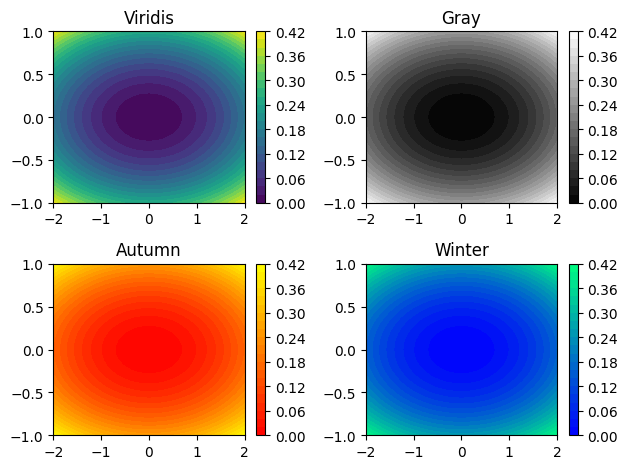

In [67]:
# Create a filled contour plot with a color map of 'viridis'
plt.subplot(2,2,1)
plt.contourf(X,Y,Z,20, cmap='viridis')
plt.colorbar()
plt.title('Viridis')

# Create a filled contour plot with a color map of 'gray'
plt.subplot(2,2,2)
plt.contourf(X,Y,Z,20, cmap='gray')
plt.colorbar()
plt.title('Gray')

# Create a filled contour plot with a color map of 'autumn'
plt.subplot(2,2,3)
plt.contourf(X,Y,Z,20, cmap='autumn')
plt.colorbar()
plt.title('Autumn')

# Create a filled contour plot with a color map of 'winter'
plt.subplot(2,2,4)
plt.contourf(X,Y,Z,20, cmap='winter')
plt.colorbar()
plt.title('Winter')

# Improve the spacing between subplots and display them
plt.tight_layout()
plt.show()

## Visualizing Bivariate Distributions

**Distributions of 2D Points**

* 2D points given as two 1D arrays x & y
* Goal: generate a 2D histogram from x & y

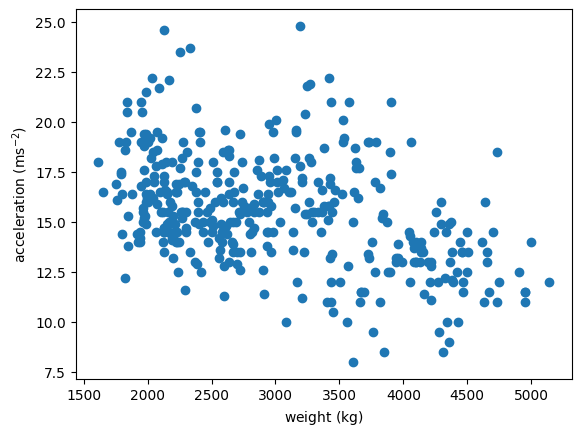

In [68]:
plt.scatter(x='weight', y='accel', data=df_mpg)
plt.xlabel('weight ($\mathrm{kg}$)')
plt.ylabel('acceleration ($\mathrm{ms}^{-2}$)')
plt.show()

**Histograms in 1D**

* Choose bins (intervals)
* Count realizations within bins & plots

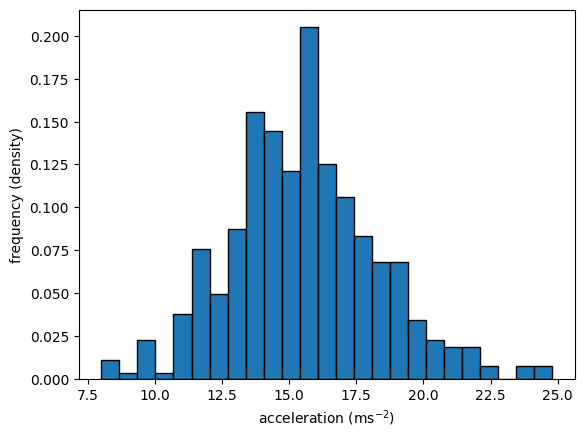

In [69]:
counts, bins, patches = plt.hist(x='accel', bins=25, data=df_mpg, ec='black', density=True)
plt.ylabel('frequency (density)')
plt.xlabel('acceleration ($\mathrm{ms}^{-2}$)')
plt.show()

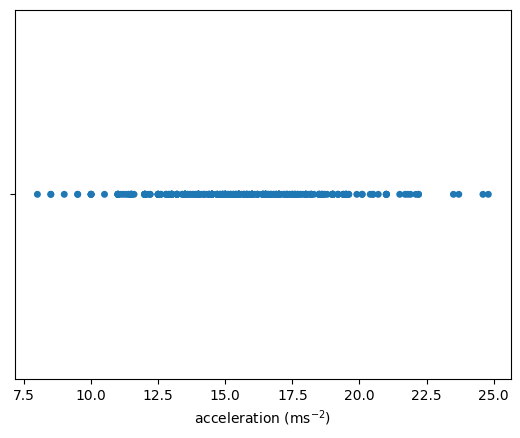

In [70]:
sns.stripplot(x='accel', data=df_mpg, jitter=False)
plt.xlabel('acceleration ($\mathrm{ms}^{-2}$)')
plt.show()

**Bins In 2D**

* Different shapes available for binning points
* Common choices: rectangles & hexagons

![bin shapes][1]

  [1]: https://raw.githubusercontent.com/trenton3983/DataCamp/master/Images/intro_to_data_visualization_in_python/2_3_bin_shapes.JPG

**`hist2d()`: Rectangular Binning**

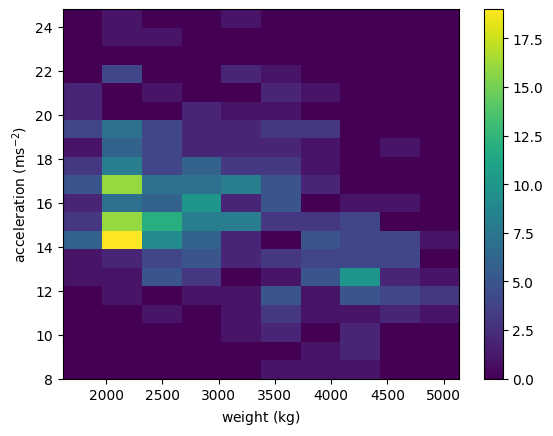

In [71]:
plt.hist2d(x='weight', y='accel', data=df_mpg, bins=(10, 20)) # x & y are 1D arrays of same length
plt.colorbar()
plt.xlabel('weight ($\mathrm{kg}$)')
plt.ylabel('acceleration ($\mathrm{ms}^{-2}$)')
plt.show()

**`hexbin()`: Hexagonal Binning**

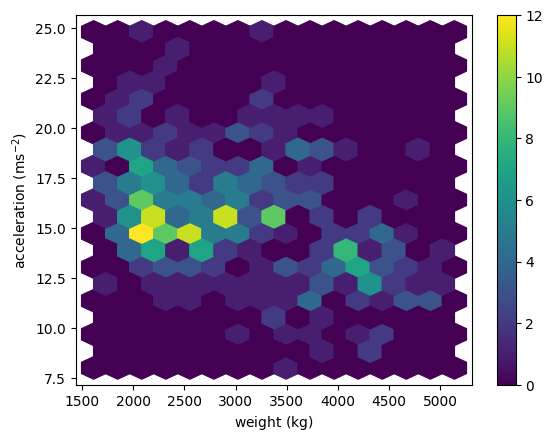

In [72]:
plt.hexbin(x='weight', y='accel', data=df_mpg, gridsize=(15, 10))
plt.colorbar()
plt.xlabel('weight ($\mathrm{kg}$)')
plt.ylabel('acceleration ($\mathrm{ms}^{-2}$)')
plt.show()

### Using hist2d()

Given a set of ordered pairs describing data points, you can count the number of points with similar values to construct a two-dimensional histogram. This is similar to a one-dimensional histogram, but it describes the joint variation of two random variables rather than just one.

In matplotlib, one function to visualize 2-D histograms is `plt.hist2d()`.

 * You specify the coordinates of the points using `plt.hist2d(x,y)` assuming `x` and `y` are two vectors of the same length.
 * You can specify the number of bins with the argument `bins=(nx, ny)` where `nx` is the number of bins to use in the horizontal direction and `ny` is the number of bins to use in the vertical direction.
 * You can specify the rectangular region in which the samples are counted in constructing the 2D histogram. The optional parameter required is `range=((xmin, xmax), (ymin, ymax))` where
 * `xmin` and `xmax` are the respective lower and upper limits for the variables on the x-axis and
 * `ymin` and `ymax` are the respective lower and upper limits for the variables on the y-axis. Notice that the optional `range` argument can use nested tuples or lists.

In this exercise, you'll use some data from the `auto-mpg` data set. There are two arrays `mpg` and `hp` that respectively contain miles per gallon and horse power ratings from over three hundred automobiles built.

**Instructions**

* Generate a two-dimensional histogram to view the joint variation of the `mpg` and `hp` arrays.
 * Put `hp` along the horizontal axis and `mpg` along the vertical axis.
 * Specify 20 by 20 rectangular bins with the `bins` argument.
 * Specify the region covered by using the optional `range` argument so that the plot samples `hp` between 40 and 235 on the x-axis and `mpg` between 8 and 48 on the y-axis. Your argument should take the form: `range=((xmin, xmax), (ymin, ymax))`.
* Add a color bar to the histogram.

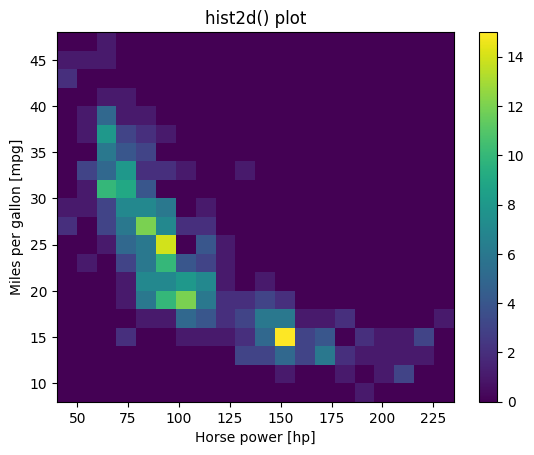

In [73]:
# Generate a 2-D histogram
plt.hist2d(df_mpg.hp, df_mpg.mpg, bins=(20, 20), range=((40, 235), (8, 48)))

# Add a color bar to the histogram
plt.colorbar()

# Add labels, title, and display the plot
plt.xlabel('Horse power [hp]')
plt.ylabel('Miles per gallon [mpg]')
plt.title('hist2d() plot')
plt.show()

### Using hexbin()

The function `plt.hist2d()` uses rectangular bins to construct a two dimensional histogram. As an alternative, the function `plt.hexbin()` uses hexagonal bins. The underlying algorithm (based on [this article from 1987][1]) constructs a hexagonal tesselation of a planar region and aggregates points inside hexagonal bins.

 * The optional `gridsize` argument (default 100) gives the number of hexagons across the x-direction used in the hexagonal tiling. If specified as a list or a tuple of length two, `gridsize` fixes the number of hexagon in the x- and y-directions respectively in the tiling.
 * The optional parameter ``extent=(xmin, xmax, ymin, ymax)`` specifies rectangular region covered by the hexagonal tiling. In that case, ``xmin`` and ``xmax`` are the respective lower and upper limits for the variables on the x-axis and ``ymin`` and ``ymax`` are the respective lower and upper limits for the variables on the y-axis.

In this exercise, you'll use the same `auto-mpg` data as in the last exercise (again using arrays `mpg` and `hp`). This time, you'll use `plt.hexbin()` to visualize the two-dimensional histogram.

**Instructions**

* Generate a two-dimensional histogram with `plt.hexbin()` to view the joint variation of the `mpg` and `hp` vectors.
 * Put `hp` along the horizontal axis and `mpg` along the vertical axis.
 * Specify a hexagonal tesselation with 15 hexagons across the x-direction and 12 hexagons across the y-direction using `gridsize`.
 * Specify the rectangular region covered with the optional `extent` argument: use `hp` from 40 to 235 and `mpg` from 8 to 48. _Note: Unlike the range argument in the previous exercise, `extent` takes **one** tuple of four values._
* Add a color bar to the histogram.

  [1]: http://amstat.tandfonline.com/doi/abs/10.1080/01621459.1987.10478445

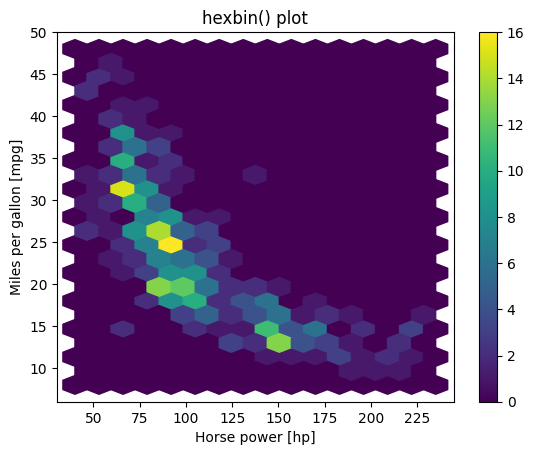

In [74]:
# Generate a 2d histogram with hexagonal bins
plt.hexbin(df_mpg.hp, df_mpg.mpg, gridsize=(15, 12), extent=(40, 235, 8, 48))

# Add a color bar to the histogram
plt.colorbar()

# Add labels, title, and display the plot
plt.xlabel('Horse power [hp]')
plt.ylabel('Miles per gallon [mpg]')
plt.title('hexbin() plot')
plt.show()

## Working With Images

* Grayscale images: rectangular 2D arrays
* Color images: typically three 2D arrays (channels)
 * RGB (Red-Green-Blue)
* Channel values:
 * 0 to 1 (floating-point numbers)
 * 0 to 255 (8 bit integers)

**Loading Images**

In [75]:
sunflower_path = Path('images/2_4_sunflower.jpg')

(309, 413, 3)


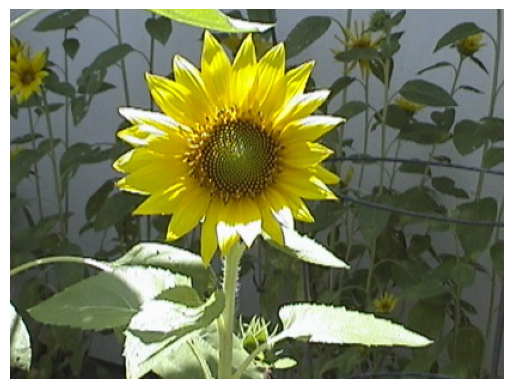

In [76]:
img = plt.imread(sunflower_path)
print(img.shape)
plt.imshow(img)
plt.axis('off')
plt.show()

**Reduction to gray-scale image**

(309, 413)


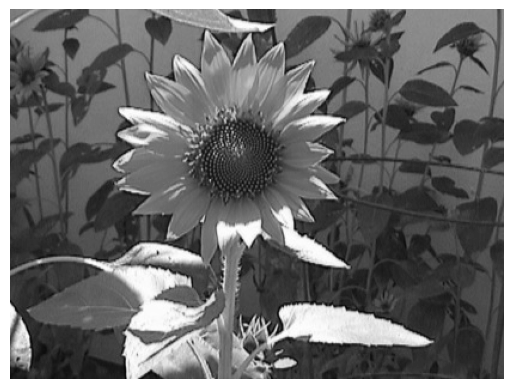

In [77]:
collapsed = img.mean(axis=2)
print(collapsed.shape)
plt.set_cmap('gray')
plt.imshow(collapsed, cmap='gray')
plt.axis('off')
plt.show()

**Uneven Samples**

(78, 207)


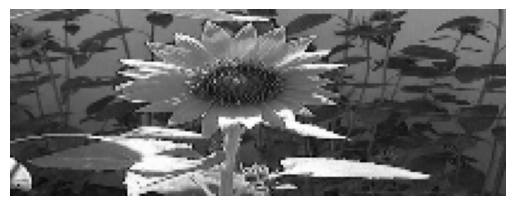

In [78]:
uneven = collapsed[::4,::2] # nonuniform subsampling
print(uneven.shape)
plt.imshow(uneven)
plt.axis('off')
plt.show()

**Adjusting Aspect Ratio**

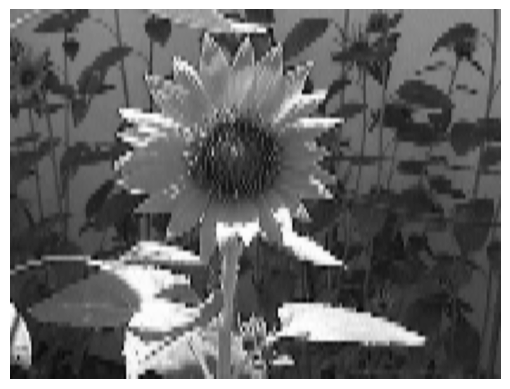

In [79]:
plt.imshow(uneven, aspect=2.0)
plt.axis('off')
plt.show()

**Adjusting Extent**

[**origin** and **extent** in `imshow`][1]

  [1]: https://matplotlib.org/3.1.1/tutorials/intermediate/imshow_extent.html

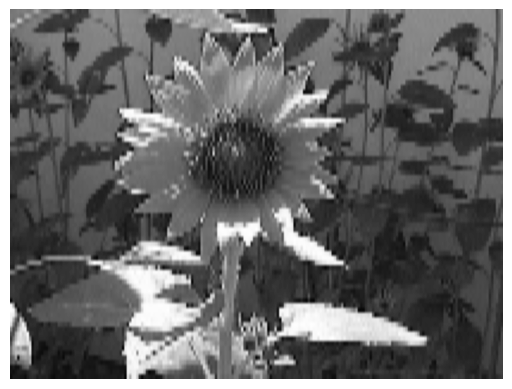

In [80]:
plt.imshow(uneven, cmap='gray', extent=(0, 640, 0, 480))
plt.axis('off')
plt.show()

### Loading, examining images

Color images such as photographs contain the intensity of the red, green and blue color channels.

 * To read an image from file, use `plt.imread()` by passing the path to a file, such as a PNG or JPG file.
 * The color image can be plotted as usual using `plt.imshow()`.
 * The resulting image loaded is a NumPy array of three dimensions. The array typically has dimensions **M × N × 3**, where **M × N** is the dimensions of the image. The third dimensions are referred to as color channels (typically red, green, and blue).
 * The color channels can be extracted by Numpy array slicing.

In this exercise, you will load & display [an image of an astronaut][1] (by NASA (Public domain), via [Wikimedia Commons][2]). You will also examine its attributes to understand how color images are represented.

**Instructions**

* Load the file `'480px-Astronaut-EVA.jpg'` into an array.
* Print the shape of the `img` array. How wide and tall do you expect the image to be?
* Prepare `img` for display using `plt.imshow()`.
* Turn off the axes using `plt.axis('off')`.

  [1]: https://en.wikipedia.org/wiki/File:Astronaut-EVA.jpg
  [2]: https://commons.wikimedia.org/

In [81]:
dir_path_astro = Path('images/480px-Bruce_McCandless_II_during_EVA_in_1984.jpg')

(480, 480, 3)


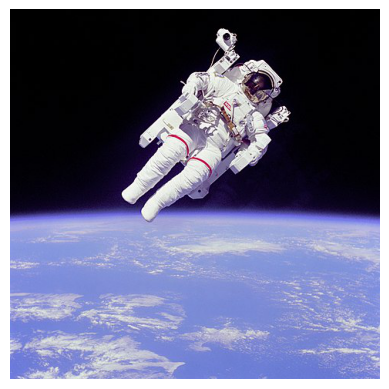

In [82]:
# Load the image into an array: img
img = plt.imread(dir_path_astro)

# Print the shape of the image
print(img.shape)

# Display the image
plt.imshow(img)

# Hide the axes
plt.axis('off')
plt.show()

### Pseudocolor plot from image data

Image data comes in many forms and it is not always appropriate to display the available channels in RGB space. In many situations, an image may be processed and analysed in some way before it is visualized in pseudocolor, also known as 'false' color.

In this exercise, you will perform a simple analysis using the image showing an astronaut as viewed from space. Instead of simply displaying the image, you will compute the total intensity across the red, green and blue channels. The result is a single two dimensional array which you will display using `plt.imshow()` with the `'gray'` colormap.

**Instructions**

* Print the shape of the existing image array.
* Compute the sum of the red, green, and blue channels of `img` by using the `.sum()` method with `axis=2`.
* Print the shape of the `intensity` array to verify this is the shape you expect.
* Plot `intensity` with `plt.imshow()` using a `'gray'` colormap.
* Add a colorbar to the figure.

(480, 480, 3)
(480, 480)


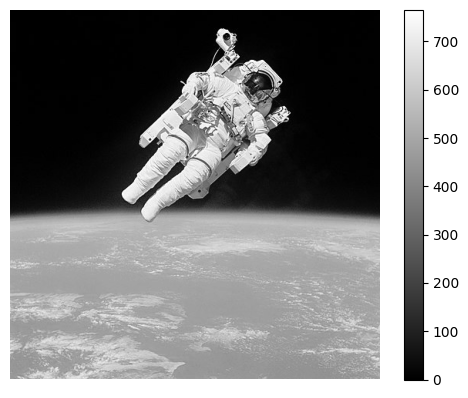

In [83]:
# Load the image into an array: img
img = plt.imread(dir_path_astro)

# Print the shape of the image
print(img.shape)

# Compute the sum of the red, green and blue channels: intensity
intensity = img.sum(axis=2)

# Print the shape of the intensity
print(intensity.shape)

# Display the intensity with a colormap of 'gray'
plt.imshow(intensity, cmap='gray')

# Add a colorbar
plt.colorbar()

# Hide the axes and show the figure
plt.axis('off')
plt.show()

### Extent and aspect

When using `plt.imshow()` to display an array, the default behavior is to keep pixels square so that the height to width ratio of the output matches the ratio determined by the shape of the array. In addition, by default, the x- and y-axes are labeled by the number of samples in each direction.

The ratio of the displayed width to height is known as the image `aspect` and the range used to label the x- and y-axes is known as the image `extent`. The default `aspect` value of `'auto'` keeps the pixels square and the extents are automatically computed from the shape of the array if not specified otherwise.

In this exercise, you will investigate how to set these options explicitly by plotting the same image in a 2 by 2 grid of subplots with distinct `aspect` and `extent` options.

**Instructions**

* Display `img` in the top left subplot with horizontal extent from -1 to 1, vertical extent from -1 to 1, and aspect ratio 0.5.
* Display `img` in the top right subplot with horizontal extent from -1 to 1, vertical extent from -1 to 1, and aspect ratio 1.
* Display `img` in the bottom left subplot with horizontal extent from -1 to 1, vertical extent from -1 to 1, and aspect ratio 2.
* Display `img` in the bottom right subplot with horizontal extent from -2 to 2, vertical extent from -1 to 1, and aspect ratio 2.

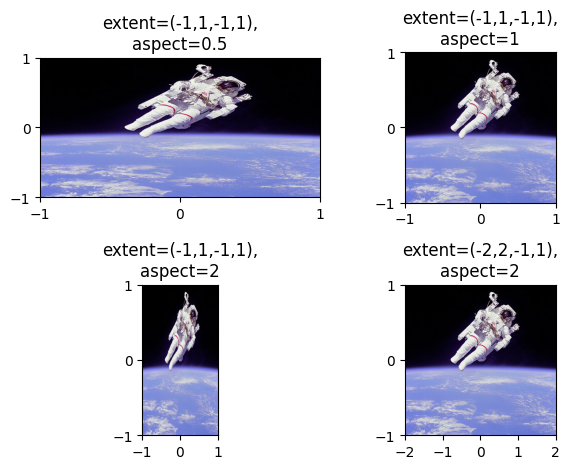

In [84]:
# Load the image into an array: img
img = plt.imread(dir_path_astro)

# Specify the extent and aspect ratio of the top left subplot
plt.subplot(2,2,1)
plt.title('extent=(-1,1,-1,1),\naspect=0.5') 
plt.xticks([-1,0,1])
plt.yticks([-1,0,1])
plt.imshow(img, extent=(-1,1,-1,1), aspect=0.5)

# Specify the extent and aspect ratio of the top right subplot
plt.subplot(2,2,2)
plt.title('extent=(-1,1,-1,1),\naspect=1')
plt.xticks([-1,0,1])
plt.yticks([-1,0,1])
plt.imshow(img, extent=(-1,1,-1,1), aspect=1)

# Specify the extent and aspect ratio of the bottom left subplot
plt.subplot(2,2,3)
plt.title('extent=(-1,1,-1,1),\naspect=2')
plt.xticks([-1,0,1])
plt.yticks([-1,0,1])
plt.imshow(img, extent=(-1,1,-1,1), aspect=2)

# Specify the extent and aspect ratio of the bottom right subplot
plt.subplot(2,2,4)
plt.title('extent=(-2,2,-1,1),\naspect=2')
plt.xticks([-2,-1,0,1,2])
plt.yticks([-1,0,1])
plt.imshow(img, extent=(-2,2,-1,1), aspect=2)

# Improve spacing and display the figure
plt.tight_layout()
plt.show()

### Rescaling pixel intensities
Sometimes, low contrast images can be improved by rescaling their intensities. For instance, this image of Hawkes Bay, New Zealand has no pixel values near 0 or near 255 (the limits of valid intensities). (originally by Phillip Capper, modified by User:Konstable, via Wikimedia Commons, [CC BY 2.0][1])

![Hawkes Bay, New Zealand][2]

For this exercise, you will do a simple rescaling (remember, an image is NumPy array) to translate and stretch the pixel intensities so that the intensities of the new image fill the range from 0 to 255.

**Instructions**

* Use the methods `.min()` and `.max()` to save the minimum and maximum values from the array `image` as `pmin` and `pmax` respectively.
* Create a new 2-D array `rescaled_image` using `256*(image-pmin)/(pmax-pmin)`
* Plot the new array `rescaled_image`.

  [1]: https://creativecommons.org/licenses/by/2.0/
  [2]: https://raw.githubusercontent.com/trenton3983/DataCamp/master/Images/intro_to_data_visualization_in_python/2_4_4_rescaling_pixel_intensities.JPG

In [85]:
dir_path_hawk = Path('images/640px-Unequalized_Hawkes_Bay_NZ.jpg')

The smallest & largest pixel intensities are 104 & 230.
The rescaled smallest & largest pixel intensities are 0.0 & 256.0.


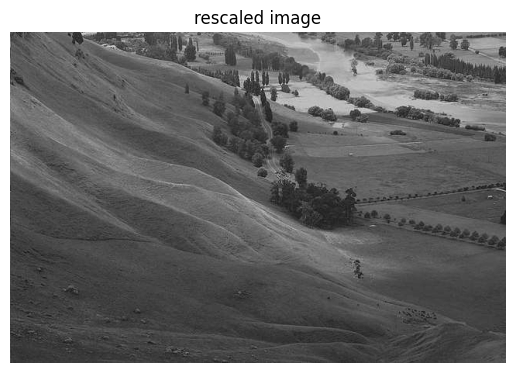

In [86]:
# Load the image into an array: image
image = plt.imread(dir_path_hawk)

# Extract minimum and maximum values from the image: pmin, pmax
pmin, pmax = image.min(), image.max()
print(f"The smallest & largest pixel intensities are {pmin} & {pmax}.")

# Rescale the pixels: rescaled_image
rescaled_image = 256*(image - pmin) / (pmax - pmin)
print(f"The rescaled smallest & largest pixel intensities are {rescaled_image.min()} & {rescaled_image.max()}.")

# Display the rescaled image
plt.title('rescaled image')
plt.axis('off')
plt.imshow(rescaled_image, cmap='gray')

plt.show()

# Statistical plots with Seaborn

This is a high-level tour of the seaborn plotting library for producing statistical graphics in Python. We'll cover seaborn tools for computing and visualizing linear regressions, as well as tools for visualizing univariate distributions (like strip, swarm, and violin plots) and multivariate distributions (like joint plots, pair plots, and heatmaps). We'll also discuss grouping categories in plots.

## Visualizing Regressions

* [seaborn][1]
* [The Python Graph Gallery][2]

**Recap: Pandas DataFrames**

* Labelled tabular data structure
* Labels on rows: index
* Labels on columns: columns
* Columns are Pandas Series

  [1]: https://seaborn.pydata.org/
  [2]: https://python-graph-gallery.com/

In [87]:
tips = sns.load_dataset('tips')
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


**Linear Regression Plots**

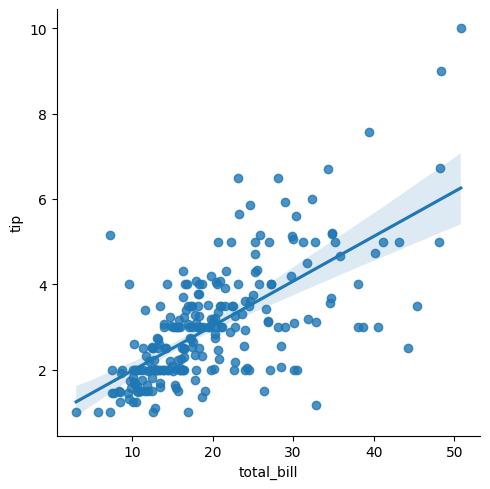

In [88]:
sns.lmplot(x= 'total_bill', y='tip', data=tips)
plt.show()

**Factors & Grouping Factors (same plot)**

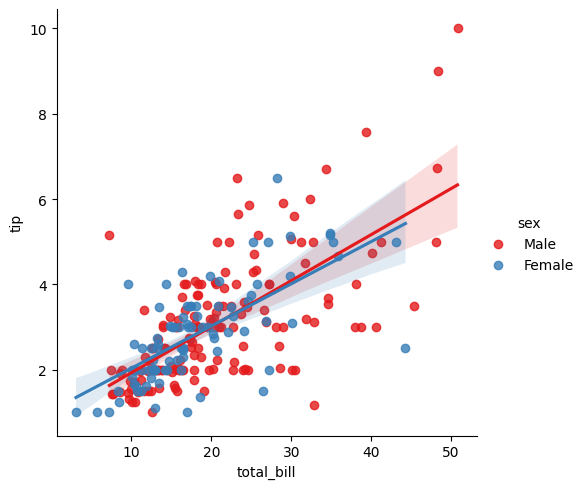

In [89]:
sns.lmplot(x= 'total_bill', y='tip', data=tips, hue='sex', palette='Set1')
plt.show()

**Grouping Factors (subplots)**

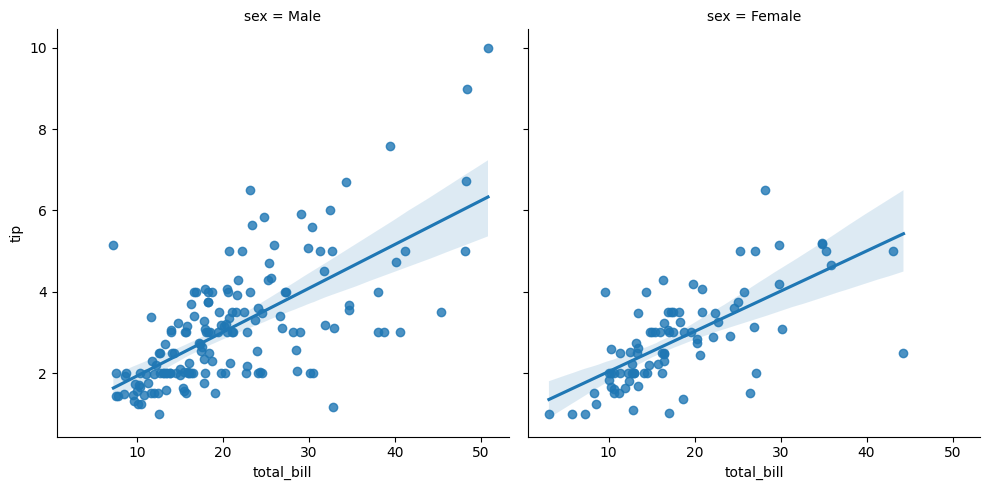

In [90]:
sns.lmplot(x= 'total_bill', y='tip', data=tips, col='sex')
plt.show()

**Resibual Plots**

* Similar arguments as lmplot() but more flexible
 * x, y can be arrays or strings
 * data is DataFrame (optional)
* Optional arguments (e.g., color) as in Matplotlib

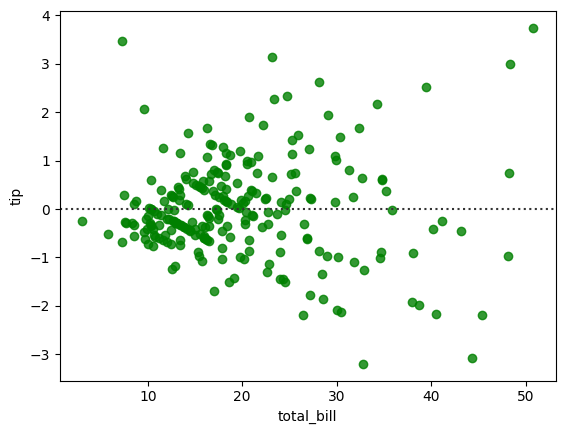

In [91]:
sns.residplot(x= 'total_bill', y='tip', data=tips, color='green')
plt.show()

### Simple linear regressions

As you have seen, seaborn provides a convenient interface to generate complex and great-looking statistical plots. One of the simplest things you can do using seaborn is to fit and visualize a simple linear regression between two variables using `sns.lmplot()`.

One difference between seaborn and regular matplotlib plotting is that you can pass pandas DataFrames directly to the plot and refer to each column by name. For example, if you were to plot the column `'price'` vs the column `'area'` from a DataFrame `df`, you could call `sns.lmplot(x='area', y='price', data=df)`.

In this exercise, you will once again use the DataFrame `auto` containing the auto-mpg dataset. You will plot a linear regression illustrating the relationship between automobile weight and horse power.

**Instructions**

* Import `matplotlib.pyplot` and `seaborn` using the standard names `plt` and `sns` respectively.
* Plot a linear regression between the `'weight'` column (on the x-axis) and the `'hp'` column (on the y-axis) from the DataFrame `auto`.
* Display the plot as usual with `plt.show()`. This has been done for you, so hit 'Submit Answer' to view the plot.

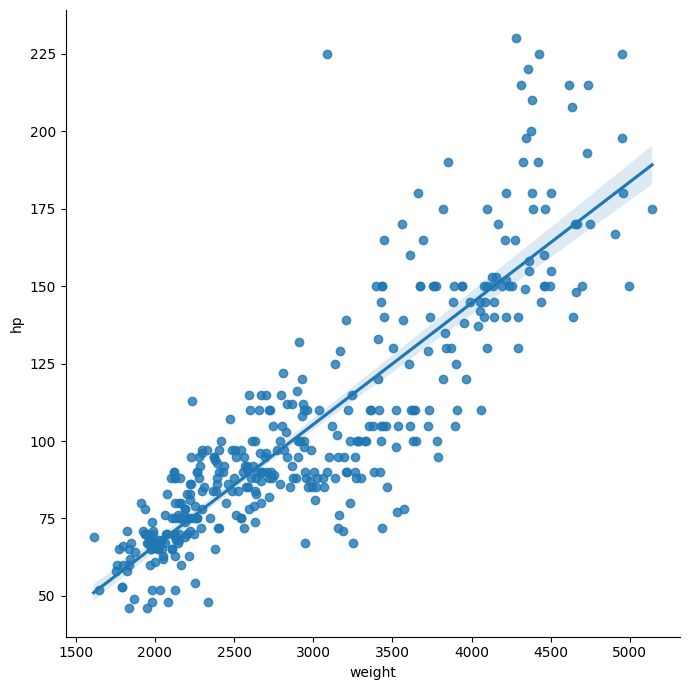

In [92]:
# Plot a linear regression between 'weight' and 'hp'
sns.lmplot(x='weight', y='hp', data=df_mpg, height=7)

# Display the plot
plt.show()

**Unsurprisingly, there is a strong correlation between `'hp'` and `'weight'`, and a linear regression is easily able to capture this trend.**

### Plotting residuals of a regression

Often, you don't just want to see the regression itself but also see the residuals to get a better idea how well the regression captured the data. Seaborn provides `sns.residplot()` for that purpose, visualizing how far datapoints diverge from the regression line.

In this exercise, you will visualize the residuals of a regression between the `'hp'` column (horse power) and the `'mpg'` column (miles per gallon) of the `auto` DataFrame used previously.

**Instructions**

* Import `matplotlib.pyplot` and `seaborn` using the standard names `plt` and `sns` respectively.
* Generate a green residual plot of the regression between `'hp'` (on the x-axis) and `'mpg'` (on the y-axis). You will need to specify the additional `data` and `color` parameters.
* Display the plot as usual using `plt.show()`. This has been done for you, so hit 'Submit Answer' to view the plot.

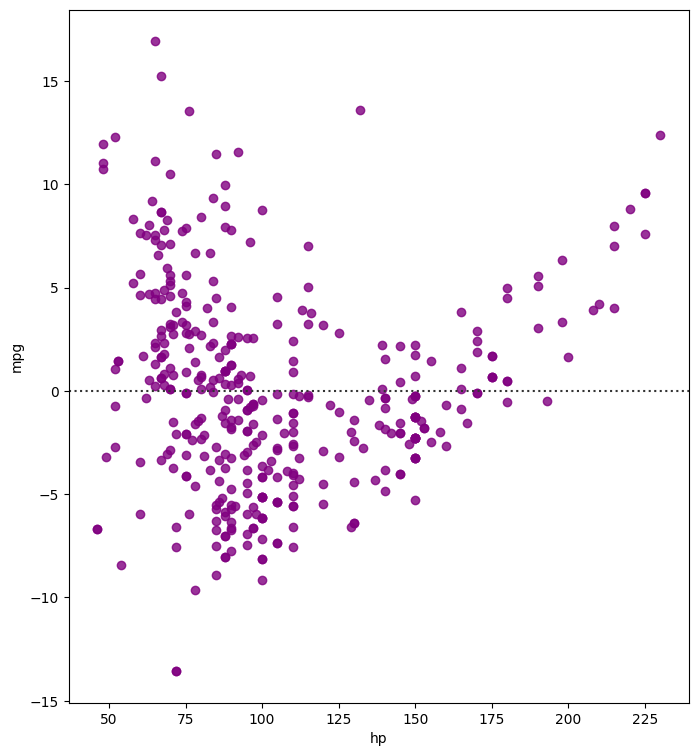

In [93]:
plt.figure(figsize=(8, 9))

# Generate a green residual plot of the regression between 'hp' and 'mpg'
sns.residplot(x='hp', y='mpg', data=df_mpg, color='purple')

# Display the plot
plt.show()

### Higher-order regressions

When there are more complex relationships between two variables, a simple first order regression is often not sufficient to accurately capture the relationship between the variables. Seaborn makes it simple to compute and visualize regressions of varying orders.

Here, you will plot a second order regression between the horse power (`'hp'`) and miles per gallon (`'mpg'`) using `sns.regplot()` (the function `sns.lmplot()` is a higher-level interface to `sns.regplot()`). However, before plotting this relationship, compare how the residual changes depending on the order of the regression. Does a second order regression perform significantly better than a simple linear regression?

 * A principal difference between `sns.lmplot()` and `sns.regplot()` is the way in which matplotlib options are passed (`sns.regplot()` is more permissive).
 * For both `sns.lmplot()` and `sns.regplot()`, the keyword `order` is used to control the order of polynomial regression.
 * The function `sns.regplot()` uses the argument `scatter=None` to prevent plotting the scatter plot points again.

**Instructions**

* Create a scatter plot with `auto['weight']` on the x-axis and `auto['mpg']` on the y-axis, with `label='data'`. This has been done for you.
* Plot a first order linear regression line between `'weight'` and `'mpg'` in `'blue'` without the scatter points.
 * You need to specify the `label` (`'First Order'`, case-sensitive) and `color` parameters, in addition to `scatter=None`.
* Plot a second order linear regression line between `'weight'` and `'mpg'` in `'green'` without the scatter points.
 * To force a higher order regression, you need to specify the `order` parameter (here, it should be `2`). Don't forget to again add a label (`'Second Order'`).
* Add a legend to the `'upper right'`.

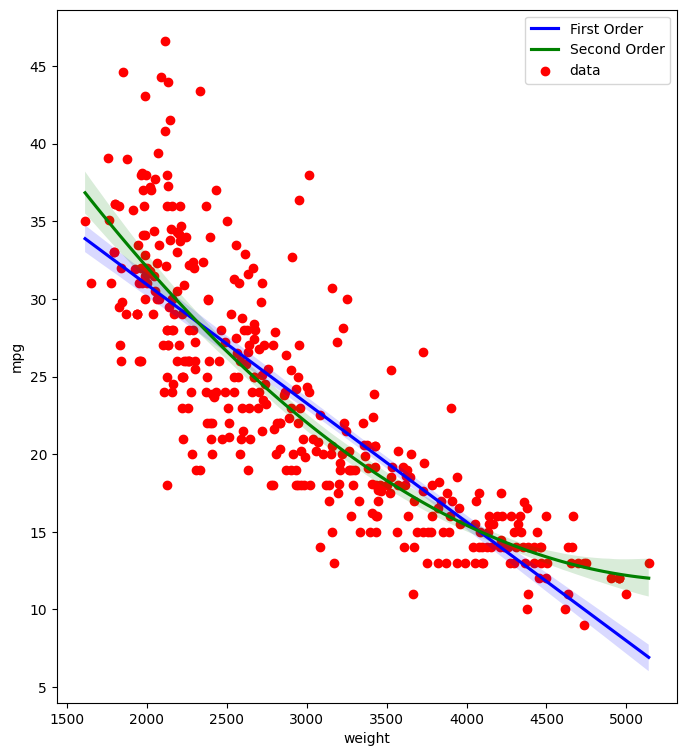

In [94]:
plt.figure(figsize=(8, 9))

# Generate a scatter plot of 'weight' and 'mpg' using red circles
plt.scatter(df_mpg.weight, df_mpg.mpg, label='data', color='red', marker='o')

# Plot in blue a linear regression of order 1 between 'weight' and 'mpg'
sns.regplot(x='weight', y='mpg', data=df_mpg, color='blue', scatter=None, label='First Order')

# Plot in green a linear regression of order 2 between 'weight' and 'mpg'
sns.regplot(x='weight', y='mpg', data=df_mpg, order=2, color='green', scatter=None, label='Second Order')

# Add a legend and display the plot
plt.legend(loc='upper right')
plt.show()

**It seems like a regression of order 2 is necessary to properly capture the relationship between `'weight'` and `'mpg'`.**

### Grouping linear regressions by hue

Often it is useful to compare and contrast trends between different groups. Seaborn makes it possible to apply linear regressions separately for subsets of the data by applying a groupby operation. Using the `hue` argument, you can specify a categorical variable by which to group data observations. The distinct groups of points are used to produce distinct regressions with different hues in the plot.

In the automobile dataset - which has been pre-loaded here as `auto` - you can view the relationship between weight (`'weight'`) and horsepower (`'hp'`) of the cars and group them by their origin (`'origin'`), giving you a quick visual indication how the relationship differs by continent.

**Instructions**

* Plot a linear regression between `'weight'` and `'hp'` grouped by `'origin'`.
 * Use the keyword argument `hue` to group rows with the categorical column `'origin'`.
 * Use the keyword argument `palette` to specify the `'Set1'` palette for coloring the distinct groups.

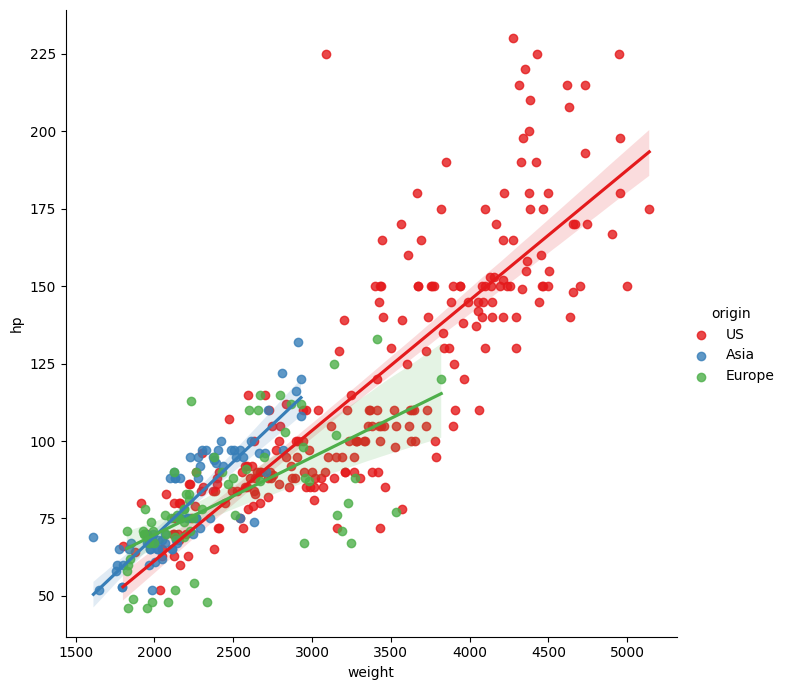

In [95]:
# Plot a linear regression between 'weight' and 'hp', with a hue of 'origin' and palette of 'Set1'
sns.lmplot(x='weight', y='hp', data=df_mpg, hue='origin', palette='Set1', height=7)

# Display the plot
plt.show()

### Grouping linear regressions by row or column

Rather than overlaying linear regressions of grouped data in the same plot, we may want to use a grid of subplots. The `sns.lmplot()` accepts the arguments `row` and/or `col` to arrangements of subplots for regressions.

You'll use the automobile dataset again and, this time, you'll use the keyword argument `row` to display the subplots organized in rows. That is, you'll produce horsepower vs. weight regressions grouped by continent of origin in separate subplots stacked vertically.

**Instructions**

* Plot linear regressions of `'hp'` (on the y-axis) versus `'weight'` (on the x-axis) grouped row-wise by `'origin'` from DataFrame `auto`.
* Use the keyword argument `row` to group observations with the categorical column `'origin'` in subplots organized in rows.

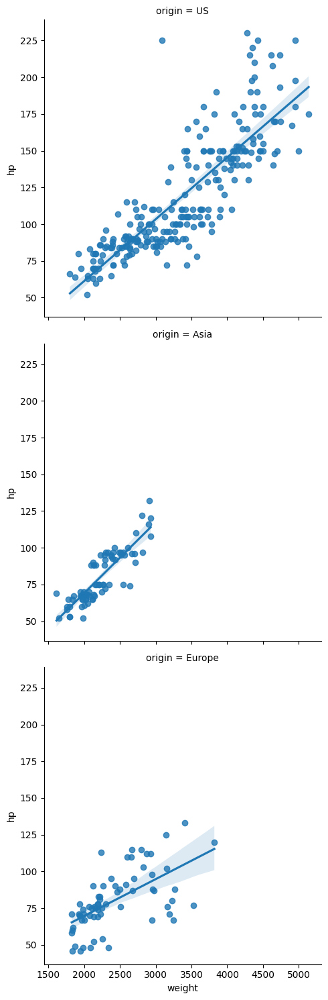

In [96]:
# Plot linear regressions between 'weight' and 'hp' grouped row-wise by 'origin'
sns.lmplot(x='weight', y='hp', data=df_mpg, row='origin')


# Display the plot
plt.show()

## Visualizing Univariate Distributions

* Univariate → “one variable”
* Visualization techniques for sampled univariate data
 * Strip plots
 * Swarm plots
 * Violin plots

**Using `stripplot()`**

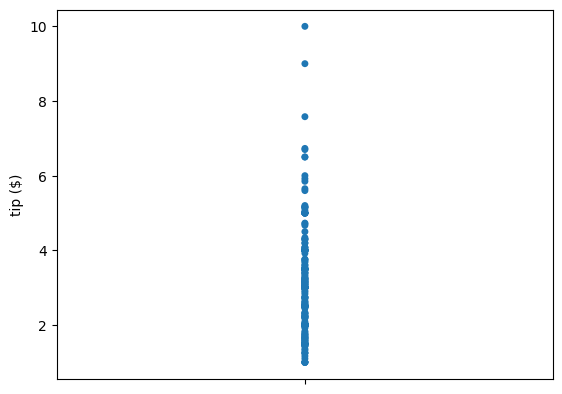

In [97]:
sns.stripplot(y= 'tip', data=tips, jitter=False)
plt.ylabel('tip ($)')
plt.show()

**Grouping With `stripplot()`**

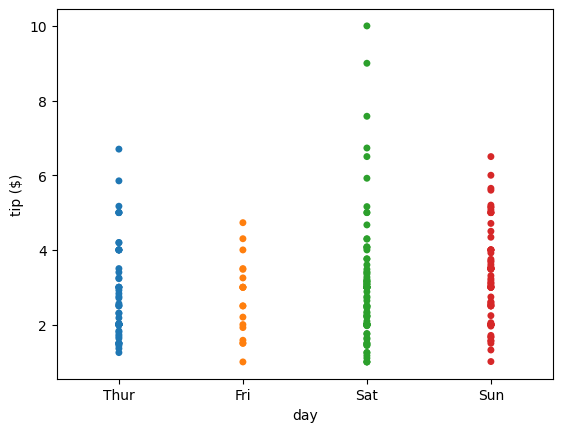

In [98]:
sns.stripplot(x='day', y='tip', data=tips, jitter=False)
plt.ylabel('tip ($)')
plt.show()

**Spreading Out Strip Plots**

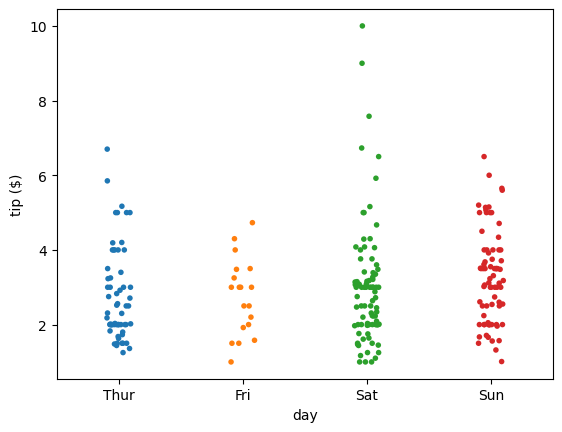

In [99]:
sns.stripplot(x='day', y='tip', data=tips, jitter=True, size=4)
plt.ylabel('tip ($)')
plt.show()

**Using `swarmplot()`**

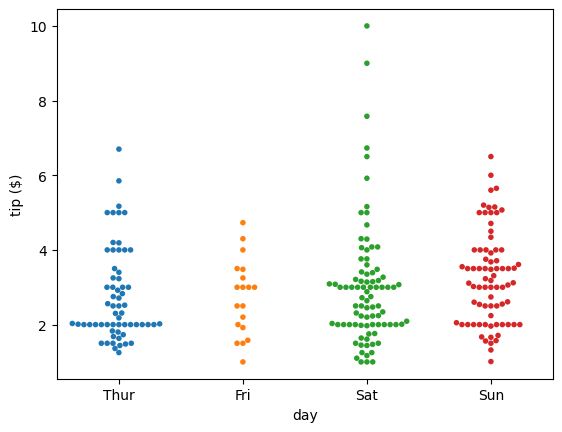

In [100]:
sns.swarmplot(x='day', y='tip', data=tips, size=4)
plt.ylabel('tip ($)')
plt.show()

**More Grouping With `swarmplot()`**

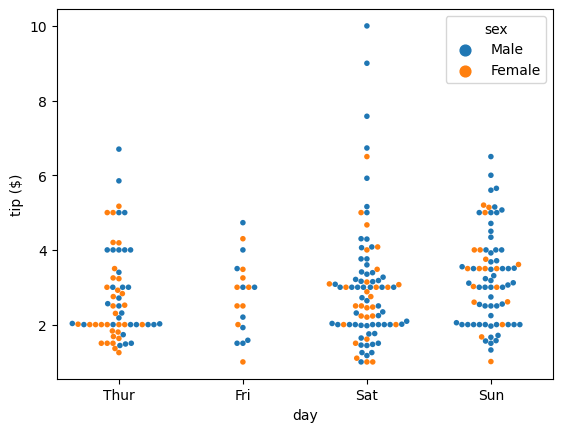

In [101]:
sns.swarmplot(x='day', y='tip', data=tips, size=4, hue='sex')
plt.ylabel('tip ($)')
plt.show()

**Changing Orientation**

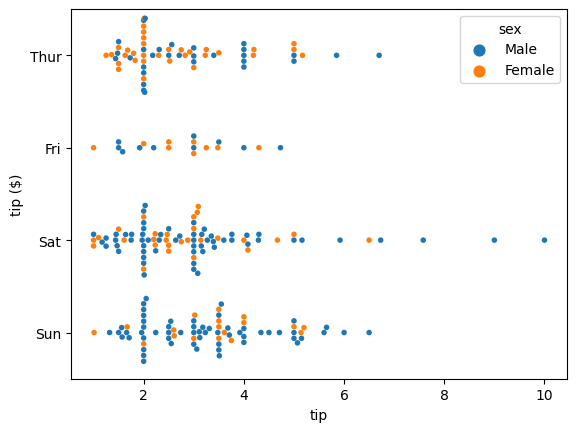

In [102]:
sns.swarmplot(x='tip', y='day', data=tips, size=4, hue='sex', orient='h')
plt.ylabel('tip ($)')
plt.show()

**Using `violinplot()`**

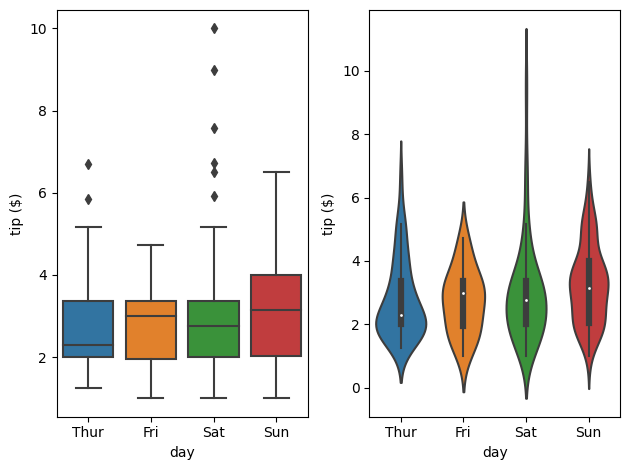

In [103]:
plt.subplot(1,2,1)
sns.boxplot(x='day', y='tip', data=tips)
plt.ylabel('tip ($)')
plt.subplot(1,2,2)
sns.violinplot(x='day', y='tip', data=tips)
plt.ylabel('tip ($)')
plt.tight_layout()
plt.show()

**Combining Plots**

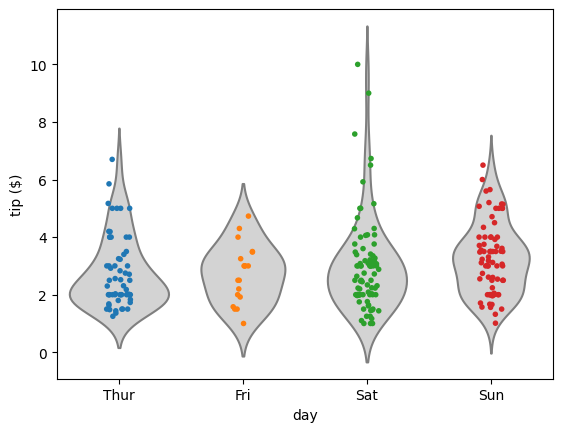

In [104]:
sns.violinplot(x='day', y='tip', data=tips, inner=None, color='lightgray')
sns.stripplot(x='day', y='tip', data=tips, size=4, jitter=True)
plt.ylabel('tip ($)')
plt.show()

### Constructing strip plots

Regressions are useful to understand relationships between two continuous variables. Often we want to explore how the distribution of a single continuous variable is affected by a second categorical variable. Seaborn provides a variety of plot types to perform these types of comparisons between univariate distributions.

The strip plot is one way of visualizing this kind of data. It plots the distribution of variables for each category as individual datapoints. For vertical strip plots (the default), distributions of continuous values are laid out parallel to the y-axis and the distinct categories are spaced out along the x-axis.

 * For example, `sns.stripplot(x='type', y='length', data=df)` produces a sequence of vertical strip plots of `length` distributions grouped by `type` (assuming `length` is a continuous column and `type` is a categorical column of the DataFrame `df`).
 * Overlapping points can be difficult to distinguish in strip plots. The argument `jitter=True` helps spread out overlapping points.
 * Other matplotlib arguments can be passed to `sns.stripplot()`, e.g., `marker`, `color`, `size`, etc.

**Instructions**

* In the first row of subplots, make a strip plot showing distribution of `'hp'` values grouped horizontally by `'cyl'`.
* In the second row of subplots, make a second strip plot with improved readability. In particular, you'll call `sns.stripplot()` again, this time adding `jitter=True` and decreasing the point size to 3 using the `size` parameter.

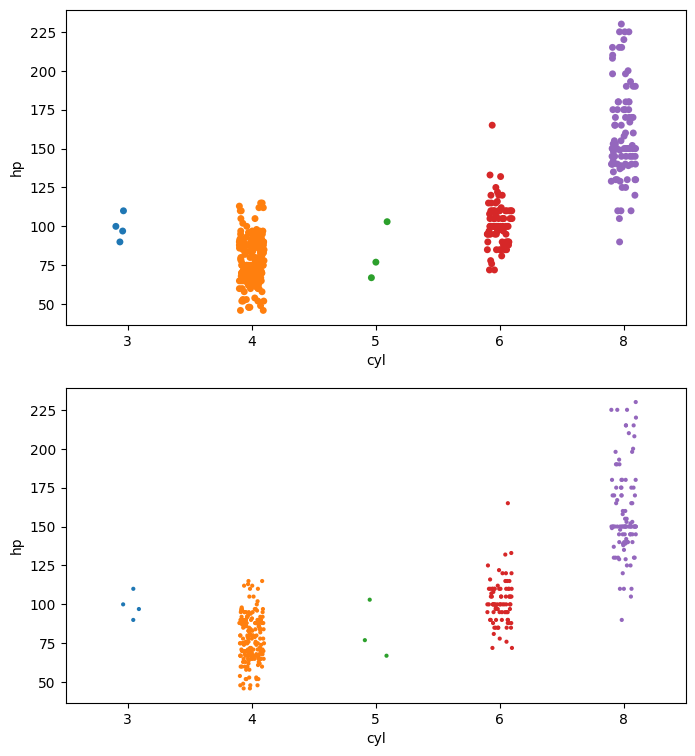

In [105]:
plt.figure(figsize=(8, 9))

# Make a strip plot of 'hp' grouped by 'cyl'
plt.subplot(2,1,1)
sns.stripplot(x='cyl', y='hp', data=df_mpg)

# Make the strip plot again using jitter and a smaller point size
plt.subplot(2,1,2)
sns.stripplot(x='cyl', y='hp', data=df_mpg, jitter=True, size=3)

# Display the plot
plt.show()

**Here, `'hp'` is the continuous variable, and `'cyl'` is the categorical variable. The strip plot shows that automobiles with more cylinders tend to have higher horsepower.**

### Constructing swarm plots

As you have seen, a strip plot can be visually crowded even with jitter applied and smaller point sizes. An alternative is provided by the swarm plot (`sns.swarmplot()`), which is very similar but spreads out the points to avoid overlap and provides a better visual overview of the data.

* The syntax for `sns.swarmplot()` is similar to that of` sns.stripplot()`, e.g., `sns.swarmplot(x='type', y='length', data=df)`.
* The orientation for the continuous variable in the strip/swarm plot can be inferred from the choice of the columns `x` and `y` from the DataFrame `data`. The orientation can be set explicitly using `orient='h'` (horizontal) or `orient='v'` (vertical).
* Another grouping can be added in using the `hue` keyword. For instance, using `sns.swarmplot(x='type', y='length', data=df, hue='build year')` makes a swarm plot from the DataFrame `df` with the `'length'` column values spread out vertically, horizontally grouped by the column `'type'` and each point colored by the categorical column `'build year'`.

In this exercise, you'll use the `auto` DataFrame again to illustrate the use of `sns.swarmplot()` with grouping by `hue` and with explicit specification of the orientation using the keyword `orient`.

**Instructions**

* In the first row of subplots, make a swarm plot showing distribution of `'hp'` values grouped horizontally by `'cyl'`.
* In the second row of subplots, make a second swarm plot with horizontal orientation (i.e. grouped vertically by `'cyl'` with `'hp'` value spread out horizontally).
 * In addition to _reversing_ the columns for the `x` and `y` parameters, you will need to specify the `orient` parameter to explicitly set the horizontal orientation.
 * Color the points by `'origin'` (refer to the text above if you don't know how to do this).

/usr/local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 32.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 11.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 32.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 18.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 18.4% of the points cannot be placed; y

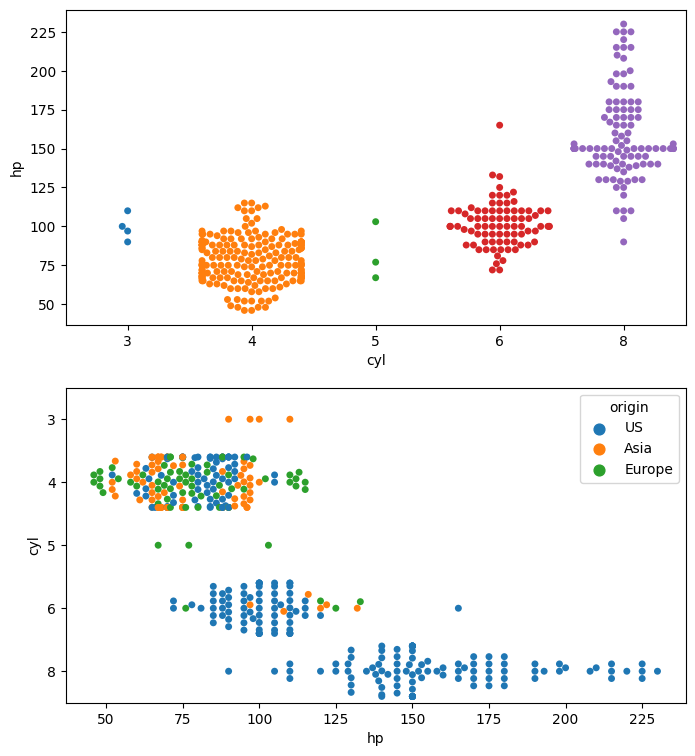

In [106]:
plt.figure(figsize=(8, 9))

# Generate a swarm plot of 'hp' grouped horizontally by 'cyl'  
plt.subplot(2,1,1)
sns.swarmplot(x='cyl', y='hp', data=df_mpg)

# Generate a swarm plot of 'hp' grouped vertically by 'cyl' with a hue of 'origin'
plt.subplot(2,1,2)
sns.swarmplot(x='hp', y='cyl', data=df_mpg, orient='h', hue='origin')

# Display the plot
plt.show()

**Swarm plots are generally easier to understand than strip plots because they spread out the points to avoid overlap.**

### Constructing violin plots

Both strip and swarm plots visualize all the datapoints. For large datasets, this can result in significant overplotting. Therefore, it is often useful to use plot types which reduce a dataset to more descriptive statistics and provide a good summary of the data. Box and whisker plots are a classic way of summarizing univariate distributions but seaborn provides a more sophisticated extension of the standard box plot, called a violin plot.

Here, you will produce violin plots of the distribution of horse power (`'hp'`) by the number of cylinders (`'cyl'`). Additionally, you will combine two different plot types by overlaying a strip plot on the violin plot.

As before, the DataFrame has been pre-loaded for you as `auto`.

**Instructions**

* In the first row of subplots, make a violin plot showing the distribution of `'hp'` grouped by `'cyl'`.
* In the second row of subplots, make a second violin plot without the inner annotations (by specifying `inner=None`) and with the color `'lightgray'`.
* In the second row of subplots, overlay a strip plot with jitter and a point size of `1.5`.

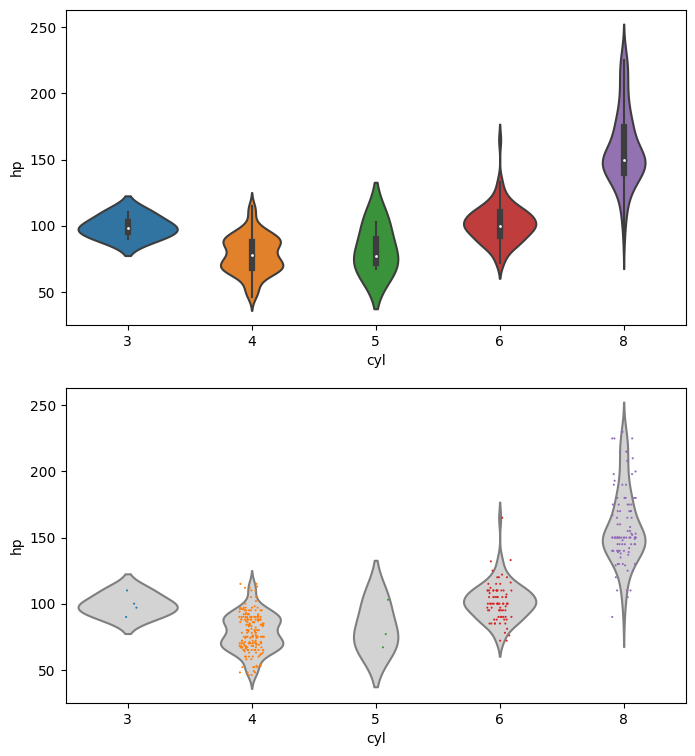

In [107]:
plt.figure(figsize=(8, 9))

# Generate a violin plot of 'hp' grouped horizontally by 'cyl'
plt.subplot(2,1,1)
sns.violinplot(x='cyl', y='hp', data=df_mpg)

# Generate the same violin plot again with a color of 'lightgray' and without inner annotations
plt.subplot(2,1,2)
sns.violinplot(x='cyl', y='hp', data=df_mpg, inner=None, color='lightgray')

# Overlay a strip plot on the violin plot
sns.stripplot(x='cyl', y='hp', data=df_mpg, size=1.5, jitter=True)

# Display the plot
plt.show()

**Violin plots are a nice way of visualizing the relationship between a continuous variable and a categorical variable.**

## Visualizing Multivariate Distributions

* Bivariate → “two variables”
* Multivariate → “multiple variables”
* Visualizing relationships in multivariate data
 * Joint plots
 * Pair plots
 * Heat maps
 
**Using `jointplot()`**

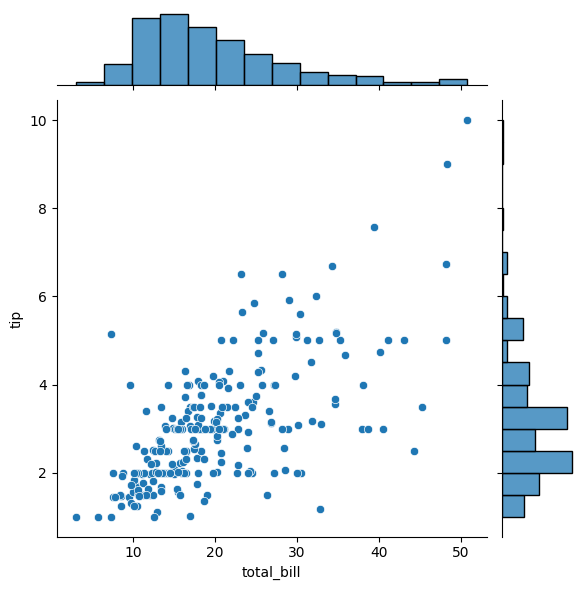

In [108]:
sns.jointplot(x= 'total_bill', y= 'tip', data=tips)
plt.show()

**Joint Plot Using `kde=True`**

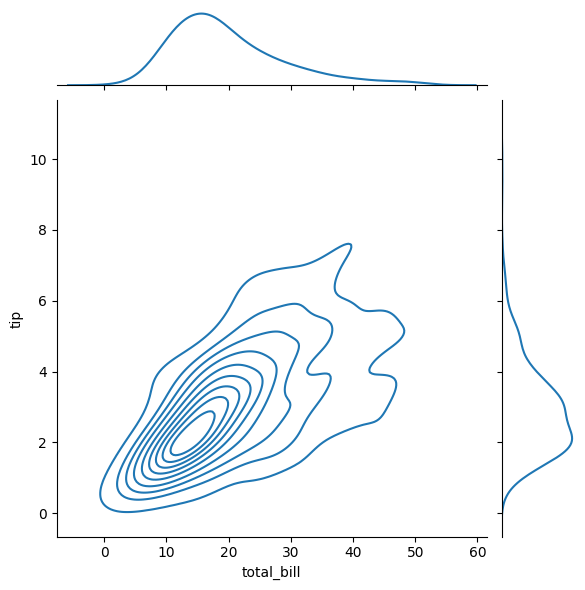

In [109]:
sns.jointplot(x='total_bill', y= 'tip', data=tips, kind='kde')
plt.show()

**Using `pairplot()`**

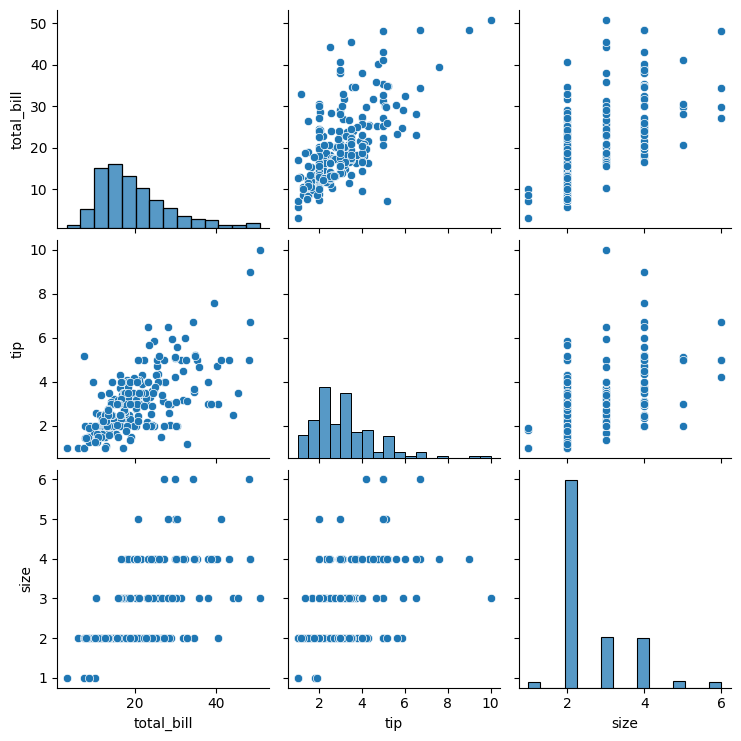

In [110]:
sns.pairplot(tips)
plt.show()

**Using `pairplot()` with `hue`**

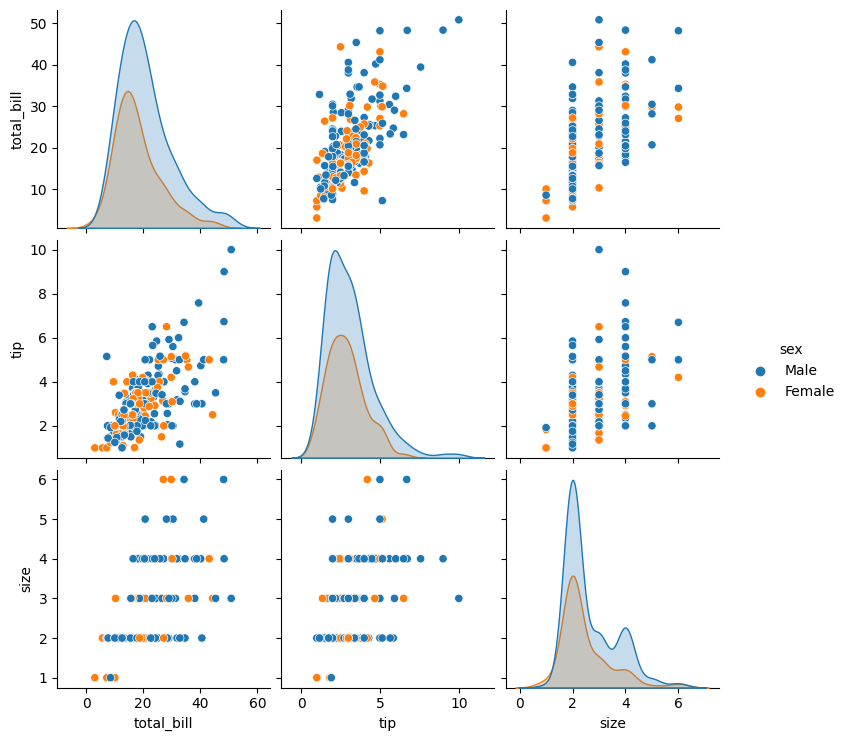

In [111]:
sns.pairplot(tips, hue='sex')
plt.show()

**Correlation heat map using `heatmap()`**

In [112]:
tips_corr_matrix = tips.corr()
tips_corr_matrix

,total_bill,tip,size
total_bill,1.000000,0.675734,0.598315
tip,0.675734,1.000000,0.489299
size,0.598315,0.489299,1.000000


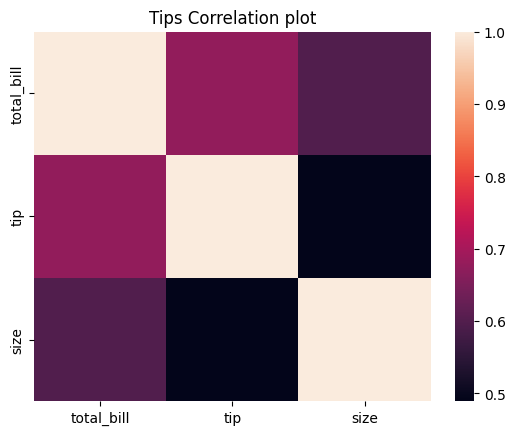

In [113]:
sns.heatmap(tips_corr_matrix)
plt.title('Tips Correlation plot')
plt.show()

### Plotting joint distributions (1)

There are numerous strategies to visualize how pairs of continuous random variables vary jointly. Regression and residual plots are one strategy. Another is to visualize a bivariate distribution.

Seaborn's `sns.jointplot()` provides means of visualizing bivariate distributions. The basic calling syntax is similar to that of `sns.lmplot()`. By default, calling `sns.jointplot(x, y, data)` renders a few things:

* A scatter plot using the specified columns `x` and `y` from the DataFrame `data`.
* A (univariate) histogram along the top of the scatter plot showing distribution of the column `x`.
* A (univariate) histogram along the right of the scatter plot showing distribution of the column `y`.

**Instructions**

* Use `sns.jointplot()` to visualize the joint variation of the columns `'hp'` (on the x-axis) and `'mpg'` (on the y-axis) from the DataFrame `auto`.

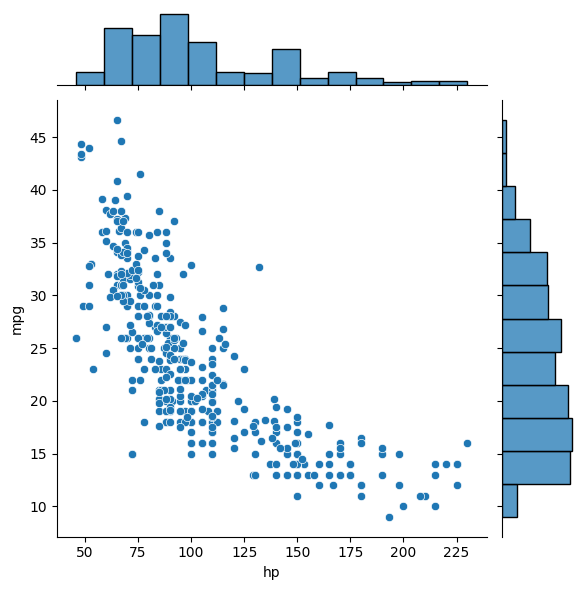

In [114]:
# Generate a joint plot of 'hp' and 'mpg'
sns.jointplot(x='hp', y='mpg', data=df_mpg)

# Display the plot
plt.show()

### Plotting joint distributions (2)

The seaborn function `sns.jointplot()` has a parameter `kind` to specify how to visualize the joint variation of two continuous random variables (i.e., two columns of a DataFrame)

 * `kind='scatter'` uses a scatter plot of the data points
 * `kind='reg'` uses a regression plot (default order 1)
 * `kind='resid'` uses a residual plot
 * `kind='kde'` uses a kernel density estimate of the joint distribution
 * `kind='hex'` uses a hexbin plot of the joint distribution

For this exercise, you will again use `sns.jointplot()` to display the joint distribution of the `hp` and `mpg` columns of the `auto` DataFrame. This time, you will use `kind='hex'` to generate a hexbin plot of the joint distribution.

**Instructions**

* Create a hexbin plot of the joint distribution between `'hp'` and `'mpg'`.

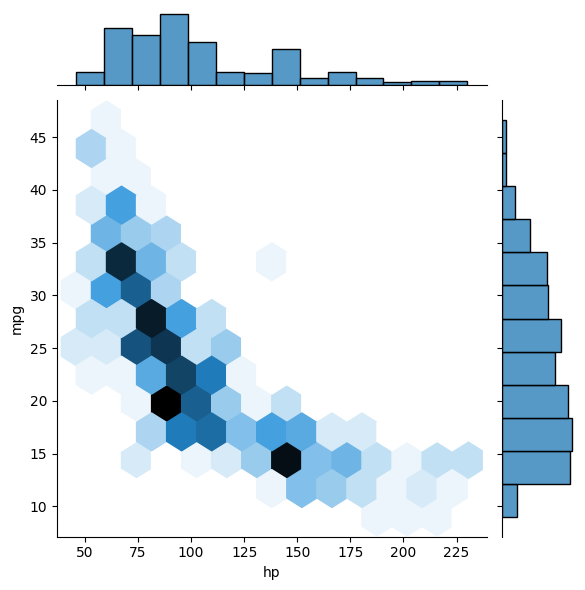

In [115]:
# Generate a joint plot of 'hp' and 'mpg' using a hexbin plot
sns.jointplot(x='hp', y='mpg', data=df_mpg, kind='hex')

# Display the plot
plt.show()

### Plotting distributions pairwise (1)

Data sets often contain more than two continuous variables. The function `sns.jointplot()` is restricted to representing joint variation between only two quantities (i.e., two columns of a DataFrame). Visualizing multivariate relationships is trickier.

The function `sns.pairplot()` constructs a grid of all joint plots pairwise from all pairs of (non-categorical) columns in a DataFrame. The syntax is very simple: `sns.pairplot(df)`, where `df` is a DataFrame. The non-categorical columns are identified and the corresponding joint plots are plotted in a square grid of subplots. The diagonal of the subplot grid shows the univariate histograms of the individual columns.

In this exercise, you will use a DataFrame `auto` comprising only three columns from the original auto-mpg data set.

**Instructions**

* Print the first five rows of the DataFrame `auto`. This is done for you.
* Plot the joint distributions between columns from the entire DataFrame `auto`.

In [116]:
# Print the first 5 rows of the DataFrame
df_mpg.head()

,mpg,cyl,displ,hp,weight,accel,yr,origin,name
0,18.0,8,307.0,130,3504,12.0,70,US,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,US,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,US,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,US,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,US,ford torino


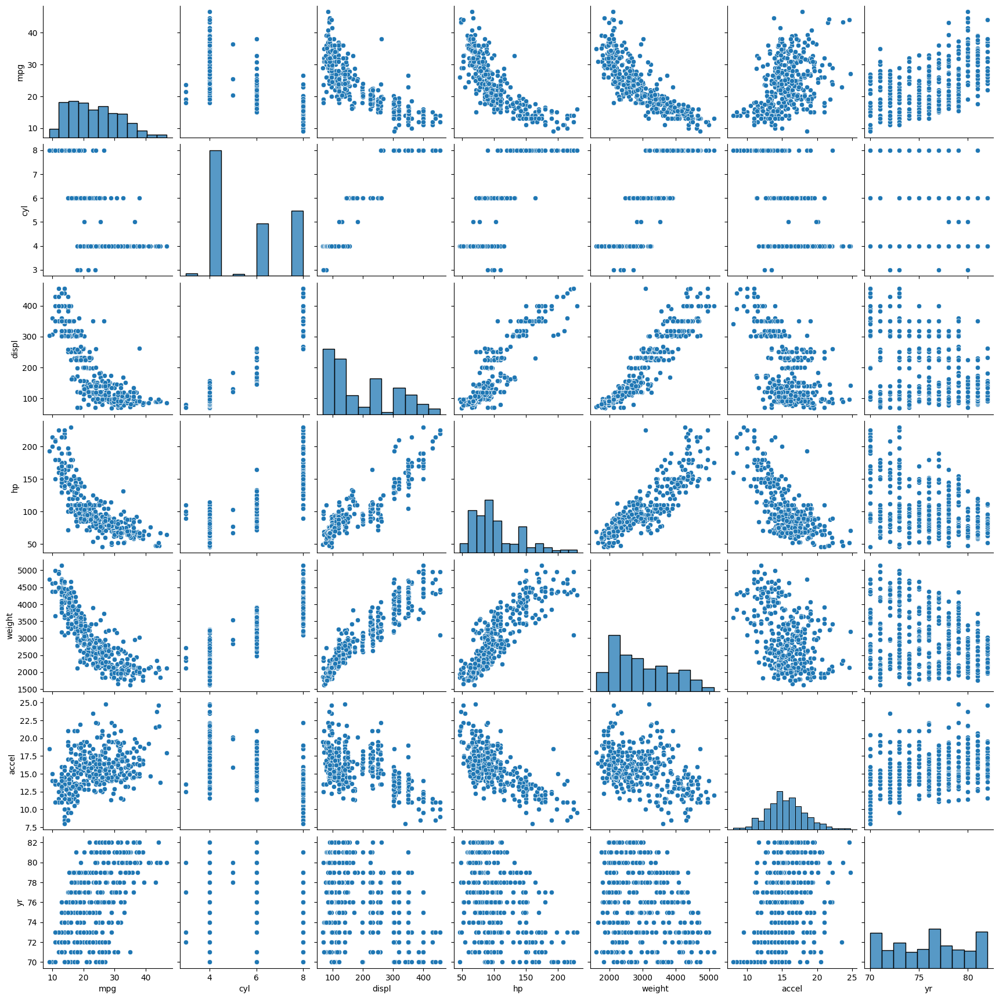

In [117]:
# Plot the pairwise joint distributions from the DataFrame 
sns.pairplot(df_mpg)

# Display the plot
plt.show()

**Seaborn's pairplots are an excellent way of visualizing the relationship between all continuous variables in a dataset.**

### Plotting distributions pairwise (2)

In this exercise, you will generate pairwise joint distributions again. This time, you will make two particular additions:

You will display regressions as well as scatter plots in the off-diagonal subplots. You will do this with the argument `kind='reg'` (where `'reg'` means 'regression'). Another option for `kind` is `'scatter'` (the default) that plots scatter plots in the off-diagonal subplots.
You will also visualize the joint distributions separated by continent of origin. You will do this with the keyword argument `hue` specifying the `'origin'`.

**Instructions**

* Plot the pairwise joint distributions separated by continent of origin and display the regressions.

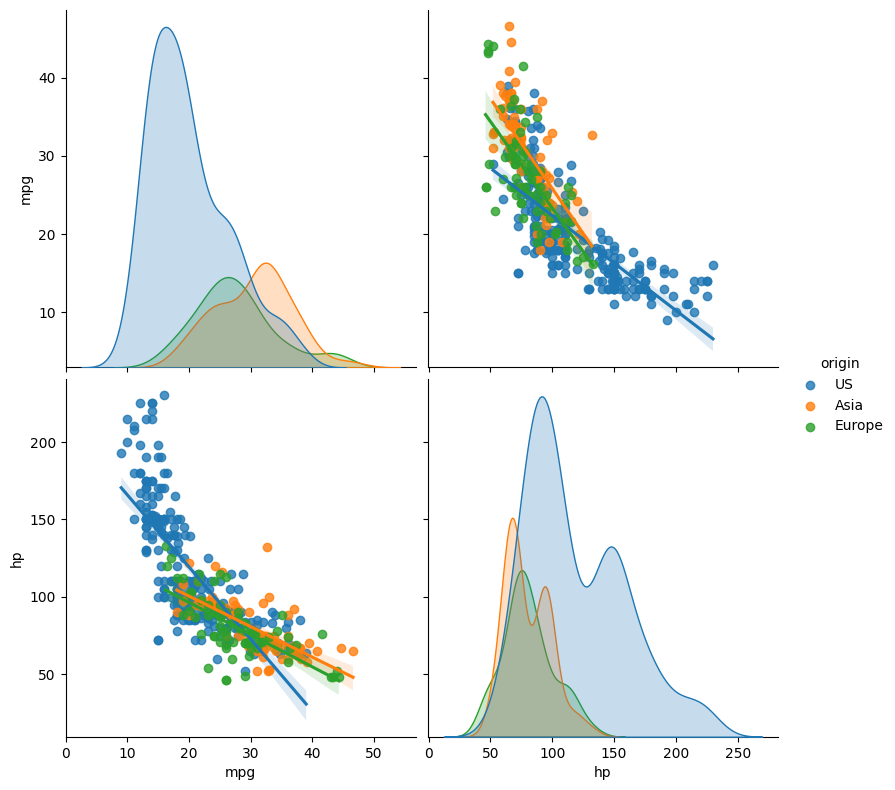

In [118]:
# Plot the pairwise joint distributions grouped by 'origin' along with regression lines
sns.pairplot(df_mpg[['mpg', 'hp', 'origin']], hue='origin', kind='reg', height=4, aspect=1)

# Display the plot
plt.show()

**Plots like this are why Seaborn is such a useful library: Using just one command, you're able to quickly extract a lot of valuable insight from a dataset.**

### Visualizing correlations with a heatmap

Plotting relationships between many variables using a pair plot can quickly get visually overwhelming. It is therefore often useful to compute covariances between the variables instead. The covariance matrix can then easily be visualized as a heatmap. A heatmap is effectively a pseudocolor plot with labelled rows and columns (i.e., a pseudocolor plot based on a pandas DataFrame rather than a matrix). The DataFrame does not have to be square or symmetric (but, in the context of a covariance matrix, it is both).

In this exercise, you will view the covariance matrix between the continuous variables in the auto-mpg dataset. You do not have to know here how the covariance matrix is computed; the important point is that its diagonal entries are all 1s, and the off-diagonal entries are between -1 and +1 (quantifying the degree to which variable pairs vary jointly). It is also, then, a symmetric matrix.

**Instructions**

* Print the correlation matrix `corr_matrix` to examine its contents and labels. This has been done for you.
* Plot the correlation matrix `corr_matrix` using `sns.heatmap()`.

In [119]:
corr_matrix = df_mpg.corr()
corr_matrix

,mpg,cyl,displ,hp,weight,accel,yr
mpg,1.000000,-0.777618,-0.805127,-0.778427,-0.832244,0.423329,0.580541
cyl,-0.777618,1.000000,0.950823,0.842983,0.897527,-0.504683,-0.345647
displ,-0.805127,0.950823,1.000000,0.897257,0.932994,-0.543800,-0.369855
hp,-0.778427,0.842983,0.897257,1.000000,0.864538,-0.689196,-0.416361
weight,-0.832244,0.897527,0.932994,0.864538,1.000000,-0.416839,-0.309120
accel,0.423329,-0.504683,-0.543800,-0.689196,-0.416839,1.000000,0.290316
yr,0.580541,-0.345647,-0.369855,-0.416361,-0.309120,0.290316,1.000000


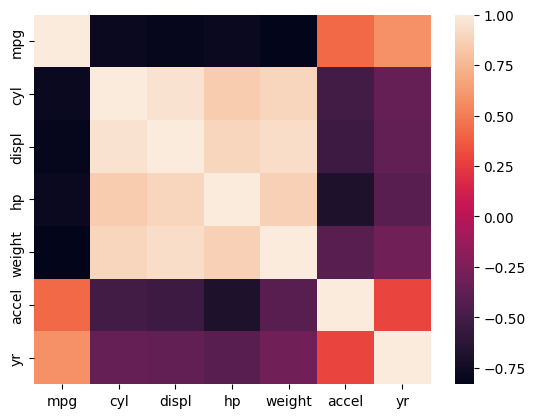

In [120]:
# Visualize the correlation matrix using a heatmap
sns.heatmap(corr_matrix)

# Display the heatmap
plt.show()

**If your pair plot starts to become visually overwhelming, heat maps are a great alternative.**

# Analyzing time series and images

This chapter ties together the skills gained so far through examining time series data and images. You'll customize plots of stock data, generate histograms of image pixel intensities, and enhance image contrast through histogram equalization.

## Visualizing Time Series

**Datetimes & Time Series**

In [121]:
print(type(df_weather))
print(type(df_weather.index))
df_weather.head()

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.indexes.datetimes.DatetimeIndex'>


,Temperature,DewPoint,Pressure
Date,,,
2010-01-01 00:00:00,46.2,37.5,1.0
2010-01-01 01:00:00,44.6,37.1,1.0
2010-01-01 02:00:00,44.1,36.9,1.0
2010-01-01 03:00:00,43.8,36.9,1.0
2010-01-01 04:00:00,43.5,36.8,1.0


**Plotting DataFrames**

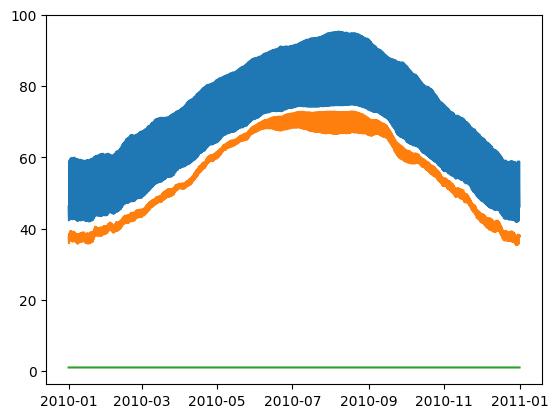

In [122]:
plt.plot(df_weather)
plt.show()

**Slicing Time Series**

In [123]:
temperature = df_weather['Temperature']
march_apr = temperature['2010-03':'2010-04']
print(march_apr.shape)
print(march_apr.iloc[-4:])

(1463,)
Date
2010-04-30 20:00:00    73.3
2010-04-30 21:00:00    71.3
2010-04-30 22:00:00    69.7
2010-04-30 23:00:00    68.5
Name: Temperature, dtype: float64


**Plotting Time Series Slices**

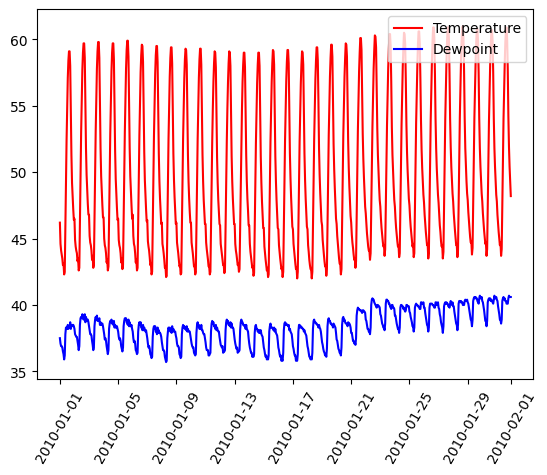

In [124]:
plt.plot(temperature['2010-01'], color='r', label='Temperature')
dew_point = df_weather['DewPoint']
plt.plot(dew_point['2010-01'], color='b', label='Dewpoint')
plt.legend(loc='upper right')
plt.xticks(rotation=60)
plt.show()

**Selecting & Formatting Dates**

In [125]:
jan = temperature['2010-01']
dates = jan.index[::96]
print(dates)
labels = dates.strftime('%b %d')
print(labels)

DatetimeIndex(['2010-01-01', '2010-01-05', '2010-01-09', '2010-01-13',
               '2010-01-17', '2010-01-21', '2010-01-25', '2010-01-29'],
              dtype='datetime64[ns]', name='Date', freq=None)
Index(['Jan 01', 'Jan 05', 'Jan 09', 'Jan 13', 'Jan 17', 'Jan 21', 'Jan 25',
       'Jan 29'],
      dtype='object', name='Date')


**Cleaning Up Ticks on Axis**

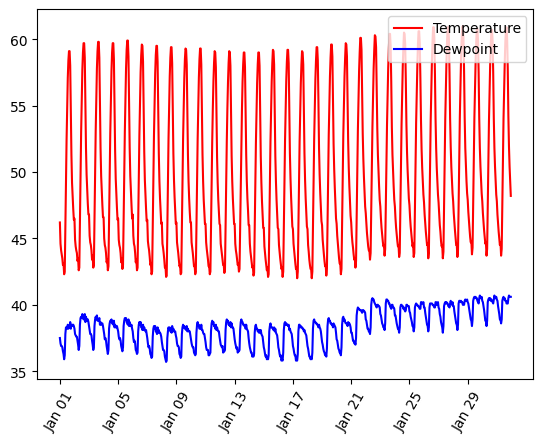

In [126]:
plt.plot(temperature['2010-01'], color='r', label='Temperature')
plt.plot(dew_point['2010-01'], color='b', label='Dewpoint')
plt.legend(loc='upper right')
plt.xticks(dates, labels, rotation=60)
plt.show()

### Multiple time series on common axes

For this exercise, you will construct a plot showing four time series stocks on the same axes. The time series in question are represented in the session using the identifiers `aapl`, `ibm`, `csco`, and `msft`. You'll generate a single plot showing all the time series on common axes with a legend.

**Instructions**

* Plot the `aapl` time series in blue with a label of` 'AAPL'`.
* Plot the `ibm` time series in green with a label of `'IBM'`.
* Plot the `csco` time series in red with a label of `'CSCO'`.
* Plot the `msft` time series in magenta with a label of `'MSFT'`.
* Specify a `rotation` of `60` for the xticks with `plt.xticks()`.
* Add a legend in the `'upper left'` corner of the plot.

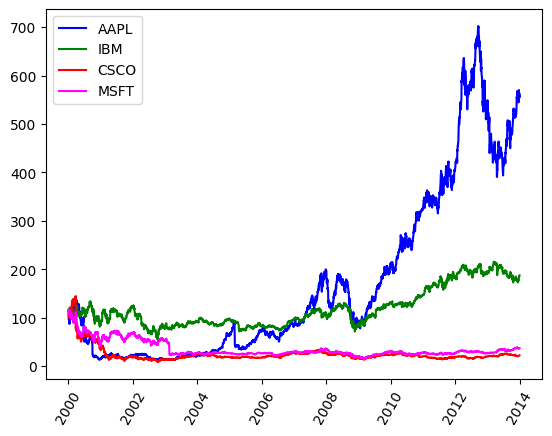

In [127]:
# Plot the aapl time series in blue
plt.plot(df_stocks['AAPL'], color='blue', label='AAPL')

# Plot the ibm time series in green
plt.plot(df_stocks['IBM'], color='green', label='IBM')

# Plot the csco time series in red
plt.plot(df_stocks['CSCO'], color='red', label='CSCO')

# Plot the msft time series in magenta
plt.plot(df_stocks['MSFT'], color='magenta', label='MSFT')

# Add a legend in the top left corner of the plot
plt.legend(loc='upper left')

# Specify the orientation of the xticks
plt.xticks(rotation=60)

# Display the plot
plt.show()

### Multiple time series slices (1)

You can easily slice subsets corresponding to different time intervals from a time series. In particular, you can use strings like `'2001:2005'`, `'2011-03:2011-12'`, or `'2010-04-19:2010-04-30'` to extract data from time intervals of length 5 years, 10 months, or 12 days respectively.

 * Unlike slicing from standard Python lists, tuples, and strings, when slicing time series by labels (and other pandas Series & DataFrames by labels), the slice includes the right-most portion of the slice. That is, extracting `my_time_series['1990':'1995']` extracts data from `my_time_series` corresponding to `1990`, `1991`, `1992`, `1993`, `1994`, and `1995` inclusive.
 * You can use partial strings or `datetime` objects for indexing and slicing from time series.

For this exercise, you will use time series slicing to plot the time series `aapl` over its full 11-year range and also over a shorter 2-year range. You'll arrange these plots in a **2 × 1** grid of subplots

**Instructions**

* Plot the series `aapl` in `'blue'` in the top subplot of a vertically-stacked pair of subplots, with the xticks rotated to 45 degrees.
* Extract a slice named `view` from the series `aapl` containing data from the years 2007 to 2008 (inclusive). This has been done for you.
* Plot the slice `view` in black in the bottom subplot.

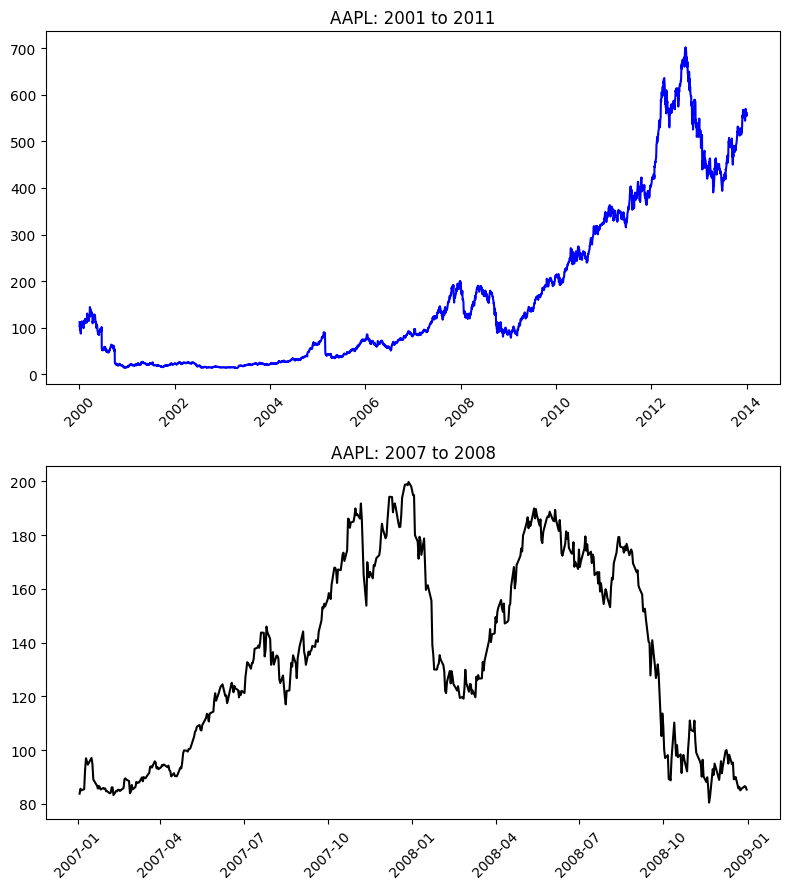

In [128]:
plt.figure(figsize=(8, 9))

# Plot the series in the top subplot in blue
plt.subplot(2,1,1)
plt.xticks(rotation=45)
plt.title('AAPL: 2001 to 2011')
plt.plot(df_stocks.AAPL, color='blue')

# Slice aapl from '2007' to '2008' inclusive: view
view = df_stocks.AAPL['2007':'2008']

# Plot the sliced data in the bottom subplot in black
plt.subplot(2,1,2)
plt.xticks(rotation=45)
plt.title('AAPL: 2007 to 2008')
plt.plot(view, color='black')
plt.tight_layout()
plt.show()

**Plotting time series at different intervals can provide you with deeper insight into your data. Here, for example, you can see that the `AAPL` stock price rose and fell a great amount between 2007 and 2008.**

### Multiple time series slices (2)

In this exercise, you will use the same time series `aapl` from the previous exercise and plot tighter views of the data.

 * Partial string indexing works without slicing as well. For instance, using `my_time_series['1995']`, `my_time_series['1999-05']`, and `my_time_series['2000-11-04']` respectively extracts views of the time series `my_time_series` corresponding to the entire year 1995, the entire month May 1999, and the entire day November 4, 2000.

**Instructions**

* Extract a slice named `view_1` from the series `aapl` containing data from November 2007 to April 2008 (inclusive). This has been done for you.
* Plot the slice `view_1` in `'red'` in the top subplot of a vertically-stacked pair of subplots with the xticks rotated to 45 degrees.
* Assign the slice `view_2` to contain data from the series `aapl` for January 2008. This has been done for you.
* Plot the slice `view_2` in `'green'` in the bottom subplot with the xticks rotated to 45 degrees.

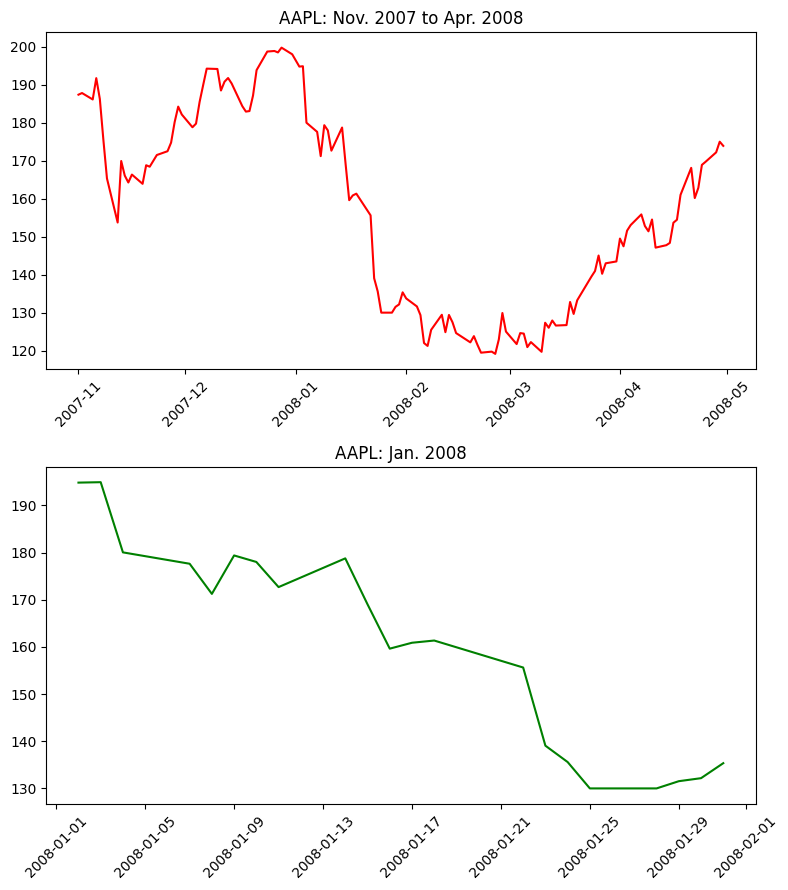

In [129]:
plt.figure(figsize=(8, 9))

# Slice aapl from Nov. 2007 to Apr. 2008 inclusive: view
view_1 = df_stocks.AAPL['2007-11':'2008-04']

# Plot the sliced series in the top subplot in red
plt.subplot(2, 1, 1)
plt.plot(view_1, color='red')
plt.title('AAPL: Nov. 2007 to Apr. 2008')
plt.xticks(rotation=45)

# Reassign the series by slicing the month January 2008
view_2 = df_stocks.AAPL['2008-01']

# Plot the sliced series in the bottom subplot in green
plt.subplot(2, 1, 2)
plt.plot(view_2, color='green')
plt.title('AAPL: Jan. 2008')
plt.xticks(rotation=45)

# Improve spacing and display the plot
plt.tight_layout()
plt.show()

### Plotting an inset view

Remember, rather than comparing plots with subplots or overlayed plots, you can generate an inset view directly using `plt.axes()`. In this exercise, you'll reproduce two of the time series plots from the preceding two exercises. Your figure will contain an inset plot to highlight the dramatic changes in AAPL stock price between November 2007 and April 2008 (as compared to the 11 years from 2001 to 2011).

**Instructions**

* Extract a slice of series `aapl` from November 2007 to April 2008 inclusive. This has been done for you.
* Plot the entire series `aapl`.
* Create a set of axes with lower left corner (0.25, 0.5), width 0.35, and height 0.35. Pass these four coordinates to `plt.axes()` as a list (all in units relative to the figure dimensions).
* Plot the sliced `view` in the current axes in `'red'`.

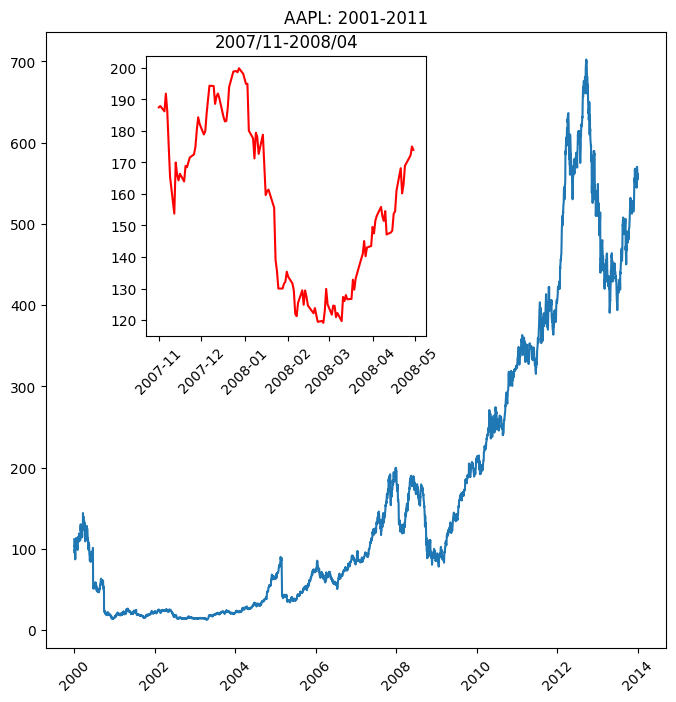

In [130]:
plt.figure(figsize=(8, 8))

# Slice aapl from Nov. 2007 to Apr. 2008 inclusive: view
view = df_stocks.AAPL['2007-11':'2008-04']

# Plot the entire series 
plt.plot(df_stocks.AAPL)
plt.xticks(rotation=45)
plt.title('AAPL: 2001-2011')

# Specify the axes
plt.axes([0.25, 0.5, 0.35, 0.35])

# Plot the sliced series in red using the current axes
plt.plot(view, color='red')
plt.xticks(rotation=45)
plt.title('2007/11-2008/04')
plt.show()

**Inset views are a useful way of comparing time series data.**

## Time Series With Moving Windows

**Hourly Data Over a Year**

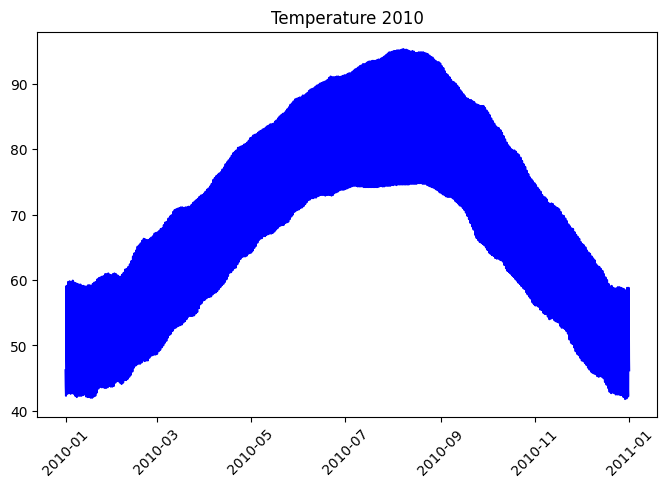

In [131]:
plt.figure(figsize=(8, 5))
plt.plot(df_weather.Temperature, color='blue')
plt.xticks(rotation=45)
plt.title('Temperature 2010')
plt.show()

**Zooming In**

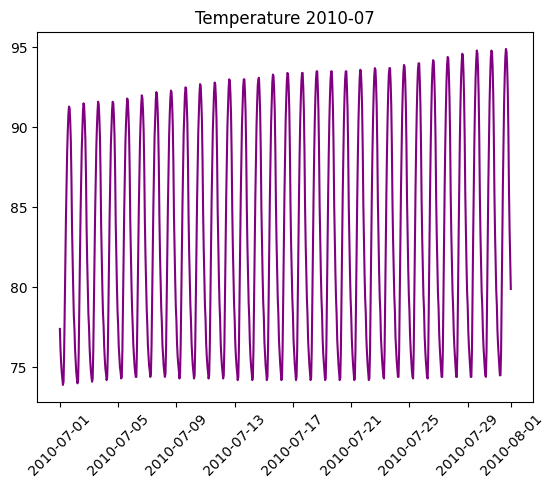

In [132]:
view = df_weather.Temperature['2010-07']
plt.plot(view, color='purple')
plt.xticks(rotation=45)
plt.title('Temperature 2010-07')
plt.show()

**Moving Averages**

In [133]:
smoothed = pd.DataFrame(df_weather['Temperature'].copy())
smoothed['14d'] = smoothed.iloc[:, 0].rolling(336).mean()
smoothed['1d'] = smoothed.iloc[:, 0].rolling(24).mean()
smoothed['3d'] = smoothed.iloc[:, 0].rolling(72).mean()
smoothed['7d'] = smoothed.iloc[:, 0].rolling(168).mean()
smoothed.head()

,Temperature,14d,1d,3d,7d
Date,,,,,
2010-01-01 00:00:00,46.2,NaN,NaN,NaN,NaN
2010-01-01 01:00:00,44.6,NaN,NaN,NaN,NaN
2010-01-01 02:00:00,44.1,NaN,NaN,NaN,NaN
2010-01-01 03:00:00,43.8,NaN,NaN,NaN,NaN
2010-01-01 04:00:00,43.5,NaN,NaN,NaN,NaN


**Viewing 24-Hour Averages**

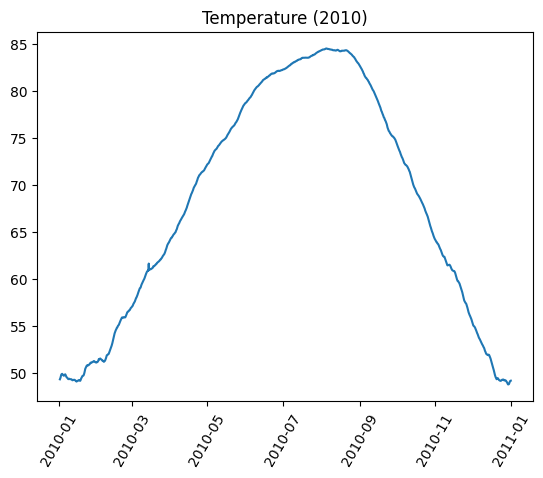

In [134]:
plt.plot(smoothed['1d']) # moving average over 24 hours
plt.title('Temperature (2010)')
plt.xticks(rotation=60)
plt.show()

**Viewing All Moving Averages**

/var/folders/sd/1vc_q83x5rn9jjrd0x47_cc00000gn/T/ipykernel_55256/2901440902.py:1: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  plt.plot(smoothed.iloc[:, 1:]['2010-01']) # plot DataFrame for January


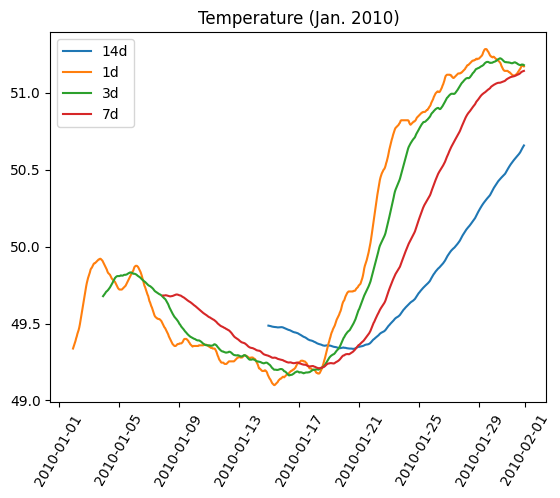

In [135]:
plt.plot(smoothed.iloc[:, 1:]['2010-01']) # plot DataFrame for January
plt.legend(smoothed.columns[1:])
plt.title('Temperature (Jan. 2010)')
plt.xticks(rotation=60)
plt.show()

**Moving Standard Deviations**

In [136]:
variances = pd.DataFrame(df_weather['Temperature'].copy())
variances['14d'] = variances.iloc[:, 0].rolling(336).std()
variances['1d'] = variances.iloc[:, 0].rolling(24).std()
variances['3d'] = variances.iloc[:, 0].rolling(72).std()
variances['7d'] = variances.iloc[:, 0].rolling(168).std()
variances.head()

,Temperature,14d,1d,3d,7d
Date,,,,,
2010-01-01 00:00:00,46.2,NaN,NaN,NaN,NaN
2010-01-01 01:00:00,44.6,NaN,NaN,NaN,NaN
2010-01-01 02:00:00,44.1,NaN,NaN,NaN,NaN
2010-01-01 03:00:00,43.8,NaN,NaN,NaN,NaN
2010-01-01 04:00:00,43.5,NaN,NaN,NaN,NaN


/var/folders/sd/1vc_q83x5rn9jjrd0x47_cc00000gn/T/ipykernel_55256/2990538653.py:2: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  plt.plot(variances.iloc[:, 1:]['2010-01']) # plot DataFrame for January


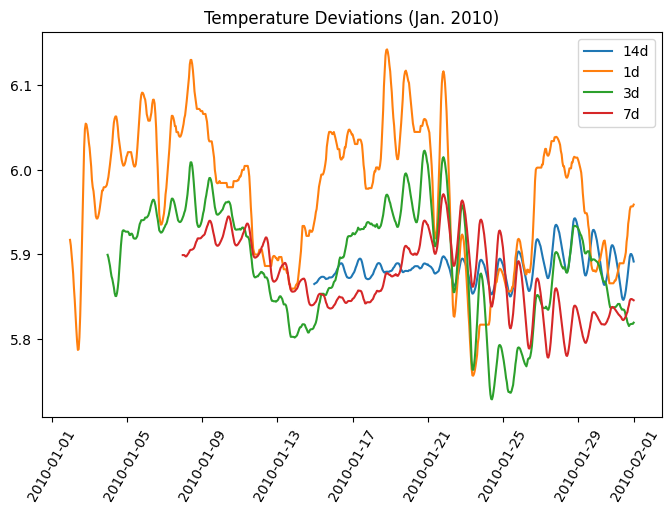

In [137]:
plt.figure(figsize=(8, 5))
plt.plot(variances.iloc[:, 1:]['2010-01']) # plot DataFrame for January
plt.legend(variances.columns[1:])
plt.title('Temperature Deviations (Jan. 2010)')
plt.xticks(rotation=60)
plt.show()

### Plotting moving averages

In this exercise, you will plot pre-computed moving averages of AAPL stock prices in distinct subplots.

 * The time series `aapl` is overlayed in black in each subplot for comparison.
 * The time series `mean_30`, `mean_75`, `mean_125`, and `mean_250` have been computed for you (containing the windowed averages of the series `aapl` computed over windows of width 30 days, 75 days, 125 days, and 250 days respectively).

**Instructions**

* In the top left subplot, plot the 30-day moving averages series `mean_30` in `'green'`.
* In the top right subplot, plot the 75-day moving averages series `mean_75` in `'red'`.
* In the bottom left subplot, plot the 125-day moving averages series `mean_125` in `'magenta'`.
* In the bottom right subplot, plot the 250-day moving averages series `mean_250` in `'cyan'`.

In [138]:
mean_30 = df_stocks['AAPL'].rolling(30).mean()
mean_75 = df_stocks['AAPL'].rolling(75).mean()
mean_125 = df_stocks['AAPL'].rolling(125).mean()
mean_250 = df_stocks['AAPL'].rolling(250).mean()

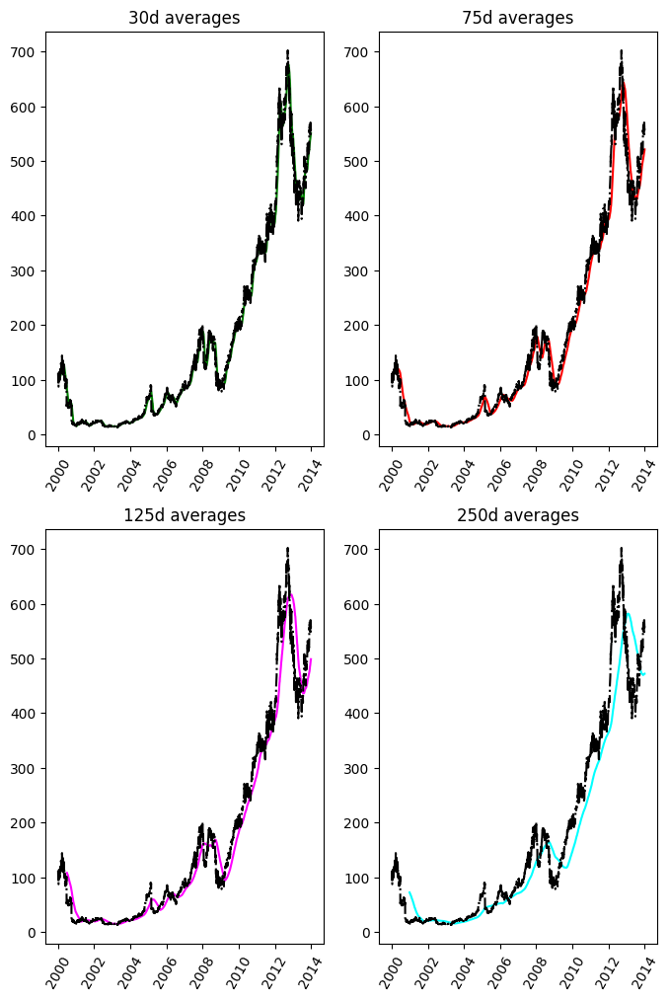

In [139]:
plt.figure(figsize=(8, 12))

# Plot the 30-day moving average in the top left subplot in green
plt.subplot(2, 2, 1)
plt.plot(mean_30, color='green')
plt.plot(df_stocks.AAPL, 'k-.')
plt.xticks(rotation=60)
plt.title('30d averages')

# Plot the 75-day moving average in the top right subplot in red
plt.subplot(2, 2, 2)
plt.plot(mean_75, color='red')
plt.plot(df_stocks.AAPL, 'k-.')
plt.xticks(rotation=60)
plt.title('75d averages')

# Plot the 125-day moving average in the bottom left subplot in magenta
plt.subplot(2, 2, 3)
plt.plot(mean_125, color='magenta')
plt.plot(df_stocks.AAPL, 'k-.')
plt.xticks(rotation=60)
plt.title('125d averages')

# Plot the 250-day moving average in the bottom right subplot in cyan
plt.subplot(2, 2, 4)
plt.plot(mean_250, color='cyan')
plt.plot(df_stocks.AAPL, 'k-.')
plt.xticks(rotation=60)
plt.title('250d averages')

# Display the plot
plt.show()

### Plotting moving standard deviations

Having plotted pre-computed moving averages of AAPL stock prices on distinct subplots in the previous exercise, you will now plot pre-computed moving _standard deviations_ of the same stock prices, this time together on common axes.

 * The time series `aapl` is not plotted in this case; it is of a different length scale than the standard deviations.
 * The time series `std_30`, `std_75`, `std_125`, & `std_250` have been computed for you (containing the windowed standard deviations of the series `apl` computed over windows of width 30 days, 75 days, 125 days, & 250 days respectively).

**Instructions**

* Produce a single plot with four curves overlayed:
 * the series `std_30` in `'red'` (with corresponding label `'30d'`).
 * the series `std_75` in `'cyan'` (with corresponding label `'75d'`).
 * the series `std_125` in `'green'` (with corresponding label `'125d'`).
 * the series `std_250` in `'magenta'` (with corresponding label `'250d'`).
* Add a legend to the `'upper left'` corner of the plot.

In [140]:
std_30 = df_stocks['AAPL'].rolling(30).std()
std_75 = df_stocks['AAPL'].rolling(75).std()
std_125 = df_stocks['AAPL'].rolling(125).std()
std_250 = df_stocks['AAPL'].rolling(250).std()

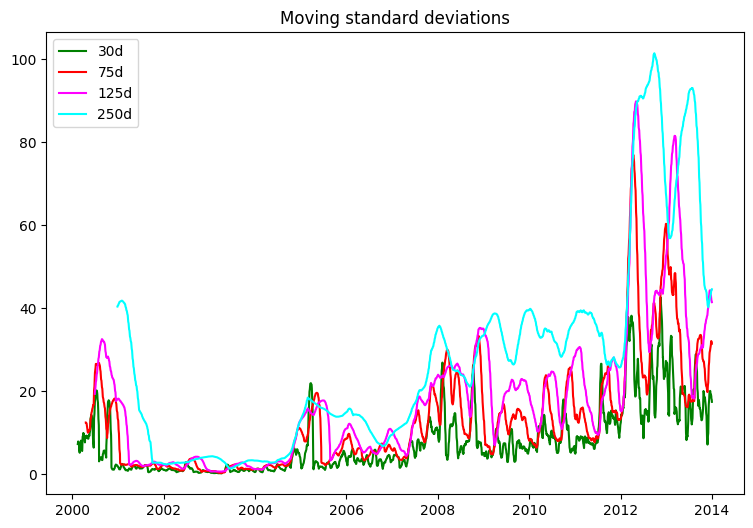

In [141]:
plt.figure(figsize=(9, 6))

# Plot std_30 in red
plt.plot(std_30, color='green', label='30d')

# Plot std_75 in cyan
plt.plot(std_75, color='red', label='75d')

# Plot std_125 in green
plt.plot(std_125, color='magenta', label='125d')

# Plot std_250 in magenta
plt.plot(std_250, color='cyan', label='250d')

# Add a legend to the upper left
plt.legend(loc='upper left')

# Add a title
plt.title('Moving standard deviations')

# Display the plot
plt.show()

### Interpreting moving statistics

From the previous plot of moving standard deviations, what length is the moving window that most consistently produces the greatest variance (standard deviation) in the `AAPL` stock price over the time interval shown?

**Instructions**

* ~~30 days~~
* ~~75 days~~
* ~~125 days~~
* **250 days**

**Wider moving windows admit greater variability!**

## Histogram Equalization In Images


**Original Low Contrast Mars Surface Image**

![low contrast mars surface][1]


I found the image at [Planetary Science Short Course][2].

* This is a Mars Odyssey THEMIS infrared image mosaic of an area of Mars at 13 degrees south, 215 degrees east. Cratered highlands to the west are part of Terra Sirenum, and the plains to the west are Daedalia Planum. The image is about 600 km across (long dimension).
* [Matplotlib Image Tutorial][3]


  [1]: https://raw.githubusercontent.com/trenton3983/DataCamp/master/Images/intro_to_data_visualization_in_python/4_3_low_contrast_mars_surface.JPG
  [2]: https://instruct.uwo.ca/geog/3241/short-course-1.htm
  [3]: https://matplotlib.org/3.1.1/tutorials/introductory/images.html

**Image File**

In [142]:
lunar_image_path = Path('images/4_3_low_contrast_mars_surface.JPG')

**Image Histograms**

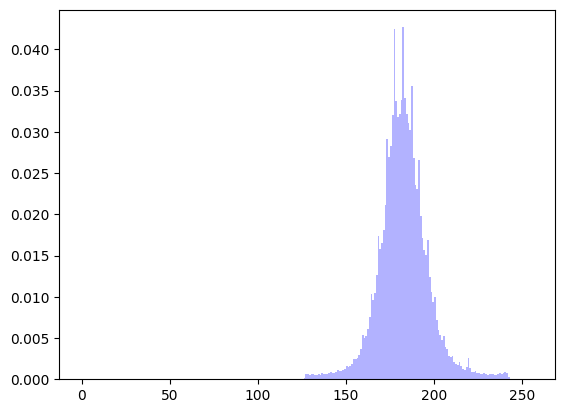

125 244


In [143]:
orig = plt.imread(lunar_image_path)
pixels = orig.flatten()
plt.hist(pixels, bins=256, range=(0,256), density=True, color='blue', alpha=0.3)
plt.show()
minval, maxval = orig.min(), orig.max()
print(minval, maxval)

**Rescaling the Image**

125 244
0.0 256.0


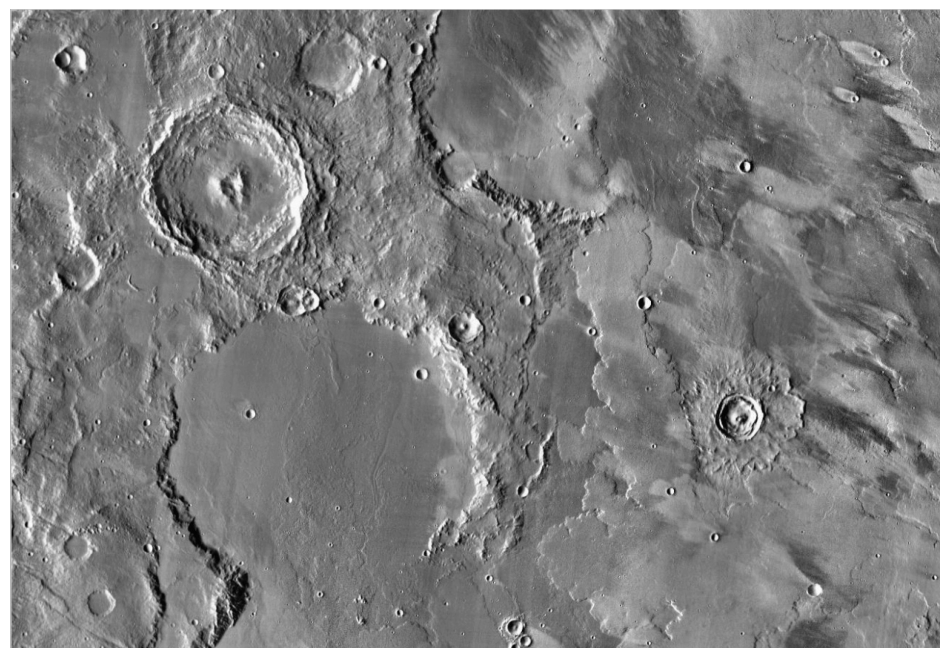

In [144]:
plt.figure(figsize=(12, 12))

minval, maxval = orig.min(), orig.max()
print(minval, maxval)

# this is the equation from section 2.4.4
rescaled = 256*(orig - minval) / (maxval - minval)
# the rescaled equation from the slides is not correct
# rescaled = (255/(maxval-minval)) * (pixels - minval) # original equation
print(rescaled.min(), rescaled.max())

plt.imshow(rescaled, cmap='gray')
plt.axis('off')
plt.show()

**Original & Rescaled Histograms**

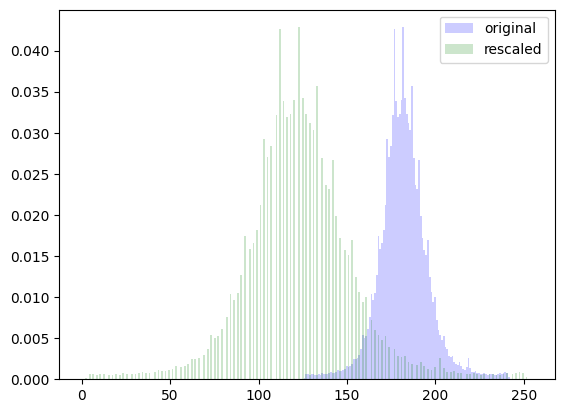

In [145]:
plt.hist(pixels, bins=256, range=(0,255), density=True, color='blue', alpha=0.2)
plt.hist(rescaled.flatten(), bins=256, range=(0,255), density=True, color='green', alpha=0.2)
plt.legend(['original', 'rescaled'])
plt.show()

**Image Histogram & CDF**

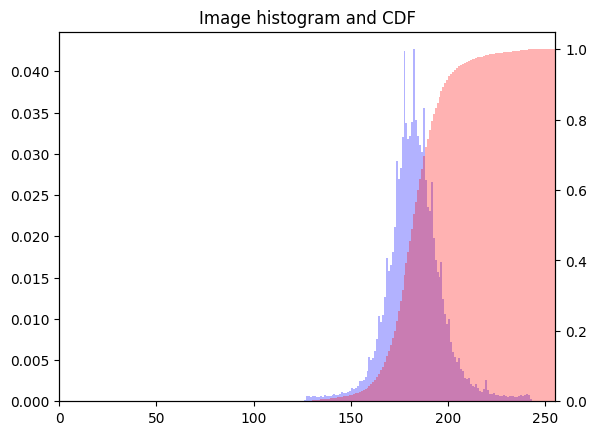

In [146]:
plt.hist(pixels, bins=256, range=(0,256), density=True, color='blue', alpha=0.3)
plt.twinx()
orig_cdf, bins, patches = plt.hist(pixels, cumulative=True, bins=256, range=(0,256), density=True, color='red', alpha=0.3)
plt.title('Image histogram and CDF')
plt.xlim((0, 255))
plt.show()

**Equalizing Intensity Values**

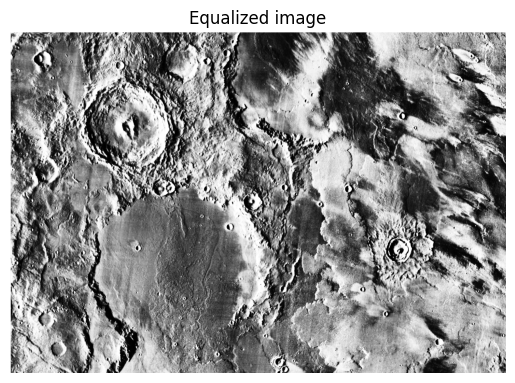

In [147]:
new_pixels = np.interp(pixels, bins[:-1], orig_cdf*255)
new = new_pixels.reshape(orig.shape)
plt.imshow(new, cmap='gray')
plt.axis('off')
plt.title('Equalized image')
plt.show()

**Equalized Histogram & CDF**

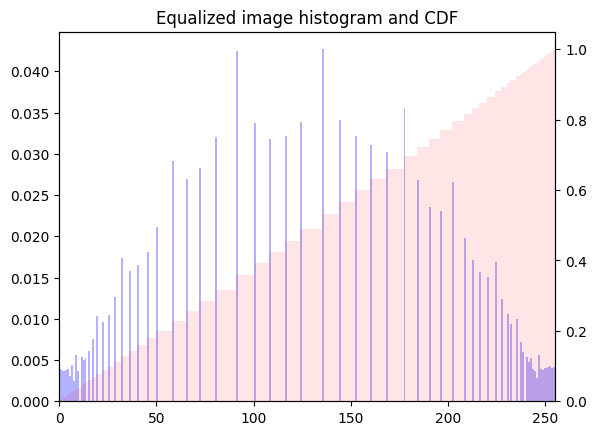

In [148]:
plt.hist(new_pixels, bins=256, range=(0,256), density=True, color='blue', alpha=0.3)
plt.twinx()
plt.hist(new_pixels, cumulative=True, bins=256, range=(0,256), density=True, color='red', alpha=0.1)
plt.title('Equalized image histogram and CDF')
plt.xlim((0, 255))
plt.show()

### Extracting a histogram from a grayscale image

For grayscale images, various image processing algorithms use an image histogram. Recall that an image is a two-dimensional array of numerical intensities. An image histogram, then, is computed by counting the occurences of distinct pixel intensities over all the pixels in the image.

For this exercise, you will load [an unequalized low contrast image of Hawkes Bay, New Zealand][1] (originally by Phillip Capper, modified by User:Konstable, via Wikimedia Commons, CC BY 2.0). You will plot the image and use the pixel intensity values to plot a normalized histogram of pixel intensities.

**Instructions**

* Load data from the file `'640px-Unequalized_Hawkes_Bay_NZ.jpg'` into an array.
* Display `image` with a color map of `'gray'` in the top subplot.
* Flatten `image` into a 1-D array using the `.flatten()` method.
* Display a histogram of `pixels` in the bottom subplot.
 * Use histogram options `bins=64`, `range=(0,256)`, and `normed=True` to control numerical binning and the vertical scale.
 * Use plotting options `color='red'` and `alpha=0.4` to tailor the color and transparency.

  [1]: https://commons.wikimedia.org/wiki/File:Unequalized_Hawkes_Bay_NZ.jpg

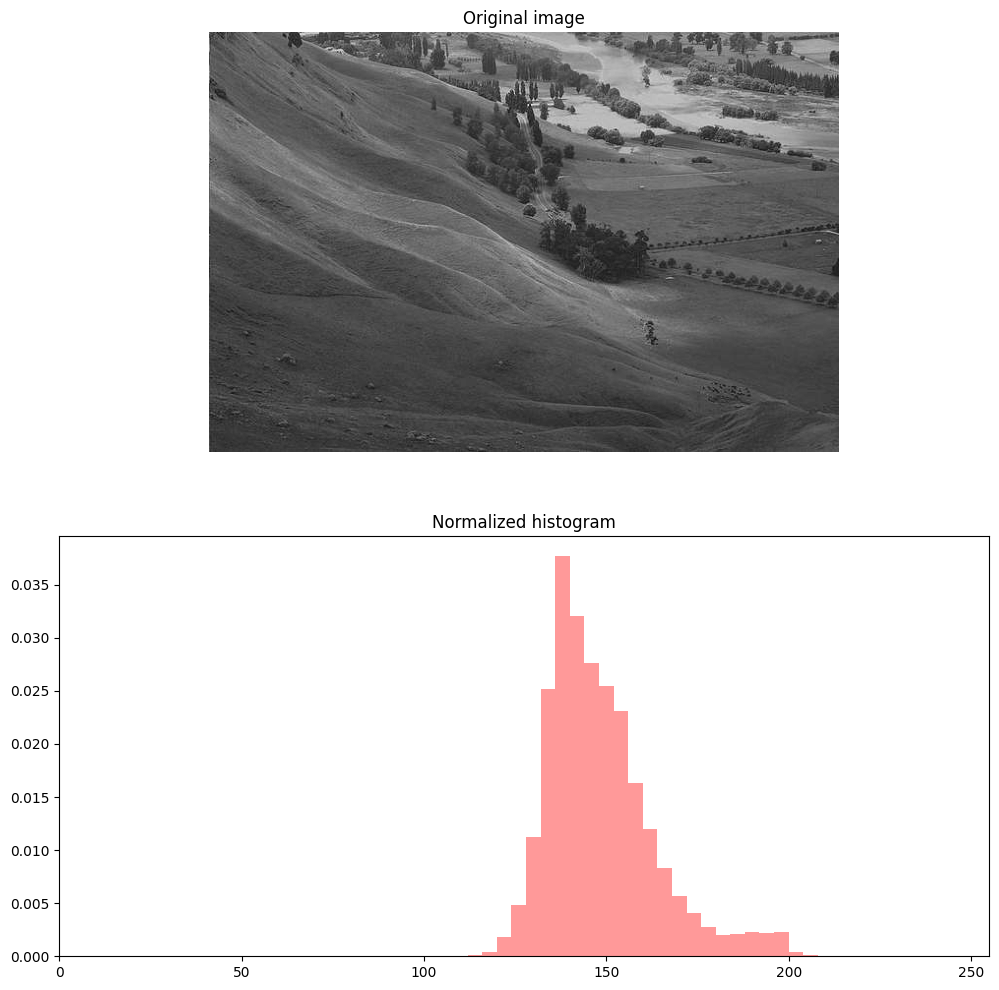

In [149]:
plt.figure(figsize=(12, 12))

# Load the image into an array: image
image = plt.imread(dir_path_hawk)  # path is from section 2.4.4

# Display image in top subplot using color map 'gray'
plt.subplot(2,1,1)
plt.title('Original image')
plt.axis('off')
plt.imshow(image, cmap='gray')

# Flatten the image into 1 dimension: pixels
pixels = image.flatten()

# Display a histogram of the pixels in the bottom subplot
plt.subplot(2,1,2)
plt.xlim((0,255))
plt.title('Normalized histogram')
plt.hist(pixels, bins=64, range=(0,256), density=True, color='red', alpha=0.4)

# Display the plot
plt.show()

**Image histograms are an important component of many image processing algorithms.**

### Cumulative Distribution Function from an image histogram

A histogram of a continuous random variable is sometimes called a _[Probability Distribution Function][1]_ (or PDF). The area under a PDF (a definite integral) is called a _[Cumulative Distribution Function][2]_ (or CDF). The CDF quantifies the probability of observing certain pixel intensities.

 * Additional information about CDF and ECDF can be found at [Plotting all of your data: Empirical cumulative distribution functions][4].

Your task here is to plot the PDF and CDF of pixel intensities from a grayscale image. You will use the [grayscale image of Hawkes Bay, New Zealand][3] (originally by Phillip Capper, modified by User:Konstable, via Wikimedia Commons, CC BY 2.0). This time, the 2D array image will be pre-loaded and pre-flattened into the 1D array pixels for you.

 * The histogram option `cumulative=True` permits viewing the CDF instead of the PDF.
 * Notice that `plt.grid('off')` switches off distracting grid lines.
 * The command `plt.twinx()` allows two plots to be overlayed sharing the x-axis but with different scales on the y-axis.

**Instructions**

* First, use `plt.hist()` to plot the histogram of the 1-D array `pixels` in the bottom subplot.
* Use the histogram options `bins=64`, `range=(0,256)`, and `normed=False`.
* Use the plotting options `alpha=0.4` and `color='red'` to make the overlayed plots easier to see.
* Second, use `plt.twinx()` to overlay plots with different vertical scales on a common horizontal axis.
* Third, call `plt.hist()` again to overlay the CDF in the bottom subplot.
* Use the histogram options `bins=64`, `range=(0,256)`, and `normed=True`.
* This time, also use `cumulative=True` to compute and display the CDF.
* Also, use `alpha=0.4` and `color='blue'` to make the overlayed plots easier to see.

  [1]: https://en.wikipedia.org/wiki/Probability_density_function
  [2]: https://en.wikipedia.org/wiki/Cumulative_distribution_function
  [3]: https://commons.wikimedia.org/wiki/File:Unequalized_Hawkes_Bay_NZ.jpg
  [4]: https://trenton3983.github.io/files/projects/2019-07-10_statistical_thinking_1/2019-07-10_statistical_thinking_1.html#Plotting-all-of-your-data:-Empirical-cumulative-distribution-functions

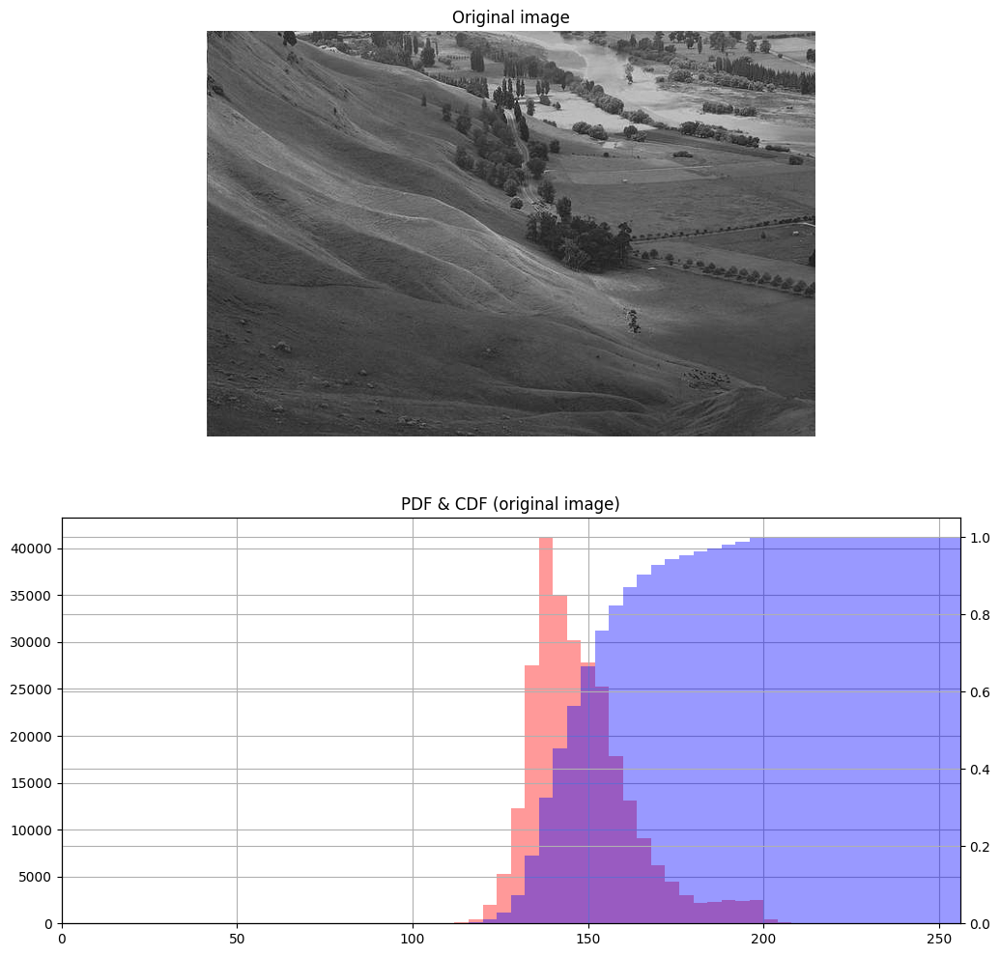

In [150]:
plt.figure(figsize=(12, 12))

# Load the image into an array: image
image = plt.imread(dir_path_hawk)

# Display image in top subplot using color map 'gray'
plt.subplot(2,1,1)
plt.imshow(image, cmap='gray')
plt.title('Original image')
plt.axis('off')

# Flatten the image into 1 dimension: pixels
pixels = image.flatten()

# Display a histogram of the pixels in the bottom subplot
plt.subplot(2,1,2)
pdf = plt.hist(pixels, bins=64, range=(0,256), density=False, color='red', alpha=0.4)
plt.grid('off')

# Use plt.twinx() to overlay the CDF in the bottom subplot
plt.twinx()

# Display a cumulative histogram of the pixels
cdf = plt.hist(pixels, bins=64, range=(0,256), cumulative=True, density=True, color='blue', alpha=0.4)
               
# Specify x-axis range, hide axes, add title and display plot
plt.xlim((0,256))
plt.grid('off')
plt.title('PDF & CDF (original image)')
plt.show()

**Notice that the histogram is not well centered over the range of possible pixel intensities. The CDF rises sharply near the middle (that relates to the overall grayness of the image).**

### Equalizing an image histogram

_[Histogram equalization][1]_ is an image processing procedure that reassigns image pixel intensities. The basic idea is to use interpolation to map the original CDF of pixel intensities to a CDF that is almost a straight line. In essence, the pixel intensities are spread out and this has the practical effect of making a sharper, contrast-enhanced image. This is particularly useful in astronomy and medical imaging to help us see more features.

For this exercise, you will again work with the [grayscale image of Hawkes Bay, New Zealand][2] (originally by Phillip Capper, modified by User:Konstable, via Wikimedia Commons, CC BY 2.0). Notice the sample code produces the same plot as the previous exercise. Your task is to modify the code from the previous exercise to plot the new equalized image as well as its PDF and CDF.

 * The arrays `image` and `pixels` are extracted for you in advance.
 * The CDF of the original image is computed using `plt.hist()`.
 * Notice an array `new_pixels` is created for you that interpolates new pixel values using the original image CDF.

**Instructions 1/2**

* Plot the new equalized image.
* Use the NumPy array method `.reshape()` to create a 2-D array `new_image` from the 1-D array `new_pixels`.
 * The resulting `new_image` should have the same shape as `image.shape`, which can be accomplished by passing this as the argument to `.reshape()`.
* Display `new_image` with a `'gray'` color map to display the sharper, equalized image.

  [1]: https://en.wikipedia.org/wiki/Histogram_equalization
  [2]: https://commons.wikimedia.org/wiki/File:Unequalized_Hawkes_Bay_NZ.jpg

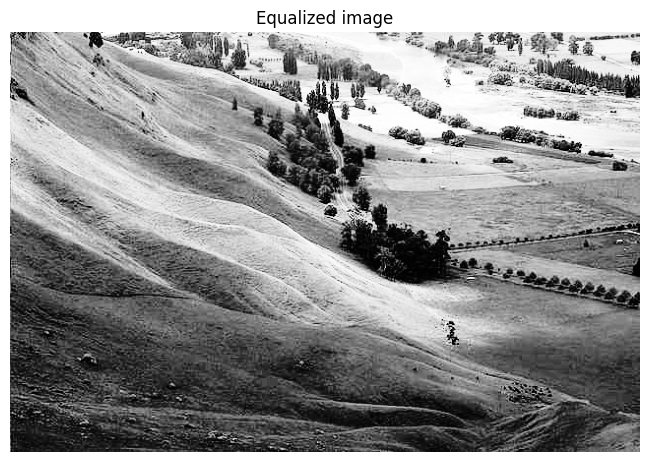

In [151]:
plt.figure(figsize=(12, 12))

# Load the image into an array: image
image = plt.imread(dir_path_hawk)

# Flatten the image into 1 dimension: pixels
pixels = image.flatten()

# Generate a cumulative histogram
cdf, bins, patches = plt.hist(pixels, bins=256, range=(0,256), density=True, cumulative=True)
new_pixels = np.interp(pixels, bins[:-1], cdf*255)

# Reshape new_pixels as a 2-D array: new_image
new_image = new_pixels.reshape(image.shape)

# Display the new image with 'gray' color map
plt.subplot(2,1,1)
plt.title('Equalized image')
plt.axis('off')
plt.imshow(new_image, cmap='gray')
plt.show()

**Instructions 2/2**

* Plot the new equalized image's PDF and CDF.
 * Plot the PDF of `new_pixels` in `'red'`.
 * Use `plt.twinx()` to overlay plots with different vertical scales on a common horizontal axis.
 * Plot the CDF of `new_pixels` in `'blue'`.

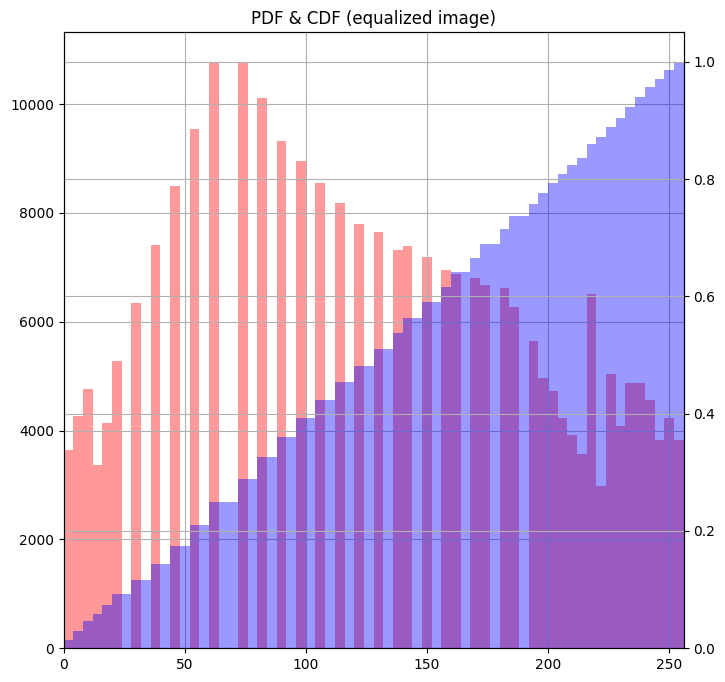

In [152]:
plt.figure(figsize=(8, 8))

pdf = plt.hist(new_pixels, bins=64, range=(0,256), density=False, color='red', alpha=0.4)
plt.grid('off')

# Use plt.twinx() to overlay the CDF in the bottom subplot
plt.twinx()
plt.xlim((0,256))
plt.grid('off')

# Add title
plt.title('PDF & CDF (equalized image)')

# Generate a cumulative histogram of the new pixels
cdf = plt.hist(new_pixels, bins=64, range=(0,256), cumulative=True, density=True, color='blue', alpha=0.4)
plt.show()

**Histogram equalization can help make an image sharper.**

### Extracting histograms from a color image

This exercise resembles the last in that you will plot histograms from an image. This time, you will use [a color image of the Helix Nebula as seen by the Hubble and the Cerro Toledo Inter-American Observatory][1]. The separate RGB (red-green-blue) channels will be extracted for you as two-dimensional arrays `red`, `green`, and `blue` respectively. You will plot three overlaid color histograms on common axes (one for each channel) in a subplot as well as the original image in a separate subplot.

**Instructions**

* Display `image` in the top subplot of a **2 × 1** subplot grid. Don't use a colormap here.
* Flatten the 2-D arrays `red`, `green`, and `blue` into 1-D arrays.
* Display three histograms in the bottom subplot: one for `red_pixels`, one for `green_pixels`, and one for `blue_pixels`. For each, use 64 bins and specify a translucency of `alpha=0.2`.

  [1]: http://imgsrc.hubblesite.org/hu/db/images/hs-2004-32-b-small_web.jpg

In [180]:
helix_dir_path = 'images/ps09_display-helix.jpg'


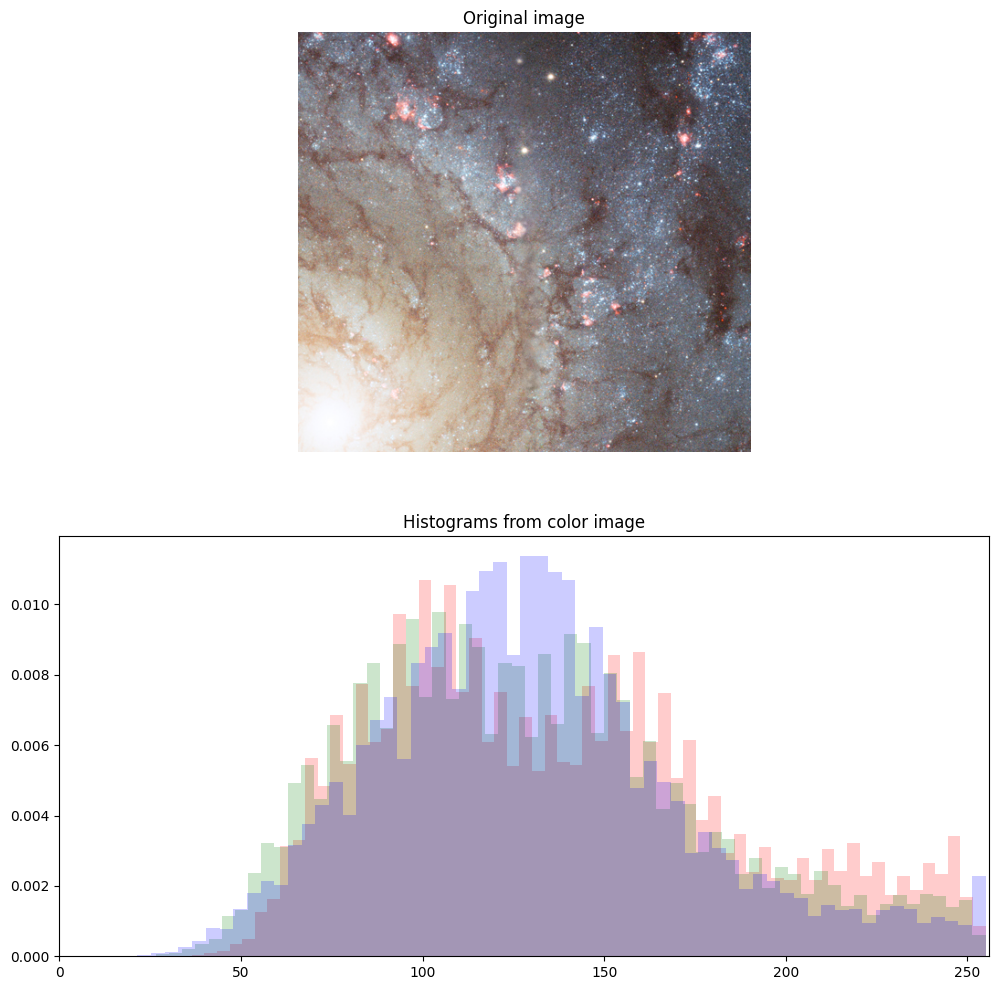

In [189]:
plt.figure(figsize=(12, 12))

# Load the image into an array: image
image = plt.imread(helix_dir_path)

# crop image
image = image[100:560, 368:864, :]

# Display image in top subplot
plt.subplot(2,1,1)
plt.title('Original image')
plt.axis('off')
plt.imshow(image)

# Extract 2-D arrays of the RGB channels: red, green, blue
red, green, blue = image[:,:,0], image[:,:,1], image[:,:,2]

# Flatten the 2-D arrays of the RGB channels into 1-D
red_pixels = red.flatten()
green_pixels = green.flatten()
blue_pixels = blue.flatten()

# Overlay histograms of the pixels of each color in the bottom subplot
plt.subplot(2, 1, 2)
plt.title('Histograms from color image')
plt.xlim((0, 256))
plt.hist(red_pixels, bins=64, density=True, color='red', alpha=0.2)
plt.hist(green_pixels, bins=64, density=True, color='green', alpha=0.2)
plt.hist(blue_pixels, bins=64, density=True, color='blue', alpha=0.2)

# Display the plot
plt.show()

* **Notice how the histogram generated from this color image differs from the histogram generated earlier from a grayscale image.**

### Extracting bivariate histograms from a color image

Rather than overlaying univariate histograms of intensities in distinct channels, it is also possible to view the joint variation of pixel intensity in two different channels.

For this final exercise, you will use the same [color image of the Helix Nebula as seen by the Hubble and the Cerro Tololo Inter-American Observatory][1]. The separate RGB (red-green-blue) channels will be extracted for you as one-dimensional arrays `red_pixels`, `green_pixels`, & `blue_pixels` respectively.

**Instructions**

* Make a 2-D histogram (not a regular histogram) in the top left subplot showing the joint variation of `red_pixels` (on the x-axis) and `green_pixels` (on the y-axis). Use `bins=(32,32)` to control binning.
* Make another 2-D histogram in the top right subplot showing the joint variation of `green_pixels` (on the x-axis) and `blue_pixels` (on the y-axis). Use `bins=(32,32)` to control binning.
* Make another 2-D histogram in the bottom left subplot showing the joint variation of `blue_pixels` (on the x-axis) and `red_pixels` (on the y-axis). Use `bins=(32,32)` to control binning.

  [1]: http://imgsrc.hubblesite.org/hu/db/images/hs-2004-32-b-small_web.jpg

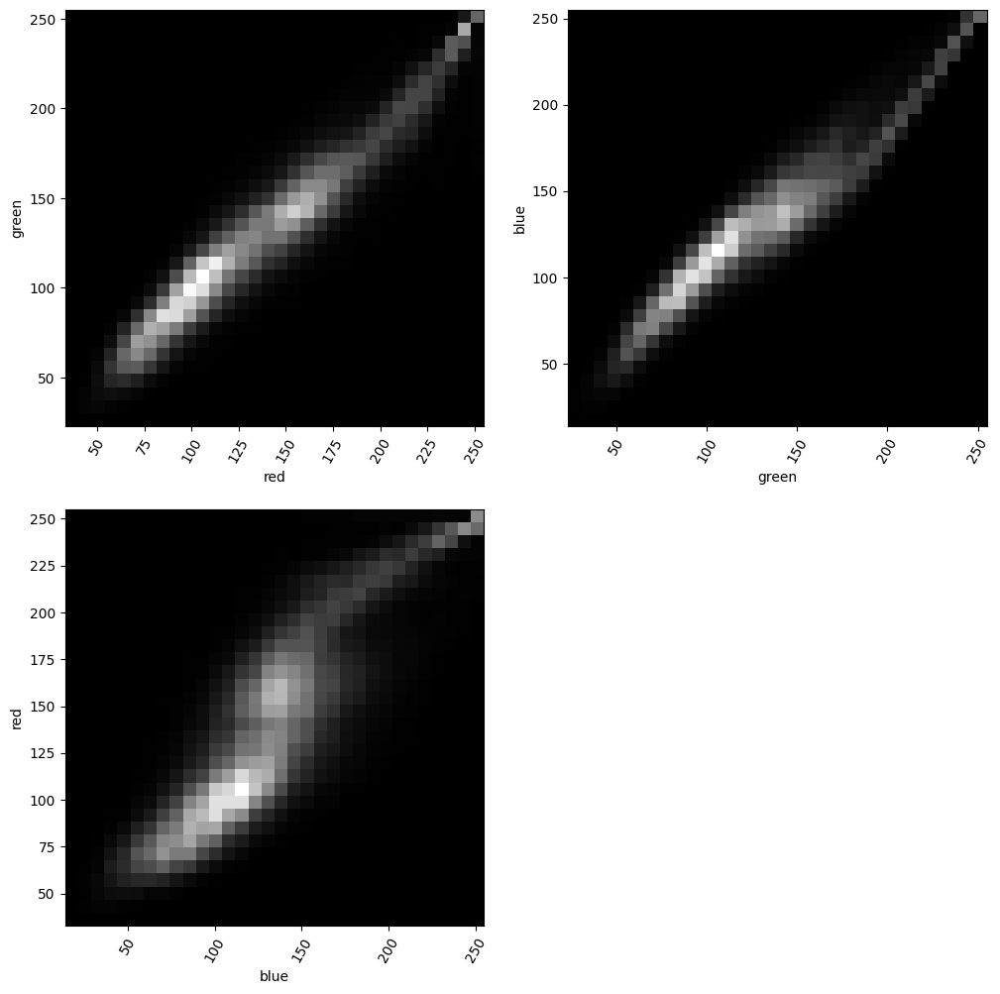

In [191]:
plt.figure(figsize=(12, 12))

# Load the image into an array: image
image = plt.imread(helix_dir_path)

# crop image
image = image[100:560, 368:864, :]

# Extract RGB channels and flatten into 1-D array
red, green, blue = image[:,:,0], image[:,:,1], image[:,:,2]
red_pixels = red.flatten()
green_pixels = green.flatten()
blue_pixels = blue.flatten()

# Generate a 2-D histogram of the red and green pixels
plt.subplot(2,2,1)
plt.grid('off') 
plt.xticks(rotation=60)
plt.xlabel('red')
plt.ylabel('green')
plt.hist2d(red_pixels, green_pixels, bins=(32, 32))

# Generate a 2-D histogram of the green and blue pixels
plt.subplot(2,2,2)
plt.grid('off')
plt.xticks(rotation=60)
plt.xlabel('green')
plt.ylabel('blue')
plt.hist2d(green_pixels, blue_pixels, bins=(32, 32))

# Generate a 2-D histogram of the blue and red pixels
plt.subplot(2,2,3)
plt.grid('off')
plt.xticks(rotation=60)
plt.xlabel('blue')
plt.ylabel('red')
plt.hist2d(blue_pixels, red_pixels, bins=(32, 32))

# Display the plot
plt.show()